In [1]:
import numpy as np
import matplotlib.pyplot as plt
import math
import pandas as pd
#import uproot
import uproot3
from scipy import optimize as op

*Bin Conversions*
Available Functions:
Note: All functions return new arrays rather than altering the previous array
	New_Merged_Size(array_,merge_size_) returns what the size of the new merged array will be
	Merge_Bin_Edges(edges_,merge_size) merges the bin edges 
	Merge_Bins(array_,merge_size_) adds together every <merge_size_> values in an array
	Merge_Vals(yarray_,merge_size_) adds together every <merge_size_> ybin together in an array
	Merge_Bins(xarray_,merge_size_) averages every <merge_size_> xbins together in an array
	Count_Non_Zero(array_) counts the number of nonzero values in an array
	Count_Zero(array_) counts the number of zeros in an array
	Remove_Zeros(array_) remove zeros from an array
	Remove_Zeros_Y(yarray_) removes zero values from yarray
	Remove_Zeros_X(xarray_,yarray_) removes xbins where the corresponding y value was zero
	Count_InBounds(yarray_,low_,high_) counts the number of values that fall between bounds (or equal to)
	Count_OutBounds(yarray_,low_,high_) co

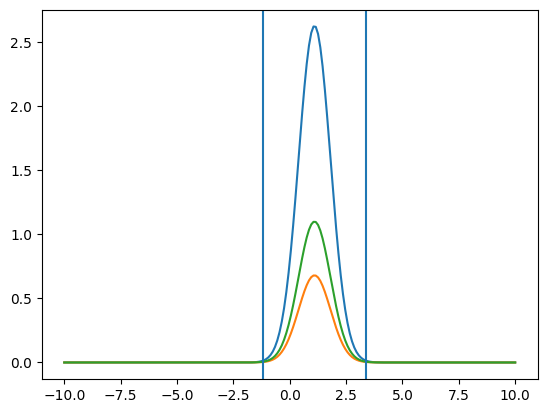

*Extracting Pieces for TH1*
Available Functions:
	Num_Xbins(TH1_) returns number of X bins for a TH1
	XEdges_1d(TH1_) returns edges of x bins for a TH1
	Center_Xbins(TH1_) returns center values for x bins for a TH1
	Values_1d(TH1_) returns the y values for a TH1
	Errors_1d(TH1_) returns the error values for TH1
	Errors2_1d(TH1_) returns the squared error values for TH1
Enjoy using TH1s

You have access to information regarding all bin numbers, bin maxes, bin mins
Each goes _VAR_max_ min, bins, res, etc. 
All the names of them as well as edges.
Q2_Bin_Name[ 5 ]
W_Bin_Name[ 29 ]
MM1_Bin_Name[ 14 ]
MM2_Bin_Name[ 14 ]
theta_Bin_Name[ 10 ]
alpha_Bin_Name[ 10 ]
phi_Bin_Name[ 10 ]
_var_set_name_ [i]
_Xij_name_[i][j]
Also _mm1_name_ etc. for all Xijs
def Q2_Corr(Q2bin_) corrects the cross section for simulation so far as Q2 is concerned
def Xij_Bin_Name(var_, Xij_, Xijbin_,Wbin_=0):
def Xij_Plot_Name(var_, Xij_, Xijbin_,Wbin_=0):
def Xij_Var_Name(var_, Xij_):


In [2]:
#Gain access to functions used to change some of the aspects regarding arrays and the things in them
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/Bin\ Conversions.ipynb

#Gain Access to functions used to work with momentum binning
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/Momentum\ Bins.ipynb

#Gain Access to functions used to work with Fitting Functions
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/Fitting\ Functions.ipynb

#Gain Access to functions used for TH2s 
#uproot or uproo4
#%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/TH2\ Functions.ipynb
#uproot3
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/TH1\ Functions-uproot3.ipynb

#Gain Access to the proper binning for the the various variables
%run /Users/cmc/analysis_phd/fitting/single_diff/Friend\ Binning\ Values.ipynb

In [3]:
#date="06-13-2022"
date="07-22-2024"
par="zero"
sim="sim"
run="e16"

SLURM_ID="13866486"
top="m"+par
dir="/Users/cmc/analysis_phd/root_files/cut_determination/cut_det_"+run+"/"+date
#root_file=dir+"/exp_mm_"+par+"_e16_"+date+"_"+SLURM_ID+".root"
root_file=dir+"/"+sim+"_"+run+"_clas6_mm_"+par+"_"+date+".root"
file=uproot3.open(root_file)

In [4]:
Particle=''
if par == "pro":
    Particle = "Proton"
elif par == "pip":
    Particle = "\u03C0 +"
elif par == "pim":
    Particle = "\u03C0 -"
else:
    Particle = "Explicit"

In [5]:
#The Various layers of TDirectories to get to the histograms
layer0='MM'
layer1='MM_'+top
layer2=layer1+"_no-cut"
layer3=[layer2+"_sec"+str(i+1) for i in range(6)]
layer4=[layer3[i]+"_clean" for i in range(6)]
layer51=[layer4[i]+"_W_dep" for i in range(6)]
layer52=[layer4[i]+"_W_Range" for i in range(6)]
dir_loc=[([layer0+'/'+layer1+'/'+layer2+'/'+layer3[i]+'/'+layer4[i]+'/'+layer51[i]],[layer0+'/'+layer1+'/'+layer2+'/'+layer3[i]+'/'+layer4[i]+'/'+layer52[i]]) for i in range(6)]
names1=[["MM_"+top+"_no-cut_clean_sec"+str(i+1)+"_W:"+W_Bin_Name[j] for j in range(_W_bins_)] for i in range(6)]
names2=["MM_"+top+"_no-cut_clean_sec"+str(i+1)+"_W:in_range" for i in range(6)]
#Histogram Names
hist_name=[[[file[dir_loc[i][0][0]][names1[i][j]] for j in range(_W_bins_)],file[dir_loc[i][1][0]][names2[i]]] for i in range(6)]
          

In [6]:
def sign(n_):
    if n_ >= 0:
        return 1
    else:
        return -1
    
cut_names =["tight","mid","loose"]
color_order=['b','g','r']
cut_width = [2.5,3,3.5]

initial bw fit:  [ 4.78608989e+00 -3.05490044e-04  4.70056659e-04]
input parameters for r2 [ 4.78608989e+00 -3.05490044e-04  4.70056659e-04  5.00000000e+00
 -8.08201518e-04  5.76255640e-04]
r2 parameters [ 4.35196465e+00 -1.36350884e-04  1.65136353e-04  2.53989754e+00
 -6.25756439e-04  7.31950490e-04]
-6.321848189062854e-08 1.00401608854414e-07
Main Gaus Peak [ 4.35196465e+00 -1.36350884e-04  1.65136353e-04]
Gaus2 [ 2.53989754e+00 -6.25756439e-04  7.31950490e-04]


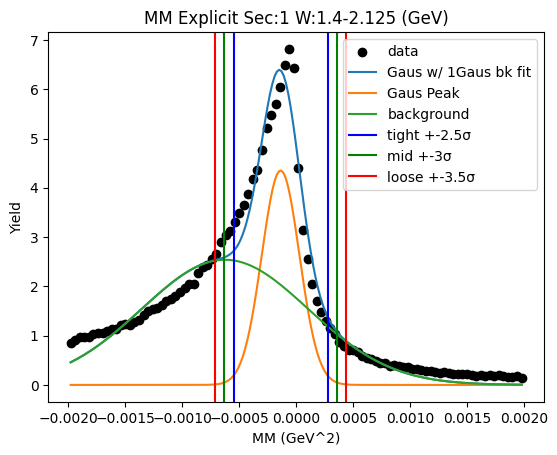

W bin: 0 1.400GeV-1.425GeV
initial Gaus fit:  [ 0.02295678 -0.00016682  0.00021966]
2nd level W dependent
W1_ini_pars: [ 0.02295678 -0.00016682  0.00021966  0.00947786 -0.00060779  0.00061885]
Gaus1 Peak: [ 0.0171581  -0.00012925  0.00014695]
Gaus2 Peak: [ 0.0094779  -0.00060779  0.00061885]
tight should be -0.0004966155636541948   0.0002381187255055717
[[-0.00049662  0.          0.        ]
 [ 0.00023812  0.          0.        ]]
mid should be -0.0005700889925701715   0.0003115921544215484
[[-0.00049662 -0.00057009  0.        ]
 [ 0.00023812  0.00031159  0.        ]]
loose should be -0.0006435624214861482   0.000385065583337525
[[-0.00049662 -0.00057009 -0.00064356]
 [ 0.00023812  0.00031159  0.00038507]]
-4.8074983246844026e-08 8.148529091326174e-08
Main Gaus Peak [ 0.0171581  -0.00012925  0.00014695]
Gaus2 [ 0.0094779  -0.00060779  0.00061885]


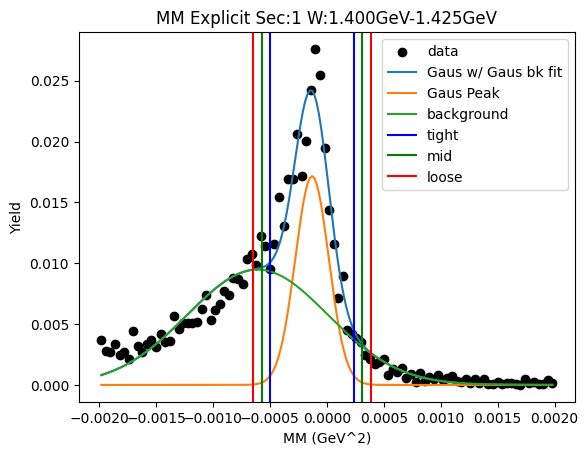

W bin: 1 1.425GeV-1.450GeV
initial Gaus fit:  [ 0.0374909  -0.00016007  0.00020702]
2nd level W dependent
W1_ini_pars: [ 0.0374909  -0.00016007  0.00020702  0.0094779  -0.00060779  0.00061885]
Gaus1 Peak: [ 0.02871905 -0.00012336  0.00013612]
Gaus2 Peak: [ 0.01521005 -0.00061704  0.00062875]
tight should be -0.0004636664213729288   0.00021695533023571734
[[-0.00046367  0.          0.        ]
 [ 0.00021696  0.          0.        ]]
mid should be -0.0005317285965337934   0.00028501750539658194
[[-0.00046367 -0.00053173  0.        ]
 [ 0.00021696  0.00028502  0.        ]]
loose should be -0.000599790771694658   0.0003530796805574465
[[-0.00046367 -0.00053173 -0.00059979]
 [ 0.00021696  0.00028502  0.00035308]]
-4.037292562901022e-08 7.080610687406695e-08
Main Gaus Peak [ 0.02871905 -0.00012336  0.00013612]
Gaus2 [ 0.01521005 -0.00061704  0.00062875]


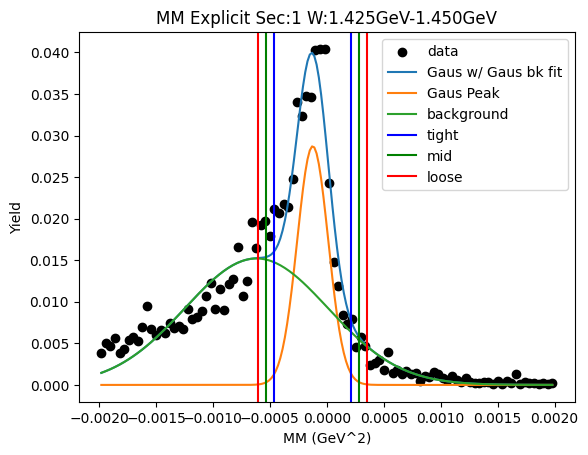

W bin: 2 1.450GeV-1.475GeV
initial Gaus fit:  [ 0.05592708 -0.00016277  0.00022091]
2nd level W dependent
W1_ini_pars: [ 0.05592708 -0.00016277  0.00022091  0.01521005 -0.00061704  0.00062875]
Gaus1 Peak: [ 0.04239215 -0.00013111  0.00015692]
Gaus2 Peak: [ 0.02143994 -0.00062789  0.00064382]
tight should be -0.000523402434403298   0.00026118774255671974
[[-0.0005234   0.          0.        ]
 [ 0.00026119  0.          0.        ]]
mid should be -0.0006018614520992997   0.00033964676025272154
[[-0.0005234  -0.00060186  0.        ]
 [ 0.00026119  0.00033965  0.        ]]
loose should be -0.0006803204697953015   0.00041810577794872323
[[-0.0005234  -0.00060186 -0.00068032]
 [ 0.00026119  0.00033965  0.00041811]]
-5.668067333880923e-08 9.105894564890722e-08
Main Gaus Peak [ 0.04239215 -0.00013111  0.00015692]
Gaus2 [ 0.02143994 -0.00062789  0.00064382]


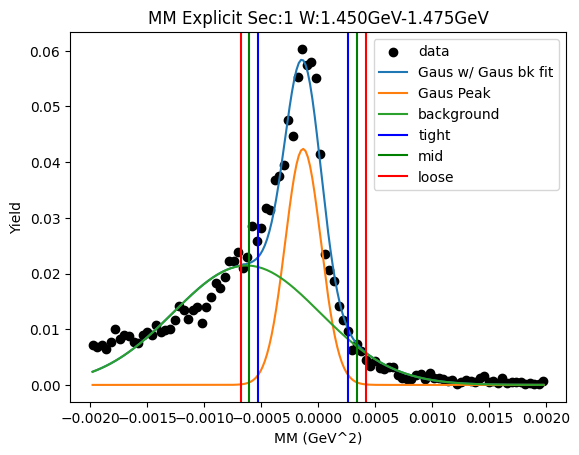

W bin: 3 1.475GeV-1.500GeV
initial Gaus fit:  [ 0.07435149 -0.00016254  0.00022522]
2nd level W dependent
W1_ini_pars: [ 0.07435149 -0.00016254  0.00022522  0.02143994 -0.00062789  0.00064382]
Gaus1 Peak: [ 0.05639947 -0.00012735  0.00016262]
Gaus2 Peak: [ 0.02888984 -0.00066522  0.00065679]
tight should be -0.0005339097433494126   0.00027921406110122137
[[-0.00053391  0.          0.        ]
 [ 0.00027921  0.          0.        ]]
mid should be -0.0006152221237944759   0.0003605264415462848
[[-0.00053391 -0.00061522  0.        ]
 [ 0.00027921  0.00036053  0.        ]]
loose should be -0.0006965345042395393   0.0004418388219913481
[[-0.00053391 -0.00061522 -0.00069653]
 [ 0.00027921  0.00036053  0.00044184]]
-6.312296592474484e-08 9.555791120268062e-08
Main Gaus Peak [ 0.05639947 -0.00012735  0.00016262]
Gaus2 [ 0.02888984 -0.00066522  0.00065679]


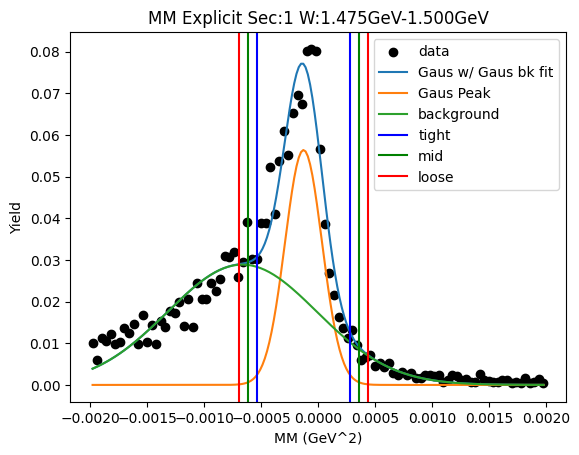

W bin: 4 1.500GeV-1.525GeV
initial Gaus fit:  [ 0.09216439 -0.00016397  0.00022312]
2nd level W dependent
W1_ini_pars: [ 0.09216439 -0.00016397  0.00022312  0.02888984 -0.00066522  0.00065679]
Gaus1 Peak: [ 0.06850324 -0.00012701  0.00014904]
Gaus2 Peak: [ 0.03878096 -0.00064318  0.00066222]
tight should be -0.0004996147893935963   0.0002455911246833553
[[-0.00049961  0.          0.        ]
 [ 0.00024559  0.          0.        ]]
mid should be -0.0005741353808012915   0.0003201117160910504
[[-0.00049961 -0.00057414  0.        ]
 [ 0.00024559  0.00032011  0.        ]]
loose should be -0.0006486559722089865   0.00039463230749874555
[[-0.00049961 -0.00057414 -0.00064866]
 [ 0.00024559  0.00032011  0.00039463]]
-5.050781696682654e-08 8.277182808323702e-08
Main Gaus Peak [ 0.06850324 -0.00012701  0.00014904]
Gaus2 [ 0.03878096 -0.00064318  0.00066222]


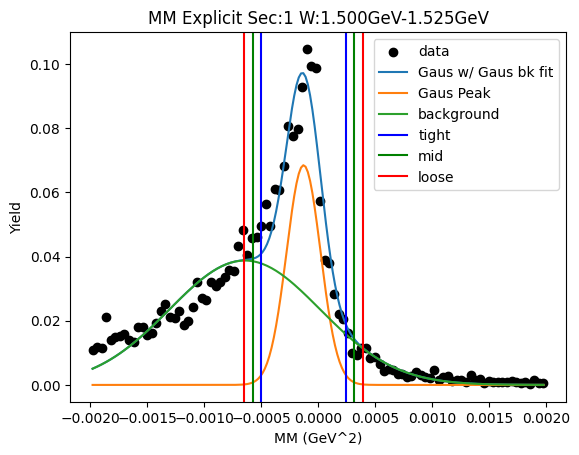

W bin: 5 1.525GeV-1.550GeV
initial Gaus fit:  [ 0.10394055 -0.00017048  0.00023016]
2nd level W dependent
W1_ini_pars: [ 0.10394055 -0.00017048  0.00023016  0.03878096 -0.00064318  0.00066222]
Gaus1 Peak: [ 0.07800722 -0.00015124  0.00017939]
Gaus2 Peak: [ 0.03647562 -0.00067533  0.00072069]
tight should be -0.0005997164242127493   0.000297226983699833
[[-0.00059972  0.          0.        ]
 [ 0.00029723  0.          0.        ]]
mid should be -0.0006894107650040074   0.00038692132449109115
[[-0.00059972 -0.00068941  0.        ]
 [ 0.00029723  0.00038692  0.        ]]
loose should be -0.0007791051057952657   0.0004766156652823494
[[-0.00059972 -0.00068941 -0.00077911]
 [ 0.00029723  0.00038692  0.00047662]]
-7.366593183428613e-08 1.194158626451947e-07
Main Gaus Peak [ 0.07800722 -0.00015124  0.00017939]
Gaus2 [ 0.03647562 -0.00067533  0.00072069]


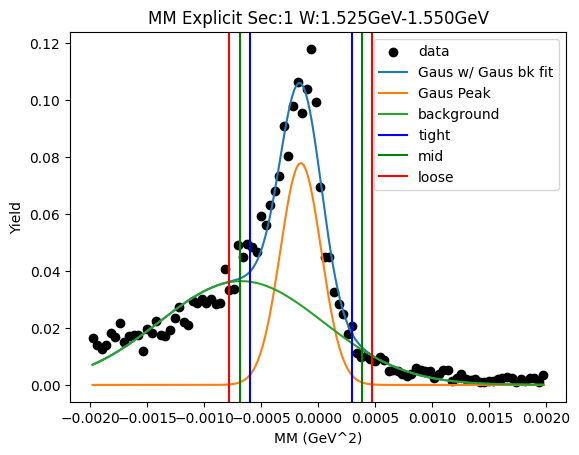

W bin: 6 1.550GeV-1.575GeV
initial Gaus fit:  [ 0.10387783 -0.00015715  0.00023805]
2nd level W dependent
W1_ini_pars: [ 0.10387783 -0.00015715  0.00023805  0.03647562 -0.00067533  0.00072069]
Gaus1 Peak: [ 0.07671393 -0.0001214   0.00015274]
Gaus2 Peak: [ 0.04305581 -0.00060845  0.00071044]
tight should be -0.0005032495162856749   0.00026044124436523853
[[-0.00050325  0.          0.        ]
 [ 0.00026044  0.          0.        ]]
mid should be -0.0005796185923507662   0.00033681032043032983
[[-0.00050325 -0.00057962  0.        ]
 [ 0.00026044  0.00033681  0.        ]]
loose should be -0.0006559876684158575   0.00041317939649542114
[[-0.00050325 -0.00057962 -0.00065599]
 [ 0.00026044  0.00033681  0.00041318]]
-5.524786512018132e-08 8.47257935766756e-08
Main Gaus Peak [ 0.07671393 -0.0001214   0.00015274]
Gaus2 [ 0.04305581 -0.00060845  0.00071044]


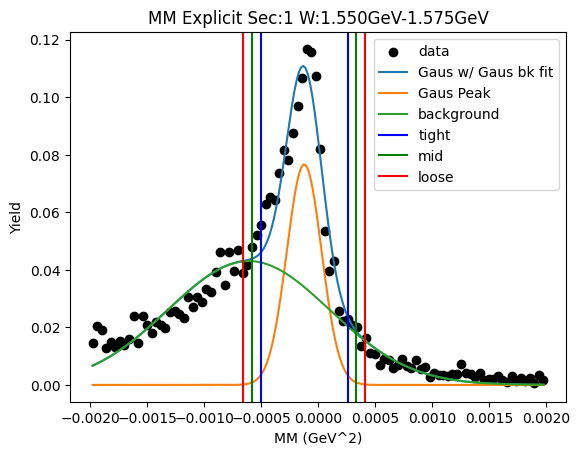

W bin: 7 1.575GeV-1.600GeV
initial Gaus fit:  [ 0.10386799 -0.00016346  0.00025075]
2nd level W dependent
W1_ini_pars: [ 0.10386799 -0.00016346  0.00025075  0.04305581 -0.00060845  0.00071044]
Gaus1 Peak: [ 0.07359914 -0.00012989  0.00016729]
Gaus2 Peak: [ 0.04436392 -0.00060256  0.00070558]
tight should be -0.000548122175819098   0.00028834491255403543
[[-0.00054812  0.          0.        ]
 [ 0.00028834  0.          0.        ]]
mid should be -0.0006317688846564114   0.00037199162139134876
[[-0.00054812 -0.00063177  0.        ]
 [ 0.00028834  0.00037199  0.        ]]
loose should be -0.0007154155934937247   0.0004556383302286621
[[-0.00054812 -0.00063177 -0.00071542]
 [ 0.00028834  0.00037199  0.00045564]]
-6.709020616439989e-08 1.0083231941914269e-07
Main Gaus Peak [ 0.07359914 -0.00012989  0.00016729]
Gaus2 [ 0.04436392 -0.00060256  0.00070558]


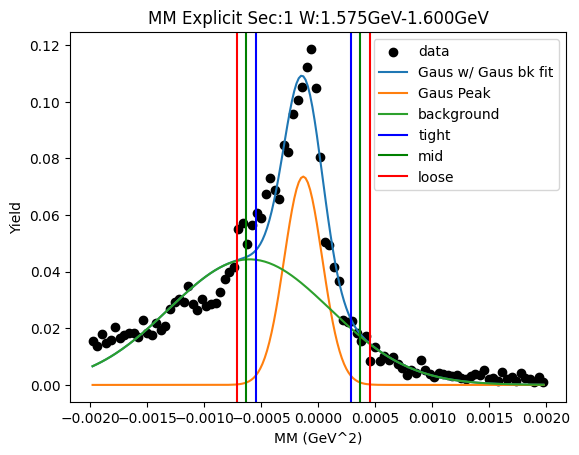

W bin: 8 1.600GeV-1.625GeV
initial Gaus fit:  [ 0.12026767 -0.00017056  0.00024078]
2nd level W dependent
W1_ini_pars: [ 0.12026767 -0.00017056  0.00024078  0.04436392 -0.00060256  0.00070558]
Gaus1 Peak: [ 0.08784972 -0.00014991  0.00018518]
Gaus2 Peak: [ 0.04435402 -0.0006809   0.00076253]
tight should be -0.0006128546015432344   0.00031303945619774384
[[-0.00061285  0.          0.        ]
 [ 0.00031304  0.          0.        ]]
mid should be -0.0007054440073173322   0.00040562886197184167
[[-0.00061285 -0.00070544  0.        ]
 [ 0.00031304  0.00040563  0.        ]]
loose should be -0.0007980334130914301   0.0004982182677459395
[[-0.00061285 -0.00070544 -0.00079803]
 [ 0.00031304  0.00040563  0.00049822]]
-8.040129639457208e-08 1.2534585708384088e-07
Main Gaus Peak [ 0.08784972 -0.00014991  0.00018518]
Gaus2 [ 0.04435402 -0.0006809   0.00076253]


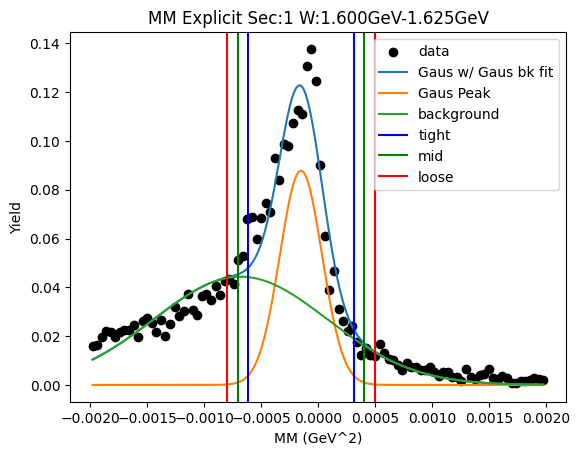

W bin: 9 1.625GeV-1.650GeV
initial Gaus fit:  [ 0.15219681 -0.00016217  0.00023093]
2nd level W dependent
W1_ini_pars: [ 0.15219681 -0.00016217  0.00023093  0.04435402 -0.0006809   0.00076253]
Gaus1 Peak: [ 0.11221015 -0.00012871  0.00015701]
Gaus2 Peak: [ 0.06144819 -0.00061651  0.00067954]
tight should be -0.0005212373409436049   0.00026382585645206544
[[-0.00052124  0.          0.        ]
 [ 0.00026383  0.          0.        ]]
mid should be -0.0005997436606831718   0.0003423321761916325
[[-0.00052124 -0.00059974  0.        ]
 [ 0.00026383  0.00034233  0.        ]]
loose should be -0.0006782499804227388   0.00042083849593119947
[[-0.00052124 -0.00059974 -0.00067825]
 [ 0.00026383  0.00034233  0.00042084]]
-5.739373878157908e-08 9.052407495564809e-08
Main Gaus Peak [ 0.11221015 -0.00012871  0.00015701]
Gaus2 [ 0.06144819 -0.00061651  0.00067954]


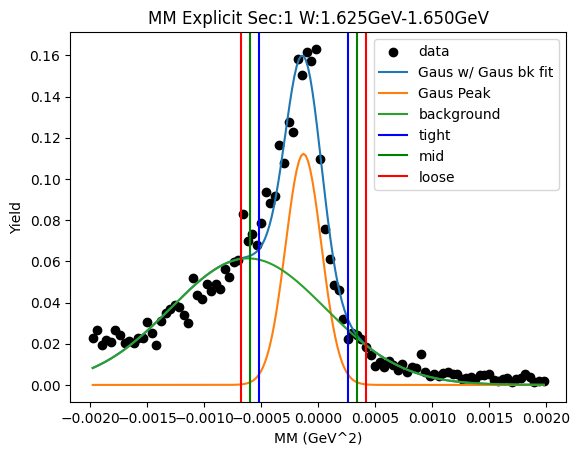

W bin: 10 1.650GeV-1.675GeV
initial Gaus fit:  [ 1.68399933e-01 -1.53309390e-04  2.34134964e-04]
2nd level W dependent
W1_ini_pars: [ 1.68399933e-01 -1.53309390e-04  2.34134964e-04  6.14481898e-02
 -6.16508372e-04  6.79544999e-04]
Gaus1 Peak: [ 0.12049344 -0.00012208  0.00015717]
Gaus2 Peak: [ 0.07071697 -0.00059763  0.00069512]
tight should be -0.0005150040403742527   0.0002708471721588632
[[-0.000515    0.          0.        ]
 [ 0.00027085  0.          0.        ]]
mid should be -0.0005935891616275642   0.00034943229341217476
[[-0.000515   -0.00059359  0.        ]
 [ 0.00027085  0.00034943  0.        ]]
loose should be -0.0006721742828808758   0.00042801741466548635
[[-0.000515   -0.00059359 -0.00067217]
 [ 0.00027085  0.00034943  0.00042802]]
-5.920431131458544e-08 8.901059946295899e-08
Main Gaus Peak [ 0.12049344 -0.00012208  0.00015717]
Gaus2 [ 0.07071697 -0.00059763  0.00069512]


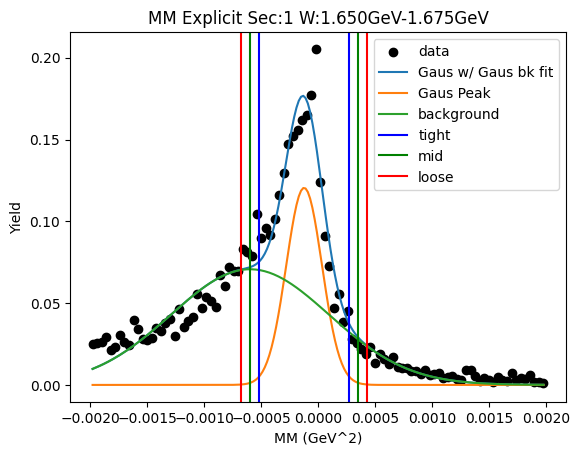

W bin: 11 1.675GeV-1.700GeV
initial Gaus fit:  [ 2.00325050e-01 -1.60296594e-04  2.32033723e-04]
2nd level W dependent
W1_ini_pars: [ 2.00325050e-01 -1.60296594e-04  2.32033723e-04  7.07169721e-02
 -5.97632053e-04  6.95116011e-04]
Gaus1 Peak: [ 1.45224895e-01 -1.26650950e-04  1.60954948e-04]
Gaus2 Peak: [ 0.08254258 -0.00063616  0.00069465]
tight should be -0.0005290383192880141   0.00027573641829810503
[[-0.00052904  0.          0.        ]
 [ 0.00027574  0.          0.        ]]
mid should be -0.000609515793046626   0.000356213892056717
[[-0.00052904 -0.00060952  0.        ]
 [ 0.00027574  0.00035621  0.        ]]
loose should be -0.0006899932668052379   0.0004366913658153289
[[-0.00052904 -0.00060952 -0.00068999]
 [ 0.00027574  0.00035621  0.00043669]]
-6.167902212954141e-08 9.375994865209224e-08
Main Gaus Peak [ 1.45224895e-01 -1.26650950e-04  1.60954948e-04]
Gaus2 [ 0.08254258 -0.00063616  0.00069465]


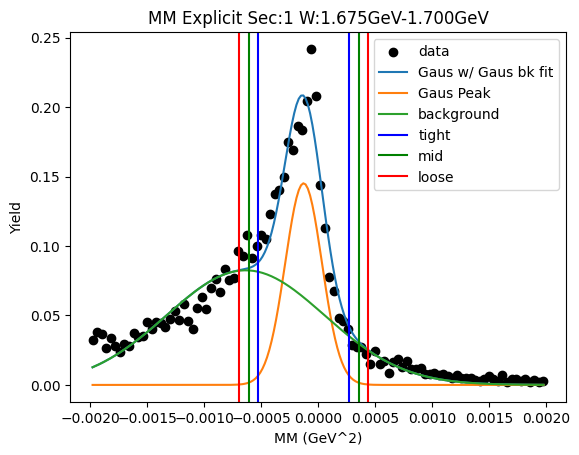

W bin: 12 1.700GeV-1.725GeV
initial Gaus fit:  [ 2.38940244e-01 -1.71930970e-04  2.33743526e-04]
2nd level W dependent
W1_ini_pars: [ 2.38940244e-01 -1.71930970e-04  2.33743526e-04  8.25425785e-02
 -6.36163016e-04  6.94651677e-04]
Gaus1 Peak: [ 1.73602807e-01 -1.44662057e-04  1.66463288e-04]
Gaus2 Peak: [ 0.09480727 -0.00064035  0.00070583]
tight should be -0.000560820276001357   0.00027149616195718576
[[-0.00056082  0.          0.        ]
 [ 0.0002715   0.          0.        ]]
mid should be -0.0006440519197972114   0.0003547278057530401
[[-0.00056082 -0.00064405  0.        ]
 [ 0.0002715   0.00035473  0.        ]]
loose should be -0.0007272835635930655   0.0004379594495488943
[[-0.00056082 -0.00064405 -0.00072728]
 [ 0.0002715   0.00035473  0.00043796]]
-6.220296760565847e-08 1.0405718908938076e-07
Main Gaus Peak [ 1.73602807e-01 -1.44662057e-04  1.66463288e-04]
Gaus2 [ 0.09480727 -0.00064035  0.00070583]


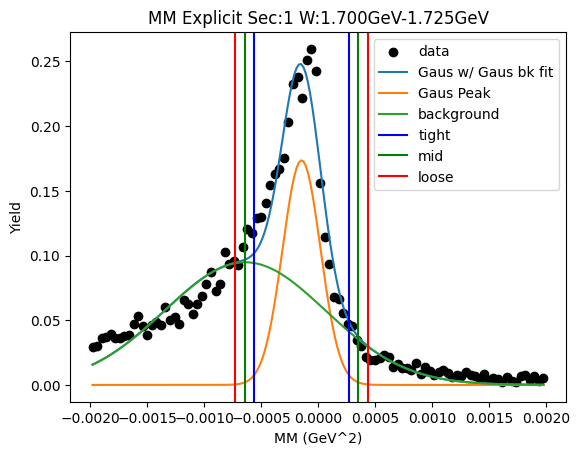

W bin: 13 1.725GeV-1.750GeV
initial Gaus fit:  [ 2.34879711e-01 -1.68109530e-04  2.56675827e-04]
2nd level W dependent
W1_ini_pars: [ 2.34879711e-01 -1.68109530e-04  2.56675827e-04  9.48072659e-02
 -6.40347232e-04  7.05826323e-04]
Gaus1 Peak: [ 1.65298774e-01 -1.42454761e-04  1.90455590e-04]
Gaus2 Peak: [ 0.09489229 -0.00065282  0.00074217]
tight should be -0.0006185937345667902   0.00033368421320263827
[[-0.00061859  0.          0.        ]
 [ 0.00033368  0.          0.        ]]
mid should be -0.000713821529343733   0.00042891200797958107
[[-0.00061859 -0.00071382  0.        ]
 [ 0.00033368  0.00042891  0.        ]]
loose should be -0.0008090493241206759   0.0005241398027565239
[[-0.00061859 -0.00071382 -0.00080905]
 [ 0.00033368  0.00042891  0.00052414]]
-8.852663593596697e-08 1.2911335361794204e-07
Main Gaus Peak [ 1.65298774e-01 -1.42454761e-04  1.90455590e-04]
Gaus2 [ 0.09489229 -0.00065282  0.00074217]


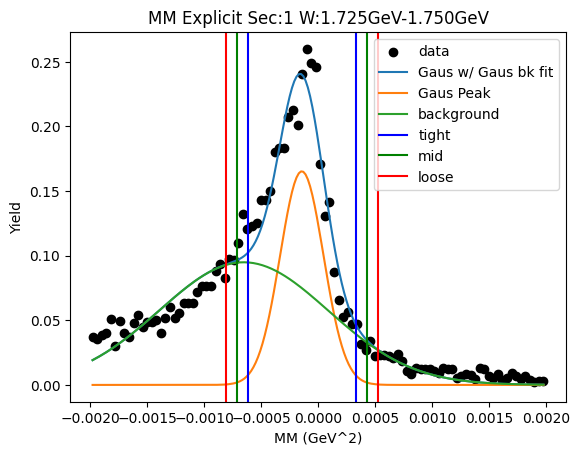

W bin: 14 1.750GeV-1.775GeV
initial Gaus fit:  [ 2.52204331e-01 -1.61441296e-04  2.33327537e-04]
2nd level W dependent
W1_ini_pars: [ 2.52204331e-01 -1.61441296e-04  2.33327537e-04  9.48922942e-02
 -6.52822473e-04  7.42168851e-04]
Gaus1 Peak: [ 1.81497020e-01 -1.30365560e-04  1.52866206e-04]
Gaus2 Peak: [ 0.10455406 -0.00058877  0.00071415]
tight should be -0.0005125310747814721   0.0002517999546155853
[[-0.00051253  0.          0.        ]
 [ 0.0002518   0.          0.        ]]
mid should be -0.0005889641777211779   0.000328233057555291
[[-0.00051253 -0.00058896  0.        ]
 [ 0.0002518   0.00032823  0.        ]]
loose should be -0.0006653972806608837   0.0004046661604949968
[[-0.00051253 -0.00058896 -0.0006654 ]
 [ 0.0002518   0.00032823  0.00040467]]
-5.310905144416031e-08 8.709940995563939e-08
Main Gaus Peak [ 1.81497020e-01 -1.30365560e-04  1.52866206e-04]
Gaus2 [ 0.10455406 -0.00058877  0.00071415]


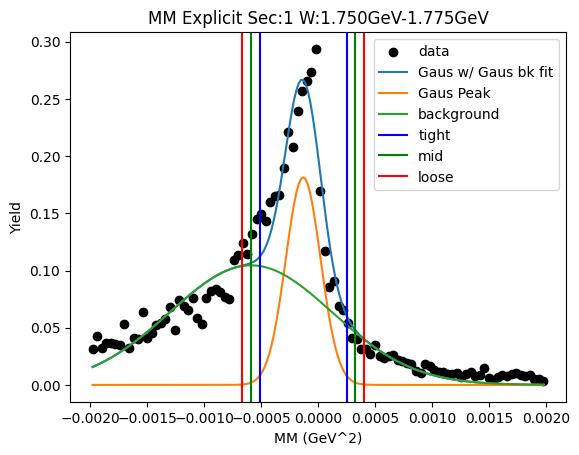

W bin: 15 1.775GeV-1.800GeV
initial Gaus fit:  [ 2.36103791e-01 -1.64467228e-04  2.38767873e-04]
2nd level W dependent
W1_ini_pars: [ 2.36103791e-01 -1.64467228e-04  2.38767873e-04  1.04554062e-01
 -5.88769102e-04  7.14150850e-04]
Gaus1 Peak: [ 1.65357496e-01 -1.36536321e-04  1.64485693e-04]
Gaus2 Peak: [ 0.0995865  -0.00061444  0.0007256 ]
tight should be -0.0005477505542064022   0.00027467791283922866
[[-0.00054775  0.          0.        ]
 [ 0.00027468  0.          0.        ]]
mid should be -0.0006299934009109654   0.00035692075954379173
[[-0.00054775 -0.00062999  0.        ]
 [ 0.00027468  0.00035692  0.        ]]
loose should be -0.0007122362476155284   0.0004391636062483548
[[-0.00054775 -0.00062999 -0.00071224]
 [ 0.00027468  0.00035692  0.00043916]]
-6.252446314303191e-08 9.980879687465442e-08
Main Gaus Peak [ 1.65357496e-01 -1.36536321e-04  1.64485693e-04]
Gaus2 [ 0.0995865  -0.00061444  0.0007256 ]


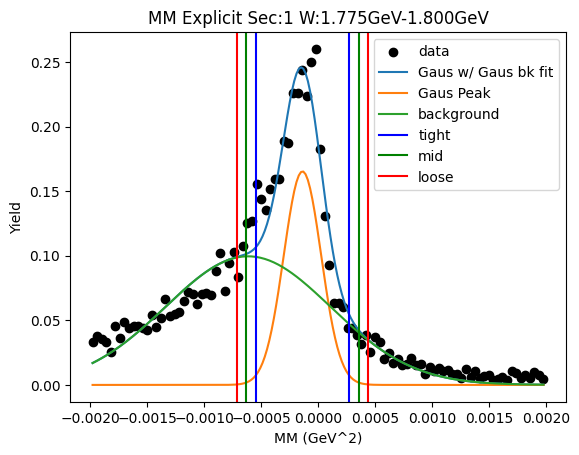

W bin: 16 1.800GeV-1.825GeV
initial Gaus fit:  [ 2.61610061e-01 -1.58247551e-04  2.33374310e-04]
2nd level W dependent
W1_ini_pars: [ 2.61610061e-01 -1.58247551e-04  2.33374310e-04  9.95865021e-02
 -6.14441734e-04  7.25598913e-04]
Gaus1 Peak: [ 1.87361492e-01 -1.30579929e-04  1.62829199e-04]
Gaus2 Peak: [ 0.10783152 -0.00064794  0.00073513]
tight should be -0.0005376529276929886   0.000276493068801439
[[-0.00053765  0.          0.        ]
 [ 0.00027649  0.          0.        ]]
mid should be -0.0006190675273424314   0.00035790766845088175
[[-0.00053765 -0.00061907  0.        ]
 [ 0.00027649  0.00035791  0.        ]]
loose should be -0.0007004821269918741   0.0004393222681003245
[[-0.00053765 -0.00061907 -0.00070048]
 [ 0.00027649  0.00035791  0.00043932]]
-6.248892645888502e-08 9.659116240701206e-08
Main Gaus Peak [ 1.87361492e-01 -1.30579929e-04  1.62829199e-04]
Gaus2 [ 0.10783152 -0.00064794  0.00073513]


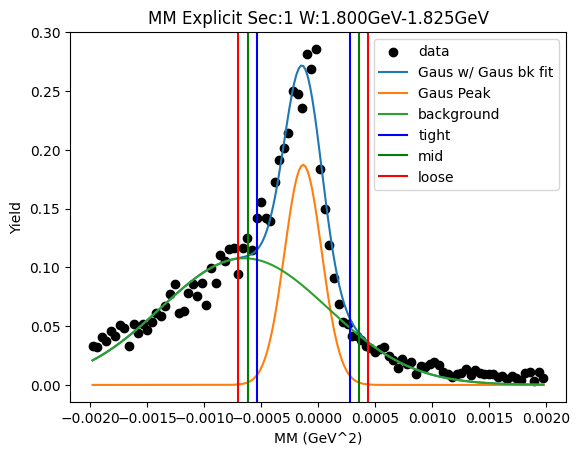

W bin: 17 1.825GeV-1.850GeV
initial Gaus fit:  [ 2.64255775e-01 -1.74252484e-04  2.55724247e-04]
2nd level W dependent
W1_ini_pars: [ 2.64255775e-01 -1.74252484e-04  2.55724247e-04  1.07831518e-01
 -6.47936537e-04  7.35134707e-04]
Gaus1 Peak: [ 1.85039131e-01 -1.56545970e-04  1.92636119e-04]
Gaus2 Peak: [ 0.10486792 -0.00065763  0.00077185]
tight should be -0.0006381362658553807   0.00032504432673827167
[[-0.00063814  0.          0.        ]
 [ 0.00032504  0.          0.        ]]
mid should be -0.0007344543251147458   0.00042136238599763695
[[-0.00063814 -0.00073445  0.        ]
 [ 0.00032504  0.00042136  0.        ]]
loose should be -0.0008307723843741111   0.0005176804452570022
[[-0.00063814 -0.00073445 -0.00083077]
 [ 0.00032504  0.00042136  0.00051768]]
-8.681938188885926e-08 1.3583266305891497e-07
Main Gaus Peak [ 1.85039131e-01 -1.56545970e-04  1.92636119e-04]
Gaus2 [ 0.10486792 -0.00065763  0.00077185]


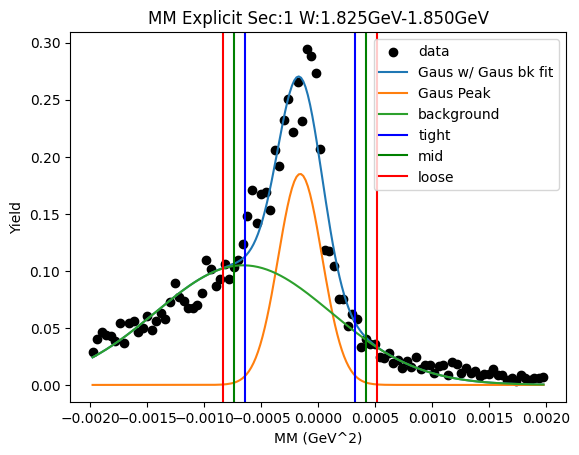

W bin: 18 1.850GeV-1.875GeV
initial Gaus fit:  [ 2.63520770e-01 -1.70124939e-04  2.48893734e-04]
2nd level W dependent
W1_ini_pars: [ 2.63520770e-01 -1.70124939e-04  2.48893734e-04  1.04867917e-01
 -6.57631409e-04  7.71848592e-04]
Gaus1 Peak: [ 1.87234930e-01 -1.43311126e-04  1.70058825e-04]
Gaus2 Peak: [ 0.10770904 -0.0006301   0.00077071]
tight should be -0.0005684581881876187   0.00028183593648706436
[[-0.00056846  0.          0.        ]
 [ 0.00028184  0.          0.        ]]
mid should be -0.000653487600655087   0.00036686534895453266
[[-0.00056846 -0.00065349  0.        ]
 [ 0.00028184  0.00036687  0.        ]]
loose should be -0.0007385170131225553   0.00045189476142200096
[[-0.00056846 -0.00065349 -0.00073852]
 [ 0.00028184  0.00036687  0.00045189]]
-6.622193302228027e-08 1.0729809060722823e-07
Main Gaus Peak [ 1.87234930e-01 -1.43311126e-04  1.70058825e-04]
Gaus2 [ 0.10770904 -0.0006301   0.00077071]


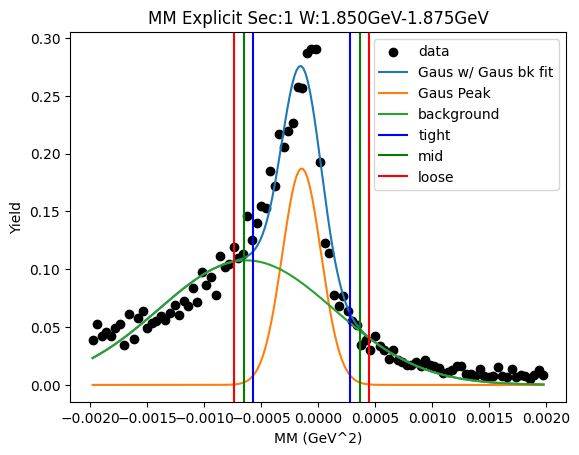

W bin: 19 1.875GeV-1.900GeV
initial Gaus fit:  [ 2.55409569e-01 -1.70254913e-04  2.57407646e-04]
2nd level W dependent
W1_ini_pars: [ 2.55409569e-01 -1.70254913e-04  2.57407646e-04  1.07709042e-01
 -6.30098697e-04  7.70714641e-04]
Gaus1 Peak: [ 1.79437955e-01 -1.34112586e-04  1.62797937e-04]
Gaus2 Peak: [ 0.11377955 -0.00062603  0.00074702]
tight should be -0.0005411074299023811   0.00027288225719289774
[[-0.00054111  0.          0.        ]
 [ 0.00027288  0.          0.        ]]
mid should be -0.000622506398611909   0.0003542812259024256
[[-0.00054111 -0.00062251  0.        ]
 [ 0.00027288  0.00035428  0.        ]]
loose should be -0.0007039053673214369   0.00043568019461195354
[[-0.00054111 -0.00062251 -0.00070391]
 [ 0.00027288  0.00035428  0.00043568]]
-6.152331946493834e-08 9.749569110245445e-08
Main Gaus Peak [ 1.79437955e-01 -1.34112586e-04  1.62797937e-04]
Gaus2 [ 0.11377955 -0.00062603  0.00074702]


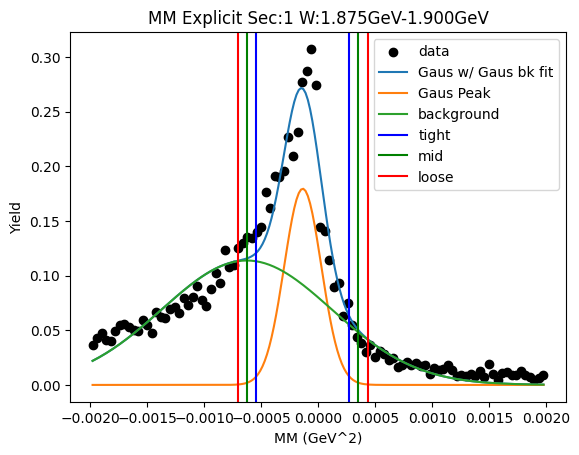

W bin: 20 1.900GeV-1.925GeV
initial Gaus fit:  [ 2.93028920e-01 -1.60872999e-04  2.36922761e-04]
2nd level W dependent
W1_ini_pars: [ 2.93028920e-01 -1.60872999e-04  2.36922761e-04  1.13779546e-01
 -6.26032522e-04  7.47016713e-04]
Gaus1 Peak: [ 2.10296109e-01 -1.30641202e-04  1.54663771e-04]
Gaus2 Peak: [ 0.1229347  -0.00061958  0.0007488 ]
tight should be -0.0005173006280172385   0.00025601822494408766
[[-0.0005173   0.          0.        ]
 [ 0.00025602  0.          0.        ]]
mid should be -0.0005946325133133712   0.0003333501102402203
[[-0.0005173  -0.00059463  0.        ]
 [ 0.00025602  0.00033335  0.        ]]
loose should be -0.0006719643986095037   0.0004106819955363529
[[-0.0005173  -0.00059463 -0.00067196]
 [ 0.00025602  0.00033335  0.00041068]]
-5.4695522262530446e-08 8.882976934037068e-08
Main Gaus Peak [ 2.10296109e-01 -1.30641202e-04  1.54663771e-04]
Gaus2 [ 0.1229347  -0.00061958  0.0007488 ]


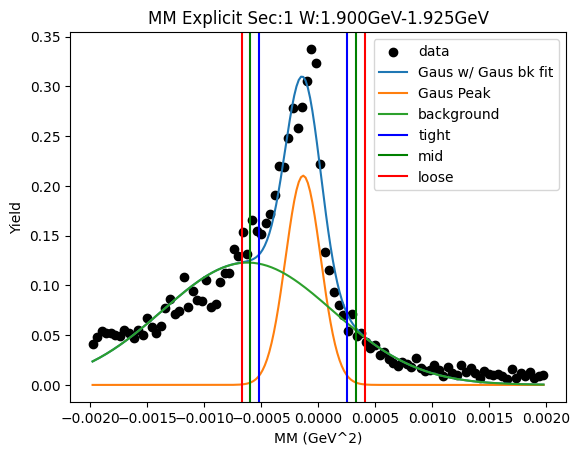

W bin: 21 1.925GeV-1.950GeV
initial Gaus fit:  [ 3.19159886e-01 -1.70690359e-04  2.38807511e-04]
2nd level W dependent
W1_ini_pars: [ 3.19159886e-01 -1.70690359e-04  2.38807511e-04  1.22934702e-01
 -6.19583868e-04  7.48804994e-04]
Gaus1 Peak: [ 2.29131575e-01 -1.42184114e-04  1.66482659e-04]
Gaus2 Peak: [ 0.12922275 -0.00064095  0.00073462]
tight should be -0.0005583907615866295   0.00027402253301354017
[[-0.00055839  0.          0.        ]
 [ 0.00027402  0.          0.        ]]
mid should be -0.0006416320910466464   0.00035726386247355717
[[-0.00055839 -0.00064163  0.        ]
 [ 0.00027402  0.00035726  0.        ]]
loose should be -0.0007248734205066634   0.0004405051919335741
[[-0.00055839 -0.00064163 -0.00072487]
 [ 0.00027402  0.00035726  0.00044051]]
-6.293310480780388e-08 1.0336574951870225e-07
Main Gaus Peak [ 2.29131575e-01 -1.42184114e-04  1.66482659e-04]
Gaus2 [ 0.12922275 -0.00064095  0.00073462]


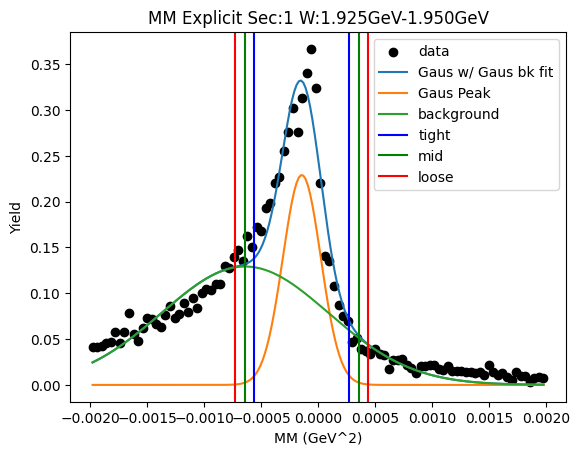

W bin: 22 1.950GeV-1.975GeV
initial Gaus fit:  [ 3.07287309e-01 -1.62390574e-04  2.47028190e-04]
2nd level W dependent
W1_ini_pars: [ 3.07287309e-01 -1.62390574e-04  2.47028190e-04  1.29222746e-01
 -6.40947132e-04  7.34620567e-04]
Gaus1 Peak: [ 2.15433106e-01 -1.19989366e-04  1.47322133e-04]
Gaus2 Peak: [ 0.14299194 -0.00059551  0.00071028]
tight should be -0.0004882946990446301   0.00024831596609897565
[[-0.00048829  0.          0.        ]
 [ 0.00024832  0.          0.        ]]
mid should be -0.0005619557655589908   0.0003219770326133363
[[-0.00048829 -0.00056196  0.        ]
 [ 0.00024832  0.00032198  0.        ]]
loose should be -0.0006356168320733514   0.00039563809912769685
[[-0.00048829 -0.00056196 -0.00063562]
 [ 0.00024832  0.00032198  0.00039564]]
-5.071398457384622e-08 7.950888070694711e-08
Main Gaus Peak [ 2.15433106e-01 -1.19989366e-04  1.47322133e-04]
Gaus2 [ 0.14299194 -0.00059551  0.00071028]


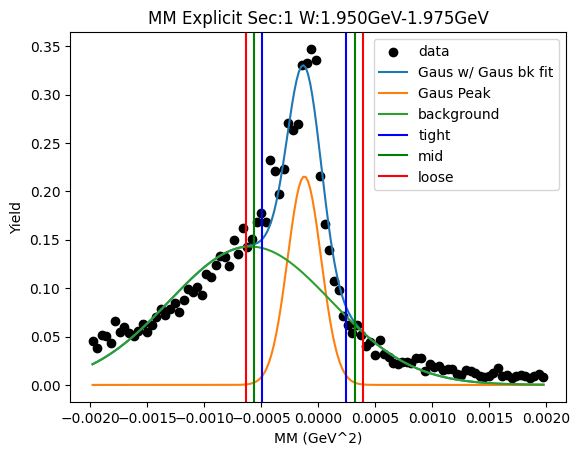

W bin: 23 1.975GeV-2.000GeV
initial Gaus fit:  [ 3.15219279e-01 -1.82393533e-04  2.60842437e-04]
2nd level W dependent
W1_ini_pars: [ 3.15219279e-01 -1.82393533e-04  2.60842437e-04  1.42991943e-01
 -5.95508296e-04  7.10275720e-04]
Gaus1 Peak: [ 2.27355887e-01 -1.53676578e-04  1.84226370e-04]
Gaus2 Peak: [ 0.12254122 -0.00065847  0.00078953]
tight should be -0.0006142425038194824   0.00030688934834608036
[[-0.00061424  0.          0.        ]
 [ 0.00030689  0.          0.        ]]
mid should be -0.0007063556890360387   0.00039900253356263654
[[-0.00061424 -0.00070636  0.        ]
 [ 0.00030689  0.000399    0.        ]]
loose should be -0.000798468874252595   0.0004911157187791928
[[-0.00061424 -0.00070636 -0.00079847]
 [ 0.00030689  0.000399    0.00049112]]
-7.820157614401089e-08 1.2543455723373953e-07
Main Gaus Peak [ 2.27355887e-01 -1.53676578e-04  1.84226370e-04]
Gaus2 [ 0.12254122 -0.00065847  0.00078953]


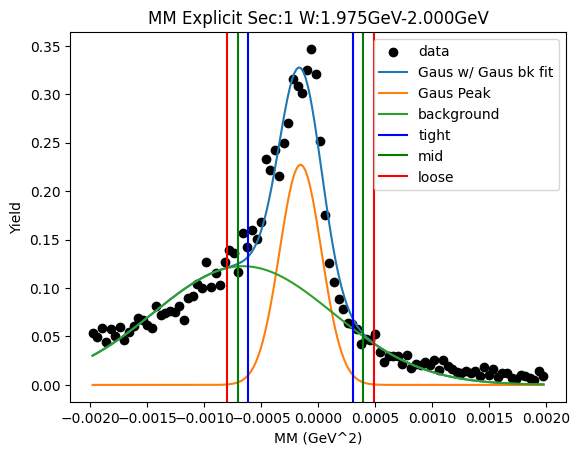

W bin: 24 2.000GeV-2.025GeV
initial Gaus fit:  [ 3.22580125e-01 -1.65205573e-04  2.41810797e-04]
2nd level W dependent
W1_ini_pars: [ 3.22580125e-01 -1.65205573e-04  2.41810797e-04  1.22541217e-01
 -6.58471634e-04  7.89525743e-04]
Gaus1 Peak: [ 2.31659752e-01 -1.28489295e-04  1.46882537e-04]
Gaus2 Peak: [ 0.14251945 -0.00059835  0.00072375]
tight should be -0.0004956956375276962   0.00023871704851353935
[[-0.0004957   0.          0.        ]
 [ 0.00023872  0.          0.        ]]
mid should be -0.0005691369061318198   0.00031215831711766285
[[-0.0004957  -0.00056914  0.        ]
 [ 0.00023872  0.00031216  0.        ]]
loose should be -0.0006425781747359433   0.0003855995857217864
[[-0.0004957  -0.00056914 -0.00064258]
 [ 0.00023872  0.00031216  0.0003856 ]]
-4.821394040726955e-08 8.123293801312303e-08
Main Gaus Peak [ 2.31659752e-01 -1.28489295e-04  1.46882537e-04]
Gaus2 [ 0.14251945 -0.00059835  0.00072375]


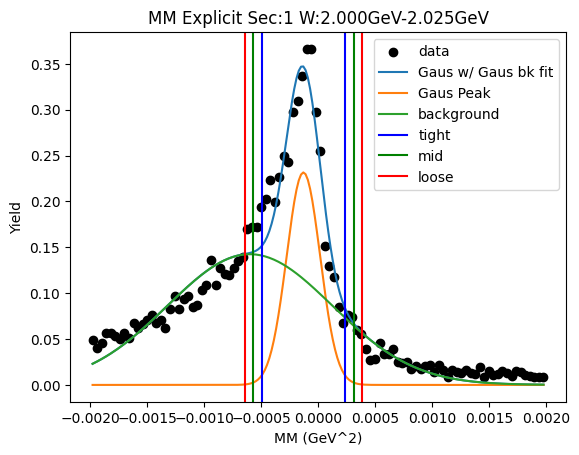

W bin: 25 2.025GeV-2.050GeV
initial Gaus fit:  [ 3.23524140e-01 -1.72394956e-04  2.52217698e-04]
2nd level W dependent
W1_ini_pars: [ 3.23524140e-01 -1.72394956e-04  2.52217698e-04  1.42519447e-01
 -5.98347412e-04  7.23752940e-04]
Gaus1 Peak: [ 2.29373675e-01 -1.49162133e-04  1.81606213e-04]
Gaus2 Peak: [ 0.12898468 -0.00064846  0.00077266]
tight should be -0.0006031776663726251   0.00030485340039871516
[[-0.00060318  0.          0.        ]
 [ 0.00030485  0.          0.        ]]
mid should be -0.0006939807730497593   0.0003956565070758493
[[-0.00060318 -0.00069398  0.        ]
 [ 0.00030485  0.00039566  0.        ]]
loose should be -0.0007847838797268933   0.0004864596137529833
[[-0.00060318 -0.00069398 -0.00078478]
 [ 0.00030485  0.00039566  0.00048646]]
-7.669310826940977e-08 1.2119179210384587e-07
Main Gaus Peak [ 2.29373675e-01 -1.49162133e-04  1.81606213e-04]
Gaus2 [ 0.12898468 -0.00064846  0.00077266]


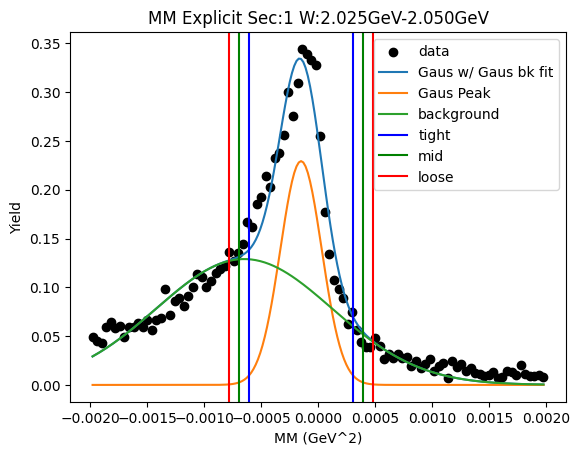

W bin: 26 2.050GeV-2.075GeV
initial Gaus fit:  [ 3.45094678e-01 -1.65399961e-04  2.36181654e-04]
2nd level W dependent
W1_ini_pars: [ 3.45094678e-01 -1.65399961e-04  2.36181654e-04  1.28984678e-01
 -6.48456190e-04  7.72661666e-04]
Gaus1 Peak: [ 2.47064865e-01 -1.43110396e-04  1.64488503e-04]
Gaus2 Peak: [ 0.13705187 -0.0006279   0.00076812]
tight should be -0.0005543316542734936   0.00026811086295826497
[[-0.00055433  0.          0.        ]
 [ 0.00026811  0.          0.        ]]
mid should be -0.0006365759059966694   0.0003503551146814408
[[-0.00055433 -0.00063658  0.        ]
 [ 0.00026811  0.00035036  0.        ]]
loose should be -0.0007188201577198453   0.0004325993664046167
[[-0.00055433 -0.00063658 -0.00071882]
 [ 0.00026811  0.00035036  0.0004326 ]]
-6.068881795278244e-08 1.0164998864334029e-07
Main Gaus Peak [ 2.47064865e-01 -1.43110396e-04  1.64488503e-04]
Gaus2 [ 0.13705187 -0.0006279   0.00076812]


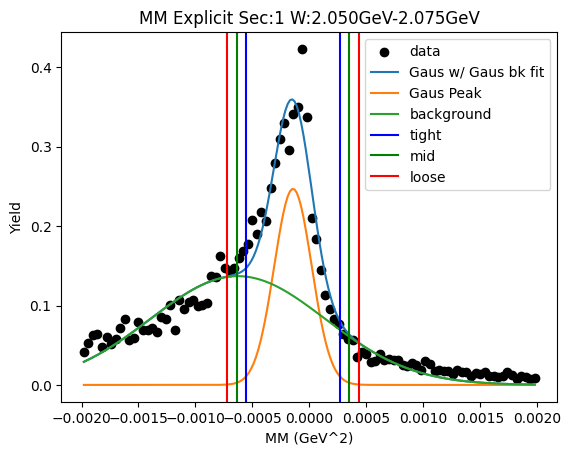

W bin: 27 2.075GeV-2.100GeV
initial Gaus fit:  [ 3.27381114e-01 -1.67092558e-04  2.45646347e-04]
2nd level W dependent
W1_ini_pars: [ 3.27381114e-01 -1.67092558e-04  2.45646347e-04  1.37051869e-01
 -6.27900112e-04  7.68115246e-04]
Gaus1 Peak: [ 2.27515026e-01 -1.33332514e-04  1.61837139e-04]
Gaus2 Peak: [ 0.14230627 -0.00060639  0.00073194]
tight should be -0.0005379253605467717   0.0002712603333324616
[[-0.00053793  0.          0.        ]
 [ 0.00027126  0.          0.        ]]
mid should be -0.000618843929934695   0.00035217890272038485
[[-0.00053793 -0.00061884  0.        ]
 [ 0.00027126  0.00035218  0.        ]]
loose should be -0.0006997624993226183   0.0004330974721083082
[[-0.00053793 -0.00061884 -0.00069976]
 [ 0.00027126  0.00035218  0.0004331 ]]
-6.079621927665575e-08 9.635133764626012e-08
Main Gaus Peak [ 2.27515026e-01 -1.33332514e-04  1.61837139e-04]
Gaus2 [ 0.14230627 -0.00060639  0.00073194]


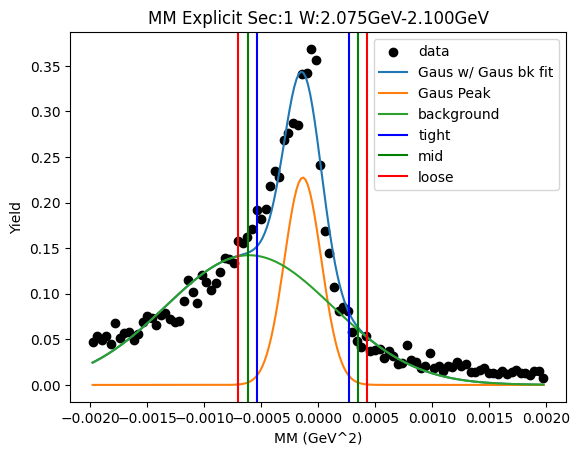

W bin: 28 2.100GeV-2.125GeV
initial Gaus fit:  [ 3.18931299e-01 -1.61117398e-04  2.44687631e-04]
2nd level W dependent
W1_ini_pars: [ 3.18931299e-01 -1.61117398e-04  2.44687631e-04  1.42306267e-01
 -6.06388031e-04  7.31935080e-04]
Gaus1 Peak: [ 2.18599834e-01 -1.24902834e-04  1.51845759e-04]
Gaus2 Peak: [ 0.14599525 -0.00058328  0.0007256 ]
tight should be -0.0005045172316850876   0.0002547115638672074
[[-0.00050452  0.          0.        ]
 [ 0.00025471  0.          0.        ]]
mid should be -0.000580440111240317   0.0003306344434224369
[[-0.00050452 -0.00058044  0.        ]
 [ 0.00025471  0.00033063  0.        ]]
loose should be -0.0006563629907955465   0.0004065573229776664
[[-0.00050452 -0.00058044 -0.00065636]
 [ 0.00025471  0.00033063  0.00040656]]
-5.357068576101035e-08 8.477212159797889e-08
Main Gaus Peak [ 2.18599834e-01 -1.24902834e-04  1.51845759e-04]
Gaus2 [ 0.14599525 -0.00058328  0.0007256 ]


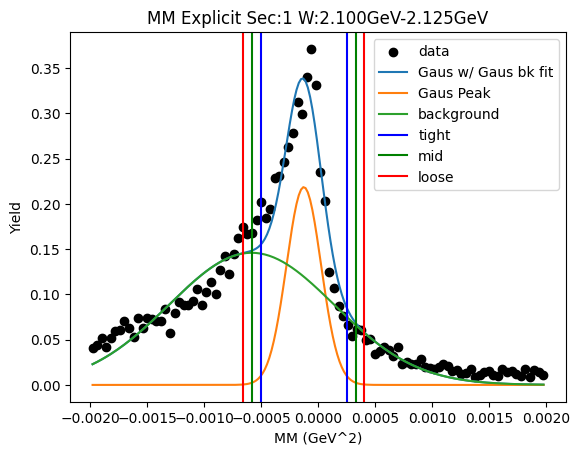

initial bw fit:  [ 1.89173110e+00 -3.50356652e-04  5.45088409e-04]
input parameters for r2 [ 1.89173110e+00 -3.50356652e-04  5.45088409e-04  5.00000000e+00
 -8.08201518e-04  5.76255640e-04]
r2 parameters [ 1.08713492e+00 -6.52119065e-04  7.86721829e-04  1.66835034e+00
 -1.48631262e-04  1.75953651e-04]
-1.4315344317821543e-06 2.282052982686724e-06
Main Gaus Peak [ 1.66835034e+00 -1.48631262e-04  1.75953651e-04]
Gaus2 [ 1.08713492e+00 -6.52119065e-04  7.86721829e-04]


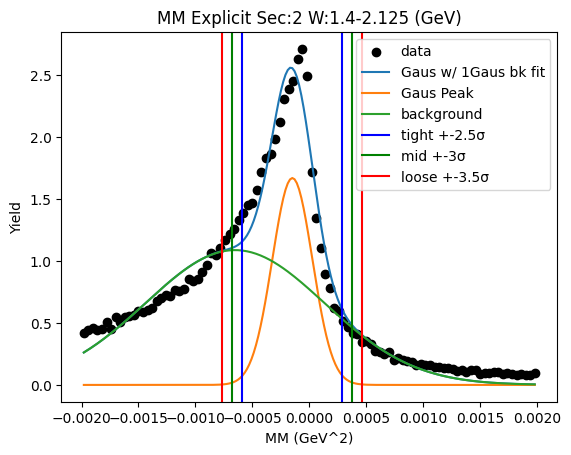

W bin: 0 1.400GeV-1.425GeV
initial Gaus fit:  [ 0.00157484 -0.00013     0.0002504 ]
2nd level W dependent
W1_ini_pars: [ 0.00157484 -0.00013     0.0002504   0.00947786 -0.00060779  0.00061885]
Gaus1 Peak: [ 1.09066110e-03 -9.40918880e-05  1.51955499e-04]
Gaus2 Peak: [ 0.00081673 -0.00073227  0.00078891]
tight should be -0.00047398063534325277   0.00028579685938140507
[[-0.00047398  0.          0.        ]
 [ 0.0002858   0.          0.        ]]
mid should be -0.0005499583848157186   0.0003617746088538709
[[-0.00047398 -0.00054996  0.        ]
 [ 0.0002858   0.00036177  0.        ]]
loose should be -0.0006259361342881843   0.0004377523583263366
[[-0.00047398 -0.00054996 -0.00062594]
 [ 0.0002858   0.00036177  0.00043775]]
-1.3309080558934897e-06 2.403348811856325e-06
Main Gaus Peak [ 1.09066110e-03 -9.40918880e-05  1.51955499e-04]
Gaus2 [ 0.00081673 -0.00073227  0.00078891]


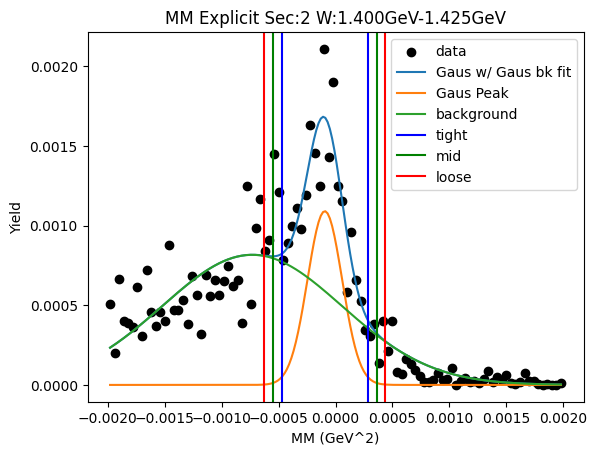

W bin: 1 1.425GeV-1.450GeV
initial Gaus fit:  [ 0.00344507 -0.00016645  0.00022545]
2nd level W dependent
W1_ini_pars: [ 0.00344507 -0.00016645  0.00022545  0.00081673 -0.00073227  0.00078891]
Gaus1 Peak: [ 0.00259912 -0.00016691  0.00021387]
Gaus2 Peak: [ 0.00108707 -0.0008187   0.00076951]
tight should be -0.0007015790895766233   0.00036776580123859266
[[-0.00070158  0.          0.        ]
 [ 0.00036777  0.          0.        ]]
mid should be -0.0008085135786581449   0.0004747002903201143
[[-0.00070158 -0.00080851  0.        ]
 [ 0.00036777  0.0004747   0.        ]]
loose should be -0.0009154480677396664   0.0005816347794016358
[[-0.00070158 -0.00080851 -0.00091545]
 [ 0.00036777  0.0004747   0.00058163]]
-1.0936199159375046e-07 1.6507764732927504e-07
Main Gaus Peak [ 0.00259912 -0.00016691  0.00021387]
Gaus2 [ 0.00108707 -0.0008187   0.00076951]


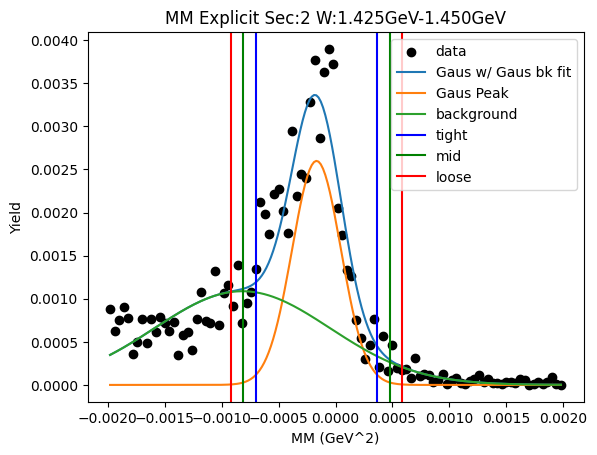

W bin: 2 1.450GeV-1.475GeV
initial Gaus fit:  [ 0.00562276 -0.00018454  0.00024143]
2nd level W dependent
W1_ini_pars: [ 0.00562276 -0.00018454  0.00024143  0.00108707 -0.0008187   0.00076951]
Gaus1 Peak: [ 0.00382629 -0.00015082  0.00017975]
Gaus2 Peak: [ 0.00258409 -0.00069708  0.00066825]
tight should be -0.0006001829675409816   0.00029854372297251006
[[-0.00060018  0.          0.        ]
 [ 0.00029854  0.          0.        ]]
mid should be -0.0006900556365923307   0.0003884163920238593
[[-0.00060018 -0.00069006  0.        ]
 [ 0.00029854  0.00038842  0.        ]]
loose should be -0.0007799283056436798   0.0004782890610752084
[[-0.00060018 -0.00069006 -0.00077993]
 [ 0.00029854  0.00038842  0.00047829]]
-7.417860124300048e-08 1.1967171817491955e-07
Main Gaus Peak [ 0.00382629 -0.00015082  0.00017975]
Gaus2 [ 0.00258409 -0.00069708  0.00066825]


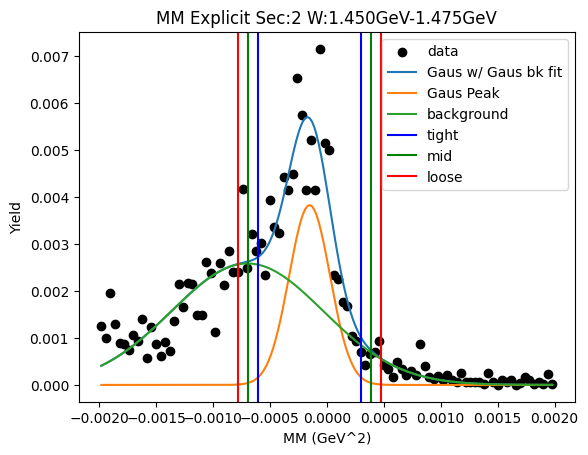

W bin: 3 1.475GeV-1.500GeV
initial Gaus fit:  [ 0.00801791 -0.00016921  0.00025612]
2nd level W dependent
W1_ini_pars: [ 0.00801791 -0.00016921  0.00025612  0.00258409 -0.00069708  0.00066825]
Gaus1 Peak: [ 0.00570436 -0.00013892  0.00018362]
Gaus2 Peak: [ 0.00333438 -0.0006547   0.00071813]
tight should be -0.0005979763039845717   0.0003201455383094961
[[-0.00059798  0.          0.        ]
 [ 0.00032015  0.          0.        ]]
mid should be -0.0006897884882139786   0.0004119577225389029
[[-0.00059798 -0.00068979  0.        ]
 [ 0.00032015  0.00041196  0.        ]]
loose should be -0.0007816006724433854   0.0005037699067683096
[[-0.00059798 -0.00068979 -0.0007816 ]
 [ 0.00032015  0.00041196  0.00050377]]
-8.18562424867947e-08 1.204512096645941e-07
Main Gaus Peak [ 0.00570436 -0.00013892  0.00018362]
Gaus2 [ 0.00333438 -0.0006547   0.00071813]


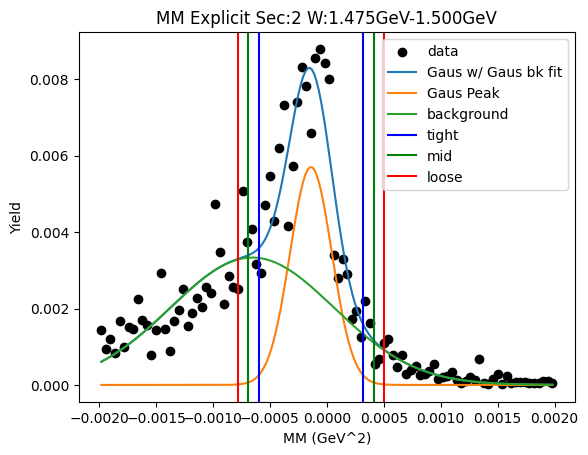

W bin: 4 1.500GeV-1.525GeV
initial Gaus fit:  [ 0.01191755 -0.00016284  0.00024879]
2nd level W dependent
W1_ini_pars: [ 0.01191755 -0.00016284  0.00024879  0.00333438 -0.0006547   0.00071813]
Gaus1 Peak: [ 0.00945392 -0.00013948  0.00018948]
Gaus2 Peak: [ 0.00390405 -0.00081345  0.00086464]
tight should be -0.0006131731082672388   0.00033420612564560783
[[-0.00061317  0.          0.        ]
 [ 0.00033421  0.          0.        ]]
mid should be -0.0007079110316585234   0.0004289440490368924
[[-0.00061317 -0.00070791  0.        ]
 [ 0.00033421  0.00042894  0.        ]]
loose should be -0.0008026489550498081   0.0005236819724281771
[[-0.00061317 -0.00070791 -0.00080265]
 [ 0.00033421  0.00042894  0.00052368]]
-8.82476451936607e-08 1.2715893389016937e-07
Main Gaus Peak [ 0.00945392 -0.00013948  0.00018948]
Gaus2 [ 0.00390405 -0.00081345  0.00086464]


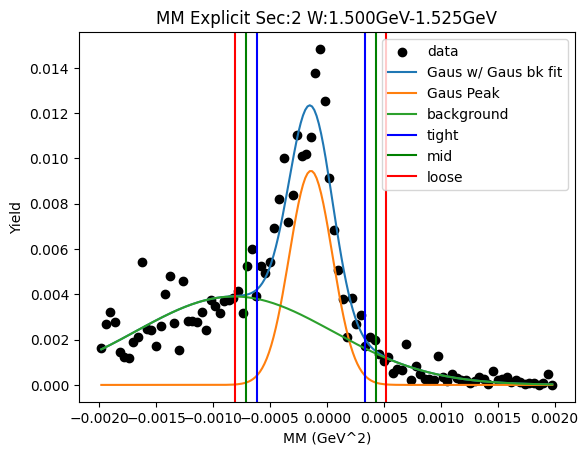

W bin: 5 1.525GeV-1.550GeV
initial Gaus fit:  [ 0.01376885 -0.00016494  0.00024004]
2nd level W dependent
W1_ini_pars: [ 0.01376885 -0.00016494  0.00024004  0.00390405 -0.00081345  0.00086464]
Gaus1 Peak: [ 0.00988222 -0.00013287  0.00015754]
Gaus2 Peak: [ 0.00579451 -0.0006061   0.00071888]
tight should be -0.000526721934152   0.0002609727986905774
[[-0.00052672  0.          0.        ]
 [ 0.00026097  0.          0.        ]]
mid should be -0.0006054914074362578   0.00033974227197483515
[[-0.00052672 -0.00060549  0.        ]
 [ 0.00026097  0.00033974  0.        ]]
loose should be -0.0006842608807205155   0.0004185117452590929
[[-0.00052672 -0.00060549 -0.00068426]
 [ 0.00026097  0.00033974  0.00041851]]
-5.6799908308129334e-08 9.211120980737611e-08
Main Gaus Peak [ 0.00988222 -0.00013287  0.00015754]
Gaus2 [ 0.00579451 -0.0006061   0.00071888]


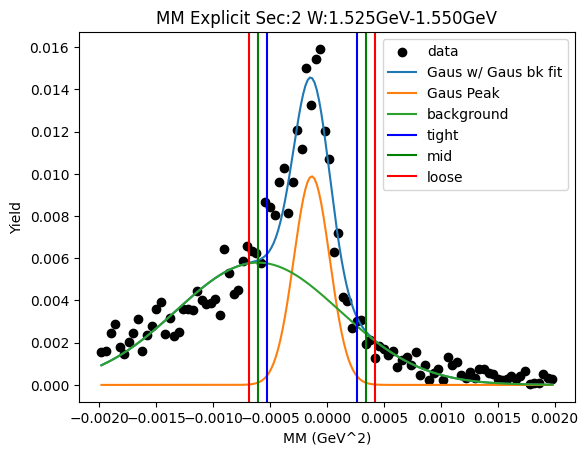

W bin: 6 1.550GeV-1.575GeV
initial Gaus fit:  [ 0.01482803 -0.00017361  0.00027084]
2nd level W dependent
W1_ini_pars: [ 0.01482803 -0.00017361  0.00027084  0.00579451 -0.0006061   0.00071888]
Gaus1 Peak: [ 0.00979892 -0.0001516   0.00017541]
Gaus2 Peak: [ 0.00697713 -0.00061916  0.0007723 ]
tight should be -0.0005901182840928232   0.0002869155831325985
[[-0.00059012  0.          0.        ]
 [ 0.00028692  0.          0.        ]]
mid should be -0.0006778216708153654   0.00037461896985514065
[[-0.00059012 -0.00067782  0.        ]
 [ 0.00028692  0.00037462  0.        ]]
loose should be -0.0007655250575379076   0.00046232235657768284
[[-0.00059012 -0.00067782 -0.00076553]
 [ 0.00028692  0.00037462  0.00046232]]
-6.931963904385157e-08 1.152855779786393e-07
Main Gaus Peak [ 0.00979892 -0.0001516   0.00017541]
Gaus2 [ 0.00697713 -0.00061916  0.0007723 ]


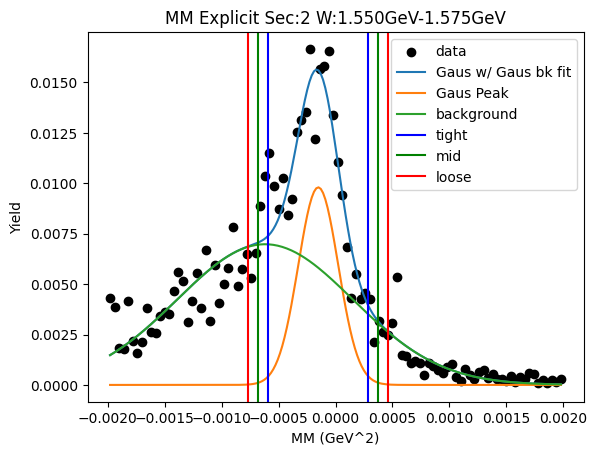

W bin: 7 1.575GeV-1.600GeV
initial Gaus fit:  [ 0.01680964 -0.00015588  0.00025683]
2nd level W dependent
W1_ini_pars: [ 0.01680964 -0.00015588  0.00025683  0.00697713 -0.00061916  0.0007723 ]
Gaus1 Peak: [ 0.01172427 -0.00013077  0.00016576]
Gaus2 Peak: [ 0.00726011 -0.00061818  0.000812  ]
tight should be -0.0005451639486686166   0.00028362867148675863
[[-0.00054516  0.          0.        ]
 [ 0.00028363  0.          0.        ]]
mid should be -0.0006280432106841542   0.00036650793350229615
[[-0.00054516 -0.00062804  0.        ]
 [ 0.00028363  0.00036651  0.        ]]
loose should be -0.0007109224726996917   0.0004493871955178337
[[-0.00054516 -0.00062804 -0.00071092]
 [ 0.00028363  0.00036651  0.00044939]]
-6.532748956423363e-08 9.952784016952928e-08
Main Gaus Peak [ 0.01172427 -0.00013077  0.00016576]
Gaus2 [ 0.00726011 -0.00061818  0.000812  ]


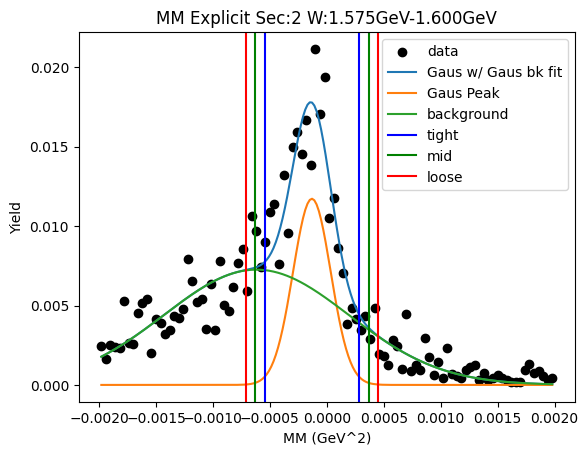

W bin: 8 1.600GeV-1.625GeV
initial Gaus fit:  [ 0.01965213 -0.00015532  0.00026803]
2nd level W dependent
W1_ini_pars: [ 0.01965213 -0.00015532  0.00026803  0.00726011 -0.00061818  0.000812  ]
Gaus1 Peak: [ 0.01374383 -0.00012481  0.00017551]
Gaus2 Peak: [ 0.00874144 -0.00069117  0.00082676]
tight should be -0.0005635866382823912   0.00031396963388056033
[[-0.00056359  0.          0.        ]
 [ 0.00031397  0.          0.        ]]
mid should be -0.0006513422654986864   0.00040172526109685553
[[-0.00056359 -0.00065134  0.        ]
 [ 0.00031397  0.00040173  0.        ]]
loose should be -0.0007390978927149814   0.0004894808883131506
[[-0.00056359 -0.00065134 -0.0007391 ]
 [ 0.00031397  0.00040173  0.00048948]]
-7.683543907586844e-08 1.0798976351914026e-07
Main Gaus Peak [ 0.01374383 -0.00012481  0.00017551]
Gaus2 [ 0.00874144 -0.00069117  0.00082676]


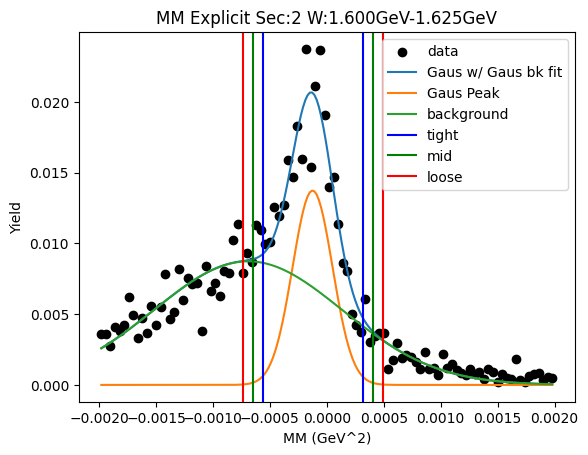

W bin: 9 1.625GeV-1.650GeV
initial Gaus fit:  [ 0.02598076 -0.00019405  0.00027574]
2nd level W dependent
W1_ini_pars: [ 0.02598076 -0.00019405  0.00027574  0.00874144 -0.00069117  0.00082676]
Gaus1 Peak: [ 0.01865051 -0.00016127  0.00020672]
Gaus2 Peak: [ 0.01037419 -0.00080287  0.00084307]
tight should be -0.0006780648927936739   0.0003555330926360425
[[-0.00067806  0.          0.        ]
 [ 0.00035553  0.          0.        ]]
mid should be -0.0007814246913366456   0.0004588928911790142
[[-0.00067806 -0.00078142  0.        ]
 [ 0.00035553  0.00045889  0.        ]]
loose should be -0.0008847844898796171   0.0005622526897219858
[[-0.00067806 -0.00078142 -0.00088478]
 [ 0.00035553  0.00045889  0.00056225]]
-1.0219228492989362e-07 1.5420566598635475e-07
Main Gaus Peak [ 0.01865051 -0.00016127  0.00020672]
Gaus2 [ 0.01037419 -0.00080287  0.00084307]


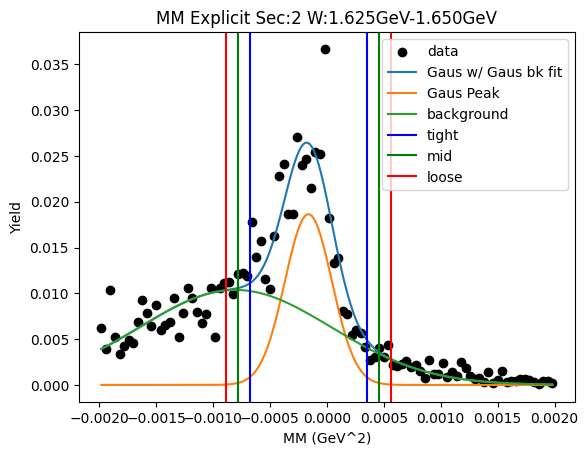

W bin: 10 1.650GeV-1.675GeV
initial Gaus fit:  [ 0.0324644  -0.00017549  0.00026884]
2nd level W dependent
W1_ini_pars: [ 0.0324644  -0.00017549  0.00026884  0.01037419 -0.00080287  0.00084307]
Gaus1 Peak: [ 0.02303101 -0.00014848  0.00019099]
Gaus2 Peak: [ 0.0136327  -0.00071713  0.00079495]
tight should be -0.0006259484041345293   0.0003289822858345424
[[-0.00062595  0.          0.        ]
 [ 0.00032898  0.          0.        ]]
mid should be -0.0007214414731314366   0.00042447535483144955
[[-0.00062595 -0.00072144  0.        ]
 [ 0.00032898  0.00042448  0.        ]]
loose should be -0.0008169345421283438   0.0005199684238283567
[[-0.00062595 -0.00072144 -0.00081693]
 [ 0.00032898  0.00042448  0.00051997]]
-8.737989586283642e-08 1.3147433357191733e-07
Main Gaus Peak [ 0.02303101 -0.00014848  0.00019099]
Gaus2 [ 0.0136327  -0.00071713  0.00079495]


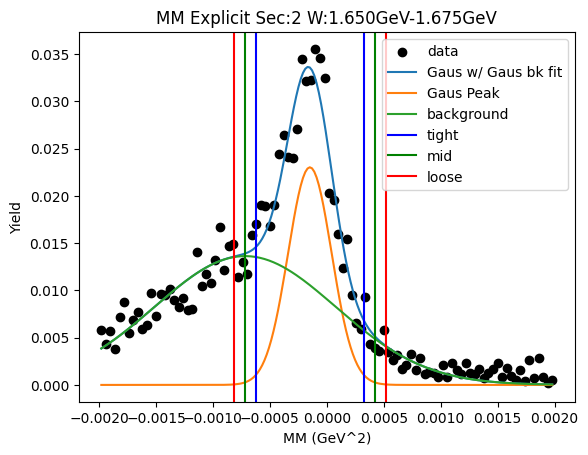

W bin: 11 1.675GeV-1.700GeV
initial Gaus fit:  [ 0.04602616 -0.00016732  0.00024906]
2nd level W dependent
W1_ini_pars: [ 0.04602616 -0.00016732  0.00024906  0.0136327  -0.00071713  0.00079495]
Gaus1 Peak: [ 0.03230501 -0.00012331  0.00014067]
Gaus2 Peak: [ 0.02270454 -0.00060932  0.00069613]
tight should be -0.00047499412041214376   0.00022836746904165406
[[-0.00047499  0.          0.        ]
 [ 0.00022837  0.          0.        ]]
mid should be -0.0005453302793575236   0.0002987036279870338
[[-0.00047499 -0.00054533  0.        ]
 [ 0.00022837  0.0002987   0.        ]]
loose should be -0.0006156664383029033   0.0003690397869324136
[[-0.00047499 -0.00054533 -0.00061567]
 [ 0.00022837  0.0002987   0.00036904]]
-4.415992677072146e-08 7.457227935383201e-08
Main Gaus Peak [ 0.03230501 -0.00012331  0.00014067]
Gaus2 [ 0.02270454 -0.00060932  0.00069613]


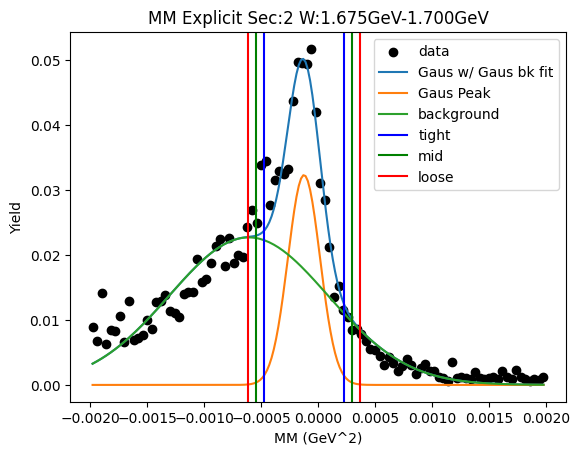

W bin: 12 1.700GeV-1.725GeV
initial Gaus fit:  [ 0.05773524 -0.00017441  0.00026343]
2nd level W dependent
W1_ini_pars: [ 0.05773524 -0.00017441  0.00026343  0.02270454 -0.00060932  0.00069613]
Gaus1 Peak: [ 0.04163277 -0.00015616  0.00019813]
Gaus2 Peak: [ 0.0227777  -0.00076128  0.00084373]
tight should be -0.0006514888096104948   0.0003391630866015515
[[-0.00065149  0.          0.        ]
 [ 0.00033916  0.          0.        ]]
mid should be -0.0007505539992316995   0.0004382282762227562
[[-0.00065149 -0.00075055  0.        ]
 [ 0.00033916  0.00043823  0.        ]]
loose should be -0.0008496191888529042   0.0005372934658439608
[[-0.00065149 -0.00075055 -0.00084962]
 [ 0.00033916  0.00043823  0.00053729]]
-9.338010222295798e-08 1.4215378084948758e-07
Main Gaus Peak [ 0.04163277 -0.00015616  0.00019813]
Gaus2 [ 0.0227777  -0.00076128  0.00084373]


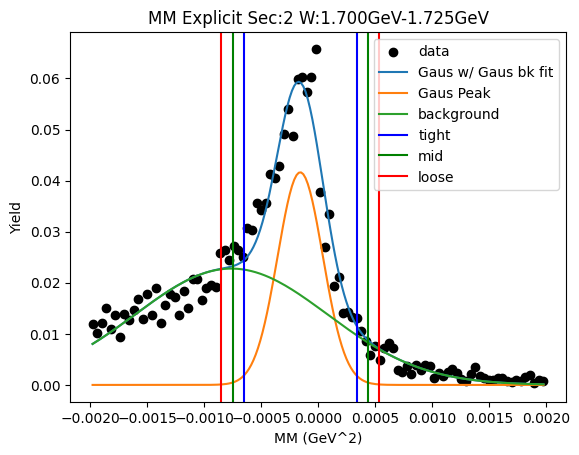

W bin: 13 1.725GeV-1.750GeV
initial Gaus fit:  [ 0.06766342 -0.00016954  0.0002442 ]
2nd level W dependent
W1_ini_pars: [ 0.06766342 -0.00016954  0.0002442   0.0227777  -0.00076128  0.00084373]
Gaus1 Peak: [ 0.04792209 -0.00014838  0.00017044]
Gaus2 Peak: [ 0.0275172  -0.00066043  0.00079712]
tight should be -0.0005744890769627248   0.0002777274884610781
[[-0.00057449  0.          0.        ]
 [ 0.00027773  0.          0.        ]]
mid should be -0.0006597107335051052   0.00036294914500345846
[[-0.00057449 -0.00065971  0.        ]
 [ 0.00027773  0.00036295  0.        ]]
loose should be -0.0007449323900474854   0.0004481708015458387
[[-0.00057449 -0.00065971 -0.00074493]
 [ 0.00027773  0.00036295  0.00044817]]
-6.513590882342399e-08 1.0916962902843434e-07
Main Gaus Peak [ 0.04792209 -0.00014838  0.00017044]
Gaus2 [ 0.0275172  -0.00066043  0.00079712]


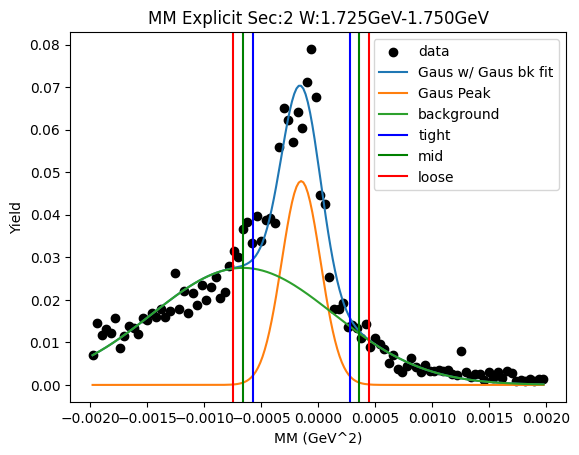

W bin: 14 1.750GeV-1.775GeV
initial Gaus fit:  [ 0.07173116 -0.00016561  0.00025268]
2nd level W dependent
W1_ini_pars: [ 0.07173116 -0.00016561  0.00025268  0.0275172  -0.00066043  0.00079712]
Gaus1 Peak: [ 0.05072093 -0.0001366   0.00015367]
Gaus2 Peak: [ 0.03174662 -0.00060306  0.00077154]
tight should be -0.0005207599831388696   0.0002475695809371691
[[-0.00052076  0.          0.        ]
 [ 0.00024757  0.          0.        ]]
mid should be -0.0005975929395464735   0.00032440253734477295
[[-0.00052076 -0.00059759  0.        ]
 [ 0.00024757  0.0003244   0.        ]]
loose should be -0.0006744258959540773   0.00040123549375237677
[[-0.00052076 -0.00059759 -0.00067443]
 [ 0.00024757  0.0003244   0.00040124]]
-5.218138932021135e-08 8.94978872477748e-08
Main Gaus Peak [ 0.05072093 -0.0001366   0.00015367]
Gaus2 [ 0.03174662 -0.00060306  0.00077154]


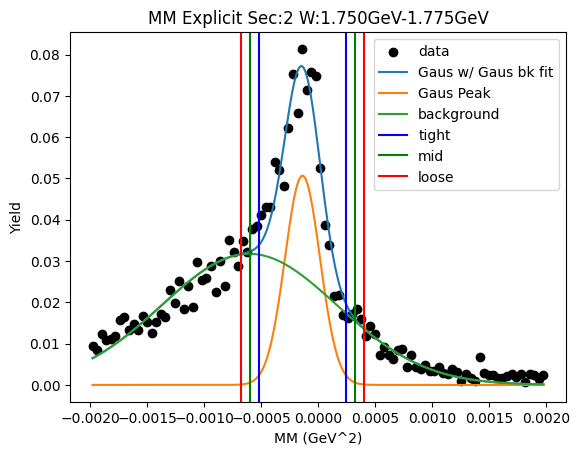

W bin: 15 1.775GeV-1.800GeV
initial Gaus fit:  [ 0.07477884 -0.00016761  0.00026637]
2nd level W dependent
W1_ini_pars: [ 0.07477884 -0.00016761  0.00026637  0.03174662 -0.00060306  0.00077154]
Gaus1 Peak: [ 0.04981168 -0.0001301   0.00017191]
Gaus2 Peak: [ 0.03546306 -0.00063366  0.00075018]
tight should be -0.0005598626131353111   0.00029966312806374074
[[-0.00055986  0.          0.        ]
 [ 0.00029966  0.          0.        ]]
mid should be -0.0006458151872552163   0.00038561570218364593
[[-0.00055986 -0.00064582  0.        ]
 [ 0.00029966  0.00038562  0.        ]]
loose should be -0.0007317677613751215   0.0004715682763035511
[[-0.00055986 -0.00064582 -0.00073177]
 [ 0.00029966  0.00038562  0.00047157]]
-7.172819696617594e-08 1.0558008298193114e-07
Main Gaus Peak [ 0.04981168 -0.0001301   0.00017191]
Gaus2 [ 0.03546306 -0.00063366  0.00075018]


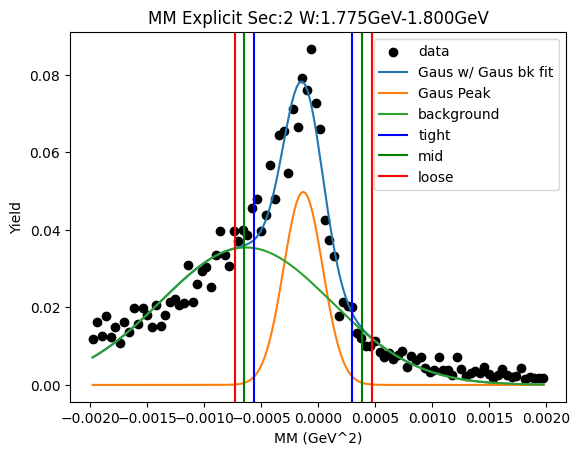

W bin: 16 1.800GeV-1.825GeV
initial Gaus fit:  [ 0.08614089 -0.00017091  0.00027387]
2nd level W dependent
W1_ini_pars: [ 0.08614089 -0.00017091  0.00027387  0.03546306 -0.00063366  0.00075018]
Gaus1 Peak: [ 0.05870925 -0.00014735  0.00018528]
Gaus2 Peak: [ 0.03750228 -0.00062562  0.00079661]
tight should be -0.0006105636033880902   0.0003158574591127386
[[-0.00061056  0.          0.        ]
 [ 0.00031586  0.          0.        ]]
mid should be -0.0007032057096381731   0.00040849956536282144
[[-0.00061056 -0.00070321  0.        ]
 [ 0.00031586  0.0004085   0.        ]]
loose should be -0.000795847815888256   0.0005011416716129043
[[-0.00061056 -0.00070321 -0.00079585]
 [ 0.00031586  0.0004085   0.00050114]]
-8.127779033700866e-08 1.2470364607383085e-07
Main Gaus Peak [ 0.05870925 -0.00014735  0.00018528]
Gaus2 [ 0.03750228 -0.00062562  0.00079661]


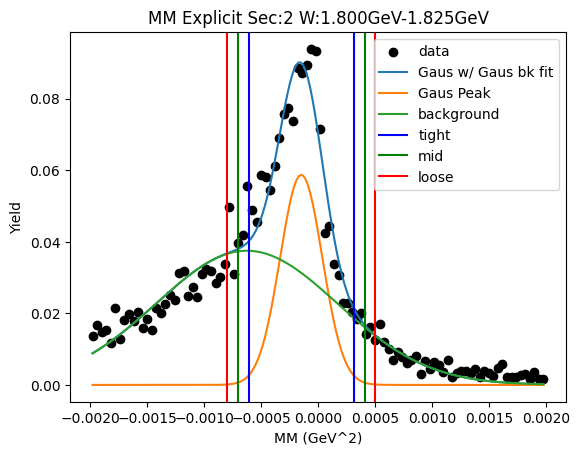

W bin: 17 1.825GeV-1.850GeV
initial Gaus fit:  [ 0.09148289 -0.00020528  0.00030889]
2nd level W dependent
W1_ini_pars: [ 0.09148289 -0.00020528  0.00030889  0.03750228 -0.00062562  0.00079661]
Gaus1 Peak: [ 0.0644719  -0.00018073  0.00022974]
Gaus2 Peak: [ 0.03584789 -0.00074055  0.0008824 ]
tight should be -0.0007550801670241998   0.0003936272213594298
[[-0.00075508  0.          0.        ]
 [ 0.00039363  0.          0.        ]]
mid should be -0.0008699509058625627   0.0005084979601977927
[[-0.00075508 -0.00086995  0.        ]
 [ 0.00039363  0.0005085   0.        ]]
loose should be -0.0009848216447009258   0.0006233686990361556
[[-0.00075508 -0.00086995 -0.00098482]
 [ 0.00039363  0.0005085   0.00062337]]
-1.2568138171282183e-07 1.9100549767769146e-07
Main Gaus Peak [ 0.0644719  -0.00018073  0.00022974]
Gaus2 [ 0.03584789 -0.00074055  0.0008824 ]


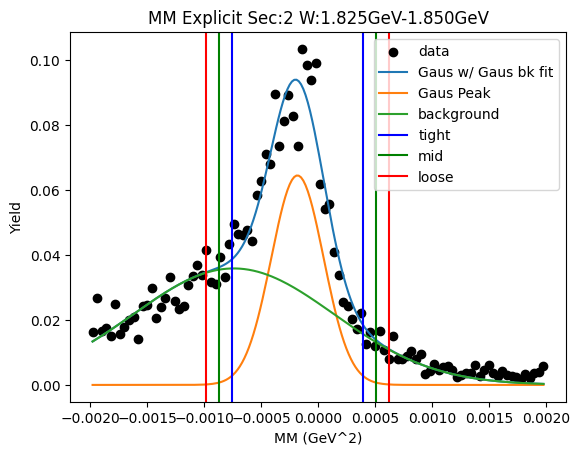

W bin: 18 1.850GeV-1.875GeV
initial Gaus fit:  [ 0.0999958  -0.00017054  0.00026799]
2nd level W dependent
W1_ini_pars: [ 0.0999958  -0.00017054  0.00026799  0.03584789 -0.00074055  0.0008824 ]
Gaus1 Peak: [ 0.06548715 -0.00014956  0.00018951]
Gaus2 Peak: [ 0.04639176 -0.0006899   0.00082331]
tight should be -0.0006233398526735859   0.00032422112710393043
[[-0.00062334  0.          0.        ]
 [ 0.00032422  0.          0.        ]]
mid should be -0.0007180959506513375   0.000418977225081682
[[-0.00062334 -0.0007181   0.        ]
 [ 0.00032422  0.00041898  0.        ]]
loose should be -0.0008128520486290891   0.0005137333230594336
[[-0.00062334 -0.0007181  -0.00081285]
 [ 0.00032422  0.00041898  0.00051373]]
-8.537661425102748e-08 1.301126202442349e-07
Main Gaus Peak [ 0.06548715 -0.00014956  0.00018951]
Gaus2 [ 0.04639176 -0.0006899   0.00082331]


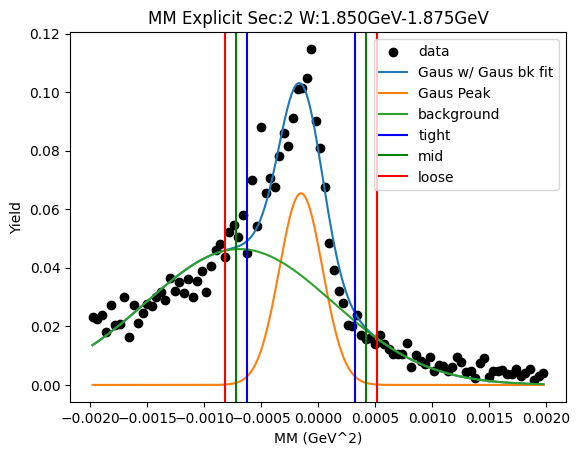

W bin: 19 1.875GeV-1.900GeV
initial Gaus fit:  [ 0.10549132 -0.00019536  0.00029143]
2nd level W dependent
W1_ini_pars: [ 0.10549132 -0.00019536  0.00029143  0.04639176 -0.0006899   0.00082331]
Gaus1 Peak: [ 0.06762418 -0.00016345  0.00018895]
Gaus2 Peak: [ 0.05096286 -0.00063881  0.00078358]
tight should be -0.0006358408522018706   0.0003089327696322589
[[-0.00063584  0.          0.        ]
 [ 0.00030893  0.          0.        ]]
mid should be -0.0007303182143852835   0.00040341013181567186
[[-0.00063584 -0.00073032  0.        ]
 [ 0.00030893  0.00040341  0.        ]]
loose should be -0.0008247955765686965   0.0004978874939990848
[[-0.00063584 -0.00073032 -0.0008248 ]
 [ 0.00030893  0.00040341  0.00049789]]
-8.039443996929444e-08 1.3382888719396447e-07
Main Gaus Peak [ 0.06762418 -0.00016345  0.00018895]
Gaus2 [ 0.05096286 -0.00063881  0.00078358]


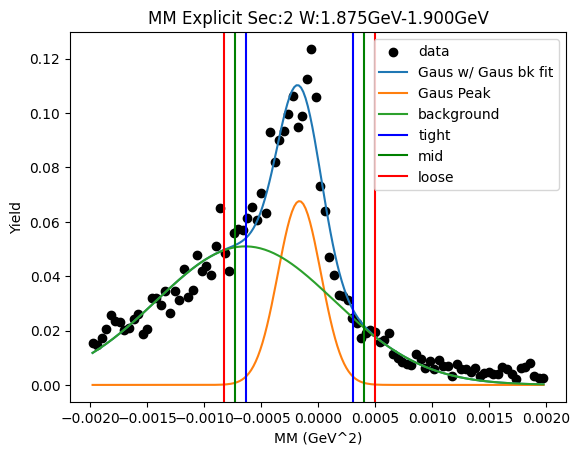

W bin: 20 1.900GeV-1.925GeV
initial Gaus fit:  [ 0.12461062 -0.00018248  0.00026144]
2nd level W dependent
W1_ini_pars: [ 0.12461062 -0.00018248  0.00026144  0.05096286 -0.00063881  0.00078358]
Gaus1 Peak: [ 0.08321144 -0.00015888  0.00017893]
Gaus2 Peak: [ 0.05584776 -0.00064727  0.00078126]
tight should be -0.0006062006415974803   0.0002884363467162719
[[-0.0006062   0.          0.        ]
 [ 0.00028844  0.          0.        ]]
mid should be -0.0006956643404288556   0.00037790004554764706
[[-0.0006062  -0.00069566  0.        ]
 [ 0.00028844  0.0003779   0.        ]]
loose should be -0.0007851280392602308   0.0004673637443790222
[[-0.0006062  -0.00069566 -0.00078513]
 [ 0.00028844  0.0003779   0.00046736]]
-7.08015041277542e-08 1.2128857767843e-07
Main Gaus Peak [ 0.08321144 -0.00015888  0.00017893]
Gaus2 [ 0.05584776 -0.00064727  0.00078126]


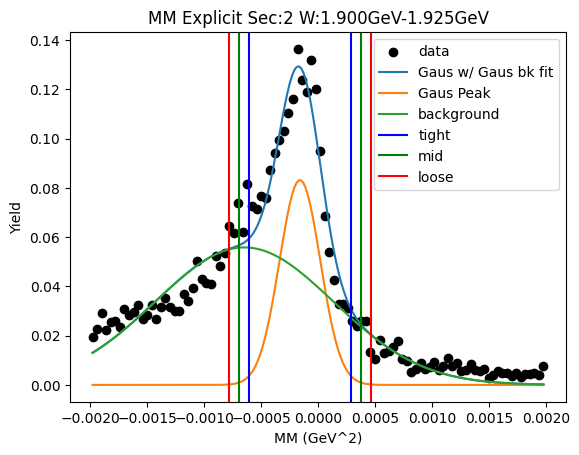

W bin: 21 1.925GeV-1.950GeV
initial Gaus fit:  [ 0.14382887 -0.00018411  0.00027093]
2nd level W dependent
W1_ini_pars: [ 0.14382887 -0.00018411  0.00027093  0.05584776 -0.00064727  0.00078126]
Gaus1 Peak: [ 0.1010308  -0.00016102  0.00019615]
Gaus2 Peak: [ 0.05803467 -0.00068127  0.00080744]
tight should be -0.0006514070361588124   0.00032936726778991536
[[-0.00065141  0.          0.        ]
 [ 0.00032937  0.          0.        ]]
mid should be -0.0007494844665536852   0.0004274446981847882
[[-0.00065141 -0.00074948  0.        ]
 [ 0.00032937  0.00042744  0.        ]]
loose should be -0.000847561896948558   0.000525522128579661
[[-0.00065141 -0.00074948 -0.00084756]
 [ 0.00032937  0.00042744  0.00052552]]
-8.950278513156017e-08 1.413575913371066e-07
Main Gaus Peak [ 0.1010308  -0.00016102  0.00019615]
Gaus2 [ 0.05803467 -0.00068127  0.00080744]


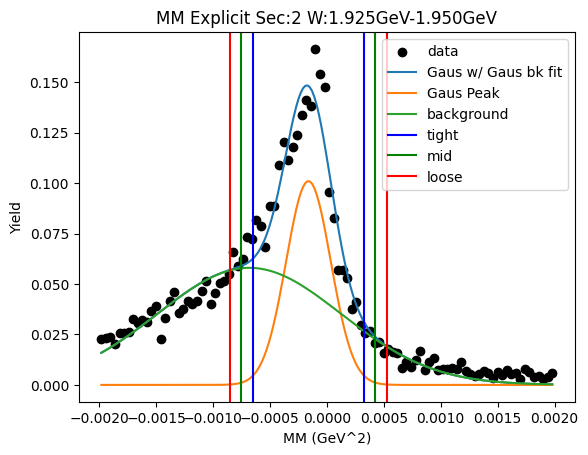

W bin: 22 1.950GeV-1.975GeV
initial Gaus fit:  [ 0.1496002  -0.00017957  0.000271  ]
2nd level W dependent
W1_ini_pars: [ 0.1496002  -0.00017957  0.000271    0.05803467 -0.00068127  0.00080744]
Gaus1 Peak: [ 0.09966917 -0.00014825  0.00017248]
Gaus2 Peak: [ 0.06940233 -0.00062004  0.00078281]
tight should be -0.000579458944670562   0.0002829545086051803
[[-0.00057946  0.          0.        ]
 [ 0.00028295  0.          0.        ]]
mid should be -0.0006657002899981362   0.0003691958539327545
[[-0.00057946 -0.0006657   0.        ]
 [ 0.00028295  0.0003692   0.        ]]
loose should be -0.0007519416353257104   0.0004554371992603288
[[-0.00057946 -0.0006657  -0.00075194]
 [ 0.00028295  0.0003692   0.00045544]]
-6.727211557530638e-08 1.112295558785314e-07
Main Gaus Peak [ 0.09966917 -0.00014825  0.00017248]
Gaus2 [ 0.06940233 -0.00062004  0.00078281]


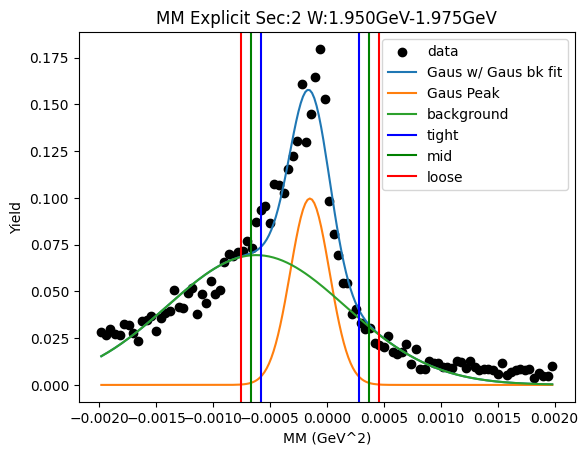

W bin: 23 1.975GeV-2.000GeV
initial Gaus fit:  [ 0.15847576 -0.00018911  0.00028389]
2nd level W dependent
W1_ini_pars: [ 0.15847576 -0.00018911  0.00028389  0.06940233 -0.00062004  0.00078281]
Gaus1 Peak: [ 0.10656015 -0.00016501  0.00019711]
Gaus2 Peak: [ 0.0690871  -0.00066423  0.00082982]
tight should be -0.0006577785976202417   0.000327755893254934
[[-0.00065778  0.          0.        ]
 [ 0.00032776  0.          0.        ]]
mid should be -0.0007563320467077594   0.00042630934234245163
[[-0.00065778 -0.00075633  0.        ]
 [ 0.00032776  0.00042631  0.        ]]
loose should be -0.000854885495795277   0.0005248627914299693
[[-0.00065778 -0.00075633 -0.00085489]
 [ 0.00032776  0.00042631  0.00052486]]
-8.93246415754032e-08 1.437821342736989e-07
Main Gaus Peak [ 0.10656015 -0.00016501  0.00019711]
Gaus2 [ 0.0690871  -0.00066423  0.00082982]


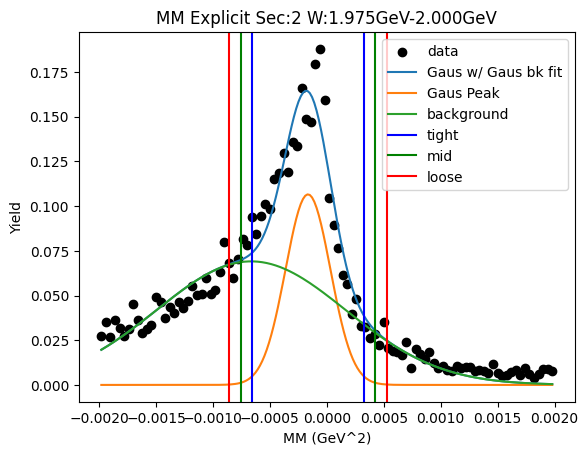

W bin: 24 2.000GeV-2.025GeV
initial Gaus fit:  [ 0.18029253 -0.00018825  0.00026485]
2nd level W dependent
W1_ini_pars: [ 0.18029253 -0.00018825  0.00026485  0.0690871  -0.00066423  0.00082982]
Gaus1 Peak: [ 0.12410334 -0.00015823  0.00018399]
Gaus2 Peak: [ 0.0776109  -0.00067905  0.00079238]
tight should be -0.0006182170954395995   0.0003017508227290483
[[-0.00061822  0.          0.        ]
 [ 0.00030175  0.          0.        ]]
mid should be -0.0007102138872564643   0.00039374761454591303
[[-0.00061822 -0.00071021  0.        ]
 [ 0.00030175  0.00039375  0.        ]]
loose should be -0.0008022106790733291   0.0004857444063627778
[[-0.00061822 -0.00071021 -0.00080221]
 [ 0.00030175  0.00039375  0.00048574]]
-7.652319101431946e-08 1.2659864189597396e-07
Main Gaus Peak [ 0.12410334 -0.00015823  0.00018399]
Gaus2 [ 0.0776109  -0.00067905  0.00079238]


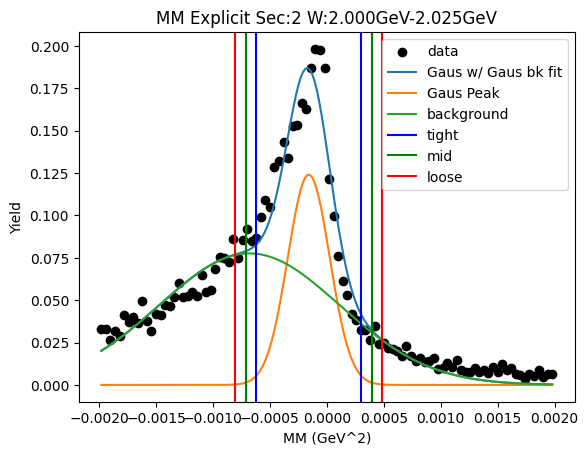

W bin: 25 2.025GeV-2.050GeV
initial Gaus fit:  [ 2.03676939e-01 -1.60069490e-04  2.30920438e-04]
2nd level W dependent
W1_ini_pars: [ 2.03676939e-01 -1.60069490e-04  2.30920438e-04  7.76109003e-02
 -6.79050697e-04  7.92380805e-04]
Gaus1 Peak: [ 1.49721485e-01 -1.18907387e-04  1.22537099e-04]
Gaus2 Peak: [ 0.09674387 -0.00060838  0.00073578]
tight should be -0.00042525013413598504   0.00018743536034695942
[[-0.00042525  0.          0.        ]
 [ 0.00018744  0.          0.        ]]
mid should be -0.00048651868358427953   0.0002487039097952539
[[-0.00042525 -0.00048652  0.        ]
 [ 0.00018744  0.0002487   0.        ]]
loose should be -0.000547787233032574   0.00030997245924354835
[[-0.00042525 -0.00048652 -0.00054779]
 [ 0.00018744  0.0002487   0.00030997]]
-3.090705515989587e-08 5.918498847605859e-08
Main Gaus Peak [ 1.49721485e-01 -1.18907387e-04  1.22537099e-04]
Gaus2 [ 0.09674387 -0.00060838  0.00073578]


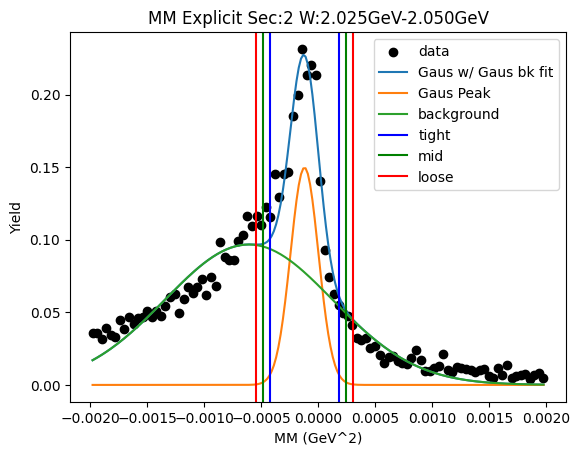

W bin: 26 2.050GeV-2.075GeV
initial Gaus fit:  [ 2.03170845e-01 -1.74290303e-04  2.51722554e-04]
2nd level W dependent
W1_ini_pars: [ 2.03170845e-01 -1.74290303e-04  2.51722554e-04  9.67438676e-02
 -6.08384676e-04  7.35777069e-04]
Gaus1 Peak: [ 0.13994098 -0.00014551  0.00016326]
Gaus2 Peak: [ 0.09000253 -0.00063693  0.00078508]
tight should be -0.0005536548399136029   0.00026262715995902154
[[-0.00055365  0.          0.        ]
 [ 0.00026263  0.          0.        ]]
mid should be -0.0006352830399008653   0.0003442553599462839
[[-0.00055365 -0.00063528  0.        ]
 [ 0.00026263  0.00034426  0.        ]]
loose should be -0.0007169112398881278   0.00042588355993354636
[[-0.00055365 -0.00063528 -0.00071691]
 [ 0.00026263  0.00034426  0.00042588]]
-5.878367877298957e-08 1.011322340228627e-07
Main Gaus Peak [ 0.13994098 -0.00014551  0.00016326]
Gaus2 [ 0.09000253 -0.00063693  0.00078508]


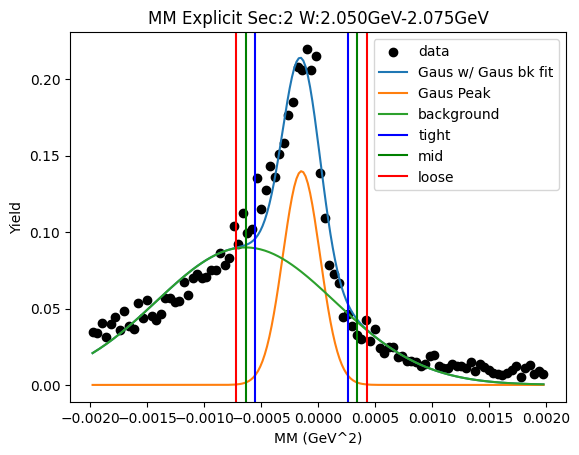

W bin: 27 2.075GeV-2.100GeV
initial Gaus fit:  [ 2.09925532e-01 -1.70858634e-04  2.57974723e-04]
2nd level W dependent
W1_ini_pars: [ 2.09925532e-01 -1.70858634e-04  2.57974723e-04  9.00025321e-02
 -6.36932099e-04  7.85083930e-04]
Gaus1 Peak: [ 1.44045764e-01 -1.41858559e-04  1.73927080e-04]
Gaus2 Peak: [ 0.09224635 -0.00066207  0.00079373]
tight should be -0.0005766762580632981   0.00029295914106012265
[[-0.00057668  0.          0.        ]
 [ 0.00029296  0.          0.        ]]
mid should be -0.0006636397979756401   0.00037992268097246476
[[-0.00057668 -0.00066364  0.        ]
 [ 0.00029296  0.00037992  0.        ]]
loose should be -0.0007506033378879822   0.0004668862208848068
[[-0.00057668 -0.00066364 -0.0007506 ]
 [ 0.00029296  0.00037992  0.00046689]]
-7.062803666887778e-08 1.1087573790917455e-07
Main Gaus Peak [ 1.44045764e-01 -1.41858559e-04  1.73927080e-04]
Gaus2 [ 0.09224635 -0.00066207  0.00079373]


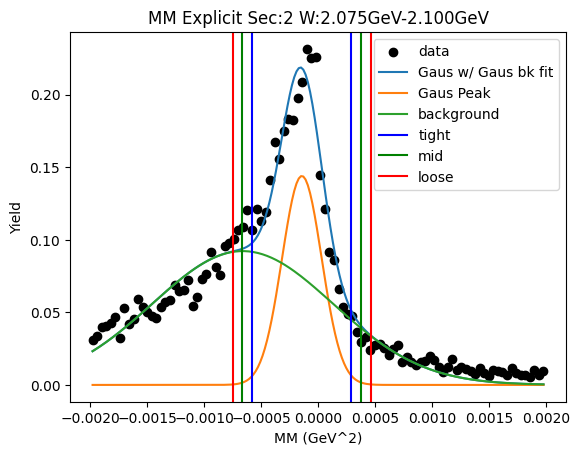

W bin: 28 2.100GeV-2.125GeV
initial Gaus fit:  [ 2.22918421e-01 -1.79338945e-04  2.52215290e-04]
2nd level W dependent
W1_ini_pars: [ 2.22918421e-01 -1.79338945e-04  2.52215290e-04  9.22463525e-02
 -6.62069346e-04  7.93729927e-04]
Gaus1 Peak: [ 0.14973873 -0.00015209  0.00016511]
Gaus2 Peak: [ 0.10138907 -0.00062746  0.00076313]
tight should be -0.0005648672608771354   0.00026068415328076353
[[-0.00056487  0.          0.        ]
 [ 0.00026068  0.          0.        ]]
mid should be -0.0006474224022929252   0.0003432392946965534
[[-0.00056487 -0.00064742  0.        ]
 [ 0.00026068  0.00034324  0.        ]]
loose should be -0.0007299775437087151   0.0004257944361123433
[[-0.00056487 -0.00064742 -0.00072998]
 [ 0.00026068  0.00034324  0.00042579]]
-5.865237575342632e-08 1.0491605722691926e-07
Main Gaus Peak [ 0.14973873 -0.00015209  0.00016511]
Gaus2 [ 0.10138907 -0.00062746  0.00076313]


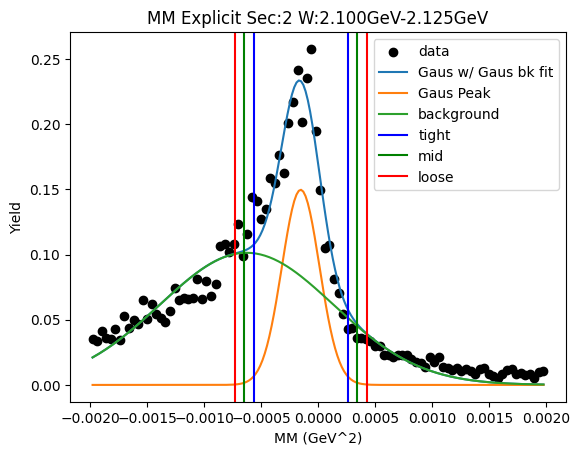

initial bw fit:  [ 1.06608612e+00 -3.18478949e-04  5.02089036e-04]
input parameters for r2 [ 1.06608612e+00 -3.18478949e-04  5.02089036e-04  5.00000000e+00
 -8.08201518e-04  5.76255640e-04]
r2 parameters [ 7.21265541e-02  1.42894291e-03  3.46243346e-04  1.07459130e+00
 -3.17398182e-04  4.93306615e-04]
1.6822244847390558e-06 2.4015312126289837e-06
Main Gaus Peak [ 1.07459130e+00 -3.17398182e-04  4.93306615e-04]
Gaus2 [0.07212655 0.00142894 0.00034624]


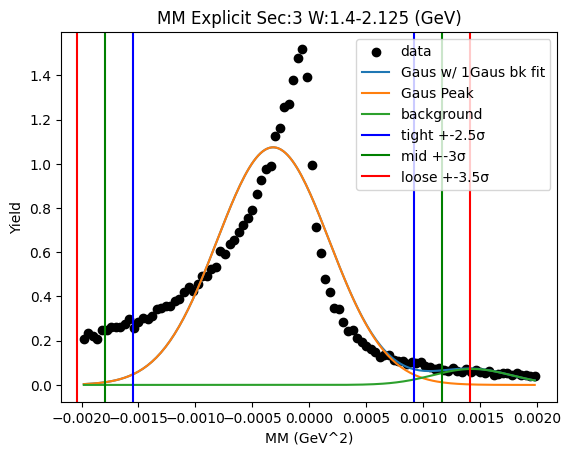

W bin: 0 1.400GeV-1.425GeV
initial Gaus fit:  [ 0.00119377 -0.00015373  0.00019845]
2nd level W dependent
W1_ini_pars: [ 0.00119377 -0.00015373  0.00019845  0.00947786 -0.00060779  0.00061885]
Gaus1 Peak: [ 0.00094802 -0.00012467  0.00014278]
Gaus2 Peak: [ 0.00044856 -0.00072346  0.00066619]
tight should be -0.00048162502475602786   0.00023228463660064706
[[-0.00048163  0.          0.        ]
 [ 0.00023228  0.          0.        ]]
mid should be -0.0005530159908916953   0.0003036756027363145
[[-0.00048163 -0.00055302  0.        ]
 [ 0.00023228  0.00030368  0.        ]]
loose should be -0.0006244069570273628   0.000375066568871982
[[-0.00048163 -0.00055302 -0.00062441]
 [ 0.00023228  0.00030368  0.00037507]]
-8.080473264856952e-07 1.8548471064968306e-06
Main Gaus Peak [ 0.00094802 -0.00012467  0.00014278]
Gaus2 [ 0.00044856 -0.00072346  0.00066619]


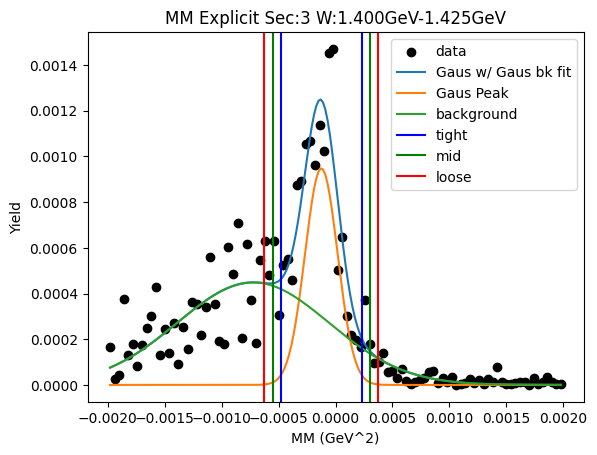

W bin: 1 1.425GeV-1.450GeV
initial Gaus fit:  [ 0.00190257 -0.00017637  0.00023049]
2nd level W dependent
W1_ini_pars: [ 0.00190257 -0.00017637  0.00023049  0.00044856 -0.00072346  0.00066619]
Gaus1 Peak: [ 0.00143174 -0.00015583  0.00019235]
Gaus2 Peak: [ 0.00068485 -0.00076547  0.00070382]
tight should be -0.0006367079238508307   0.00032504802716804086
[[-0.00063671  0.          0.        ]
 [ 0.00032505  0.          0.        ]]
mid should be -0.0007328835189527179   0.00042122362226992805
[[-0.00063671 -0.00073288  0.        ]
 [ 0.00032505  0.00042122  0.        ]]
loose should be -0.000829059114054605   0.0005173992173718152
[[-0.00063671 -0.00073288 -0.00082906]
 [ 0.00032505  0.00042122  0.0005174 ]]
-8.67139683183439e-08 1.352799139185075e-07
Main Gaus Peak [ 0.00143174 -0.00015583  0.00019235]
Gaus2 [ 0.00068485 -0.00076547  0.00070382]


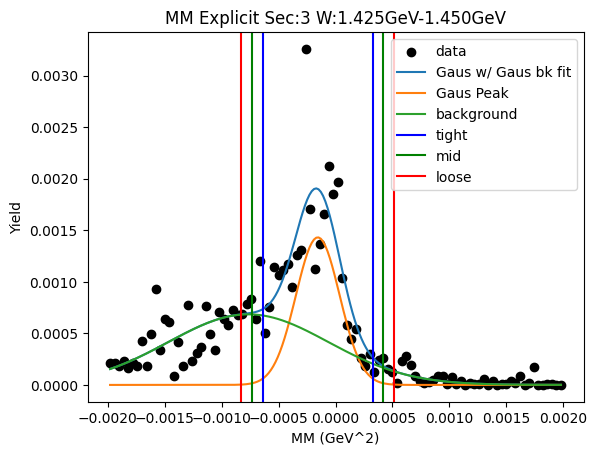

W bin: 2 1.450GeV-1.475GeV
initial Gaus fit:  [ 0.00327474 -0.00017755  0.00022939]
2nd level W dependent
W1_ini_pars: [ 0.00327474 -0.00017755  0.00022939  0.00068485 -0.00076547  0.00070382]
Gaus1 Peak: [ 2.83636703e-03 -9.43895379e-05  8.09537642e-05]
Gaus2 Peak: [ 0.00176003 -0.00055085  0.00059825]
tight should be -0.00029677394847033814   0.00010799487276004254
[[-0.00029677  0.          0.        ]
 [ 0.00010799  0.          0.        ]]
mid should be -0.00033725083059337623   0.00014847175488308064
[[-0.00029677 -0.00033725  0.        ]
 [ 0.00010799  0.00014847  0.        ]]
loose should be -0.00037772771271641427   0.00018894863700611868
[[-0.00029677 -0.00033725 -0.00037773]
 [ 0.00010799  0.00014847  0.00018895]]
-1.0751150980319447e-08 2.856992069333621e-08
Main Gaus Peak [ 2.83636703e-03 -9.43895379e-05  8.09537642e-05]
Gaus2 [ 0.00176003 -0.00055085  0.00059825]


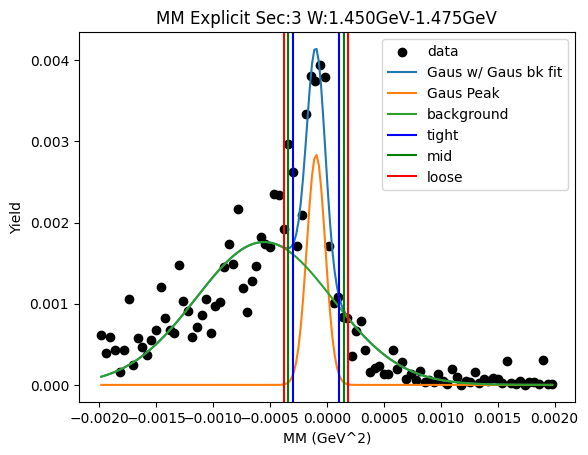

W bin: 3 1.475GeV-1.500GeV
initial Gaus fit:  [ 0.00592623 -0.00018285  0.00022416]
2nd level W dependent
W1_ini_pars: [ 0.00592623 -0.00018285  0.00022416  0.00176003 -0.00055085  0.00059825]
Gaus1 Peak: [ 0.00469264 -0.00015636  0.00018022]
Gaus2 Peak: [ 0.00182081 -0.00068466  0.00066597]
tight should be -0.0006068992661307866   0.0002941810740482172
[[-0.0006069   0.          0.        ]
 [ 0.00029418  0.          0.        ]]
mid should be -0.0006970073001486871   0.00038428910806611764
[[-0.0006069  -0.00069701  0.        ]
 [ 0.00029418  0.00038429  0.        ]]
loose should be -0.0007871153341665873   0.000474397142084018
[[-0.0006069  -0.00069701 -0.00078712]
 [ 0.00029418  0.00038429  0.0004744 ]]
-7.298532662000543e-08 1.2188166044970082e-07
Main Gaus Peak [ 0.00469264 -0.00015636  0.00018022]
Gaus2 [ 0.00182081 -0.00068466  0.00066597]


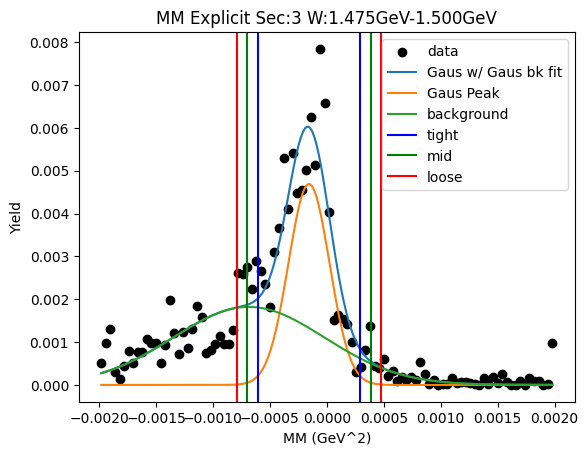

W bin: 4 1.500GeV-1.525GeV
initial Gaus fit:  [ 0.00654317 -0.00017019  0.00021988]
2nd level W dependent
W1_ini_pars: [ 0.00654317 -0.00017019  0.00021988  0.00182081 -0.00068466  0.00066597]
Gaus1 Peak: [ 0.00492381 -0.00012738  0.00013198]
Gaus2 Peak: [ 0.00285942 -0.00062947  0.0006716 ]
tight should be -0.0004573240134613386   0.00020256542302353708
[[-0.00045732  0.          0.        ]
 [ 0.00020257  0.          0.        ]]
mid should be -0.0005233129571098261   0.0002685543666720246
[[-0.00045732 -0.00052331  0.        ]
 [ 0.00020257  0.00026855  0.        ]]
loose should be -0.0005893019007583136   0.00033454331032051215
[[-0.00045732 -0.00052331 -0.0005893 ]
 [ 0.00020257  0.00026855  0.00033454]]
-3.6029003355655326e-08 6.847997305658308e-08
Main Gaus Peak [ 0.00492381 -0.00012738  0.00013198]
Gaus2 [ 0.00285942 -0.00062947  0.0006716 ]


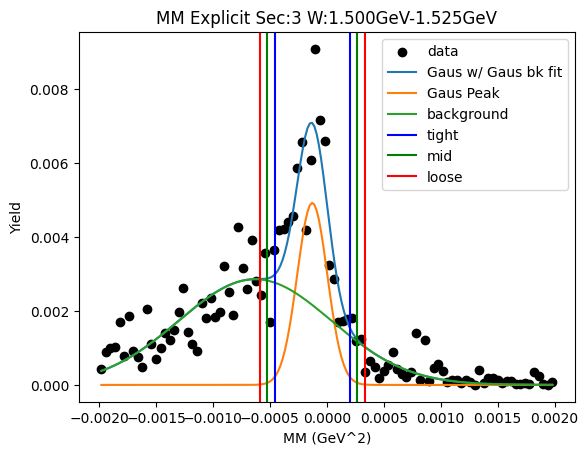

W bin: 5 1.525GeV-1.550GeV
initial Gaus fit:  [ 0.00809724 -0.00014744  0.00025914]
2nd level W dependent
W1_ini_pars: [ 0.00809724 -0.00014744  0.00025914  0.00285942 -0.00062947  0.0006716 ]
Gaus1 Peak: [ 6.69710179e-03 -6.88299232e-05  8.60675645e-05]
Gaus2 Peak: [ 0.00437295 -0.0004861   0.00064571]
tight should be -0.0002839988343707313   0.00014633898799272554
[[-0.000284    0.          0.        ]
 [ 0.00014634  0.          0.        ]]
mid should be -0.000327032616607077   0.0001893727702290712
[[-0.000284   -0.00032703  0.        ]
 [ 0.00014634  0.00018937  0.        ]]
loose should be -0.0003700663988434227   0.0002324065524654169
[[-0.000284   -0.00032703 -0.00037007]
 [ 0.00014634  0.00018937  0.00023241]]
-1.7485318636578618e-08 2.6960435288986695e-08
Main Gaus Peak [ 6.69710179e-03 -6.88299232e-05  8.60675645e-05]
Gaus2 [ 0.00437295 -0.0004861   0.00064571]


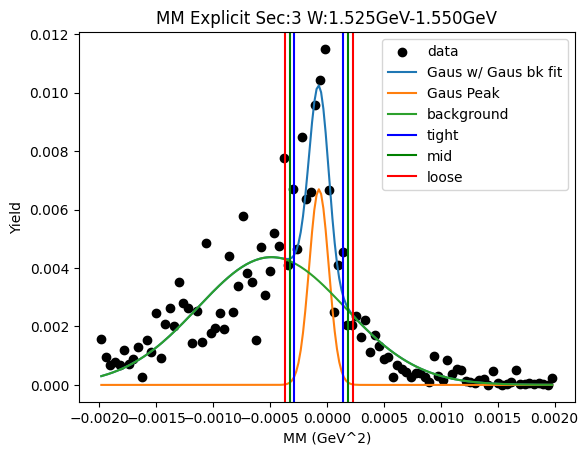

W bin: 6 1.550GeV-1.575GeV
initial Gaus fit:  [ 0.00845144 -0.00015614  0.00026632]
2nd level W dependent
W1_ini_pars: [ 0.00845144 -0.00015614  0.00026632  0.00437295 -0.0004861   0.00064571]
Gaus1 Peak: [ 6.34947515e-03 -5.67605447e-05  8.15417475e-05]
Gaus2 Peak: [ 0.00556556 -0.00051996  0.00061986]
tight should be -0.0002606149134136045   0.00014709382396640064
[[-0.00026061  0.          0.        ]
 [ 0.00014709  0.          0.        ]]
mid should be -0.000301385787151605   0.00018786469770440113
[[-0.00026061 -0.00030139  0.        ]
 [ 0.00014709  0.00018786  0.        ]]
loose should be -0.00034215666088960556   0.00022863557144240168
[[-0.00026061 -0.00030139 -0.00034216]
 [ 0.00014709  0.00018786  0.00022864]]
-1.672541030699974e-08 2.3168929181639775e-08
Main Gaus Peak [ 6.34947515e-03 -5.67605447e-05  8.15417475e-05]
Gaus2 [ 0.00556556 -0.00051996  0.00061986]


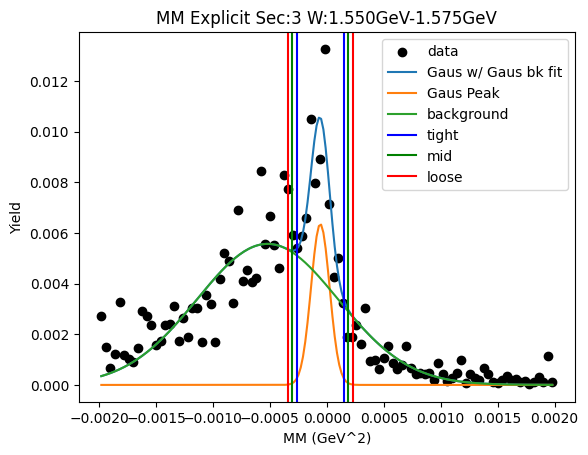

W bin: 7 1.575GeV-1.600GeV
initial Gaus fit:  [ 0.01012951 -0.00012509  0.00022493]
2nd level W dependent
W1_ini_pars: [ 0.01012951 -0.00012509  0.00022493  0.00556556 -0.00051996  0.00061986]
Gaus1 Peak: [ 7.93428523e-03 -9.56460323e-05  1.41117577e-04]
Gaus2 Peak: [ 0.0040203 -0.0006493  0.0007553]
tight should be -0.00044843997486453954   0.00025714791028997995
[[-0.00044844  0.          0.        ]
 [ 0.00025715  0.          0.        ]]
mid should be -0.0005189987633799915   0.00032770669880543185
[[-0.00044844 -0.000519    0.        ]
 [ 0.00025715  0.00032771  0.        ]]
loose should be -0.0005895575518954435   0.00039826548732088386
[[-0.00044844 -0.000519   -0.00058956]
 [ 0.00025715  0.00032771  0.00039827]]
-5.059434814891991e-08 6.889067513351864e-08
Main Gaus Peak [ 7.93428523e-03 -9.56460323e-05  1.41117577e-04]
Gaus2 [ 0.0040203 -0.0006493  0.0007553]


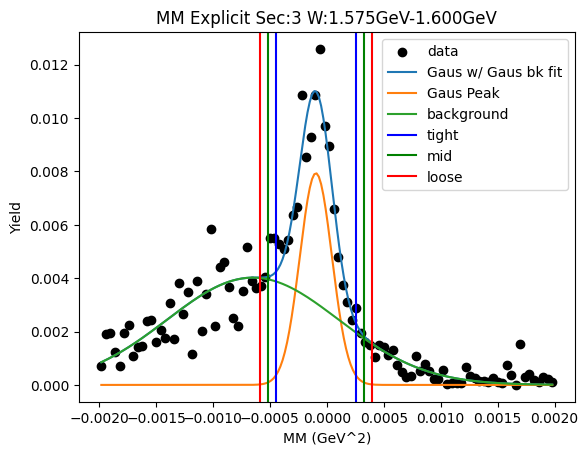

W bin: 8 1.600GeV-1.625GeV
initial Gaus fit:  [ 0.01204245 -0.00018303  0.00025538]
2nd level W dependent
W1_ini_pars: [ 0.01204245 -0.00018303  0.00025538  0.0040203  -0.0006493   0.0007553 ]
Gaus1 Peak: [ 0.00918859 -0.00018125  0.00020652]
Gaus2 Peak: [ 0.00379142 -0.00072435  0.00086819]
tight should be -0.0006975474115160503   0.0003350419490237873
[[-0.00069755  0.          0.        ]
 [ 0.00033504  0.          0.        ]]
mid should be -0.000800806347570034   0.00043830088507777103
[[-0.00069755 -0.00080081  0.        ]
 [ 0.00033504  0.0004383   0.        ]]
loose should be -0.0009040652836240177   0.0005415598211317548
[[-0.00069755 -0.00080081 -0.00090407]
 [ 0.00033504  0.0004383   0.00054156]]
-9.509634191582609e-08 1.6080144708419083e-07
Main Gaus Peak [ 0.00918859 -0.00018125  0.00020652]
Gaus2 [ 0.00379142 -0.00072435  0.00086819]


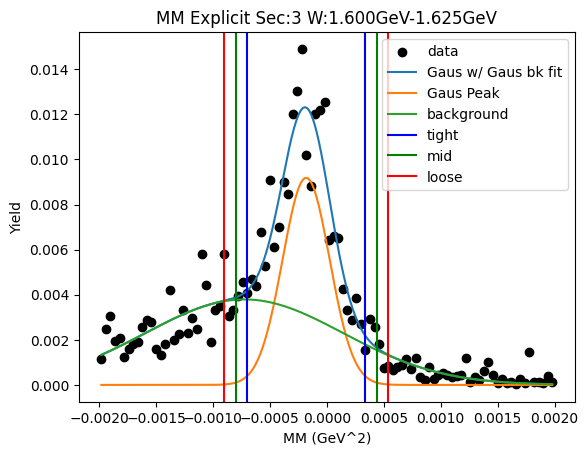

W bin: 9 1.625GeV-1.650GeV
initial Gaus fit:  [ 0.01619513 -0.00018137  0.00023117]
2nd level W dependent
W1_ini_pars: [ 0.01619513 -0.00018137  0.00023117  0.00379142 -0.00072435  0.00086819]
Gaus1 Peak: [ 0.01231295 -0.00015794  0.00017131]
Gaus2 Peak: [ 0.00559706 -0.0006782   0.00076353]
tight should be -0.0005862164519691553   0.0002703443358736863
[[-0.00058622  0.          0.        ]
 [ 0.00027034  0.          0.        ]]
mid should be -0.0006718725307534395   0.0003560004146579705
[[-0.00058622 -0.00067187  0.        ]
 [ 0.00027034  0.000356    0.        ]]
loose should be -0.0007575286095377236   0.00044165649344225463
[[-0.00058622 -0.00067187 -0.00075753]
 [ 0.00027034  0.000356    0.00044166]]
-6.309976756073658e-08 1.129873644240513e-07
Main Gaus Peak [ 0.01231295 -0.00015794  0.00017131]
Gaus2 [ 0.00559706 -0.0006782   0.00076353]


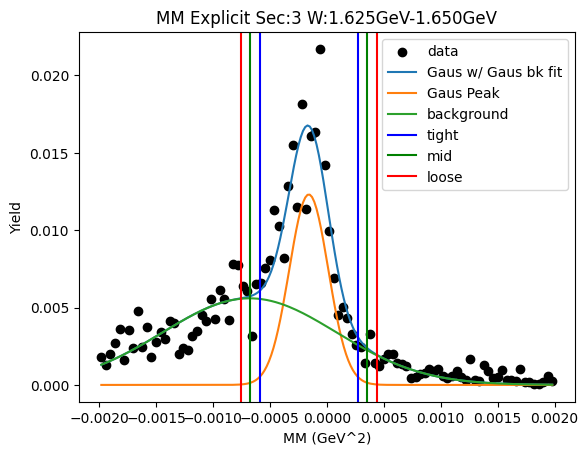

W bin: 10 1.650GeV-1.675GeV
initial Gaus fit:  [ 0.02168967 -0.00014282  0.00021568]
2nd level W dependent
W1_ini_pars: [ 0.02168967 -0.00014282  0.00021568  0.00559706 -0.0006782   0.00076353]
Gaus1 Peak: [ 0.01611437 -0.00010378  0.00012296]
Gaus2 Peak: [ 0.00967057 -0.0005382   0.00064445]
tight should be -0.0004111793516075849   0.0002036154316034545
[[-0.00041118  0.          0.        ]
 [ 0.00020362  0.          0.        ]]
mid should be -0.00047265882992868886   0.00026509490992455845
[[-0.00041118 -0.00047266  0.        ]
 [ 0.00020362  0.00026509  0.        ]]
loose should be -0.0005341383082497927   0.0003265743882456624
[[-0.00041118 -0.00047266 -0.00053414]
 [ 0.00020362  0.00026509  0.00032657]]
-3.4586019833750814e-08 5.612741027749133e-08
Main Gaus Peak [ 0.01611437 -0.00010378  0.00012296]
Gaus2 [ 0.00967057 -0.0005382   0.00064445]


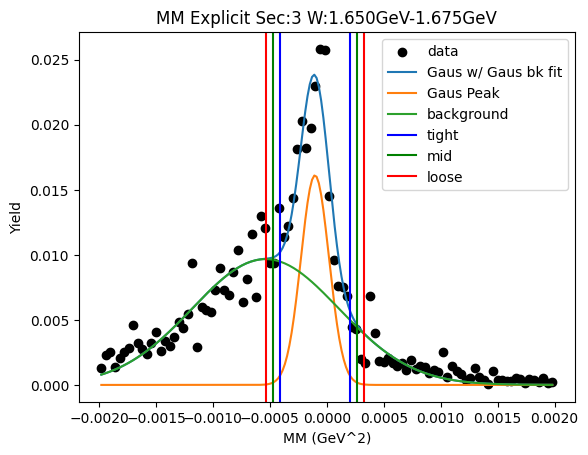

W bin: 11 1.675GeV-1.700GeV
initial Gaus fit:  [ 0.02673949 -0.00016096  0.00023085]
2nd level W dependent
W1_ini_pars: [ 0.02673949 -0.00016096  0.00023085  0.00967057 -0.0005382   0.00064445]
Gaus1 Peak: [ 0.01994624 -0.00011758  0.0001458 ]
Gaus2 Peak: [ 0.01143058 -0.00062339  0.00067759]
tight should be -0.00048208371157711745   0.000246915882428468
[[-0.00048208  0.          0.        ]
 [ 0.00024692  0.          0.        ]]
mid should be -0.0005549836709776761   0.00031981584182902656
[[-0.00048208 -0.00055498  0.        ]
 [ 0.00024692  0.00031982  0.        ]]
loose should be -0.0006278836303782346   0.0003927158012295851
[[-0.00048208 -0.00055498 -0.00062788]
 [ 0.00024692  0.00031982  0.00039272]]
-4.994687200061491e-08 7.759882593385911e-08
Main Gaus Peak [ 0.01994624 -0.00011758  0.0001458 ]
Gaus2 [ 0.01143058 -0.00062339  0.00067759]


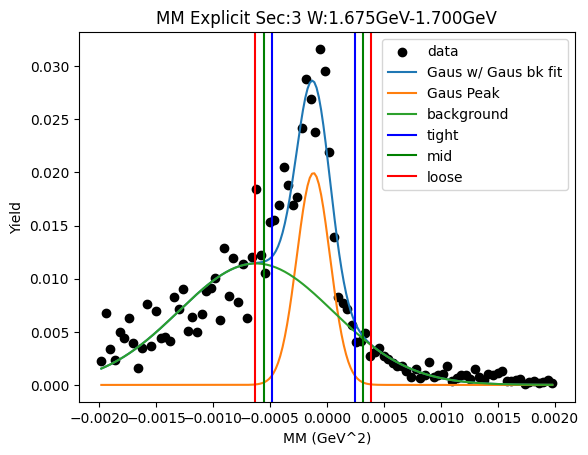

W bin: 12 1.700GeV-1.725GeV
initial Gaus fit:  [ 0.03356146 -0.00015023  0.00022473]
2nd level W dependent
W1_ini_pars: [ 0.03356146 -0.00015023  0.00022473  0.01143058 -0.00062339  0.00067759]
Gaus1 Peak: [ 0.02430472 -0.00012001  0.00014866]
Gaus2 Peak: [ 0.01452537 -0.00064894  0.0007113 ]
tight should be -0.0004916681260325089   0.00025164375354911147
[[-0.00049167  0.          0.        ]
 [ 0.00025164  0.          0.        ]]
mid should be -0.0005659993139906709   0.00032597494150727355
[[-0.00049167 -0.000566    0.        ]
 [ 0.00025164  0.00032597  0.        ]]
loose should be -0.0006403305019488329   0.00040030612946543556
[[-0.00049167 -0.000566   -0.00064033]
 [ 0.00025164  0.00032597  0.00040031]]
-5.189858119274719e-08 8.070443088577153e-08
Main Gaus Peak [ 0.02430472 -0.00012001  0.00014866]
Gaus2 [ 0.01452537 -0.00064894  0.0007113 ]


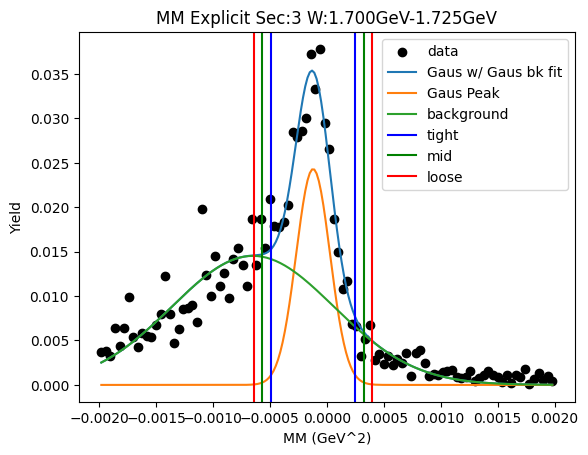

W bin: 13 1.725GeV-1.750GeV
initial Gaus fit:  [ 0.03447069 -0.00016076  0.00028338]
2nd level W dependent
W1_ini_pars: [ 0.03447069 -0.00016076  0.00028338  0.01452537 -0.00064894  0.0007113 ]
Gaus1 Peak: [ 0.02420488 -0.00010545  0.00013688]
Gaus2 Peak: [ 0.01742383 -0.00051628  0.00070738]
tight should be -0.0004476340175741429   0.00023674383497739536
[[-0.00044763  0.          0.        ]
 [ 0.00023674  0.          0.        ]]
mid should be -0.0005160718028292967   0.00030518162023254915
[[-0.00044763 -0.00051607  0.        ]
 [ 0.00023674  0.00030518  0.        ]]
loose should be -0.0005845095880844506   0.000373619405487703
[[-0.00044763 -0.00051607 -0.00058451]
 [ 0.00023674  0.00030518  0.00037362]]
-4.5086098128644216e-08 6.732343268648897e-08
Main Gaus Peak [ 0.02420488 -0.00010545  0.00013688]
Gaus2 [ 0.01742383 -0.00051628  0.00070738]


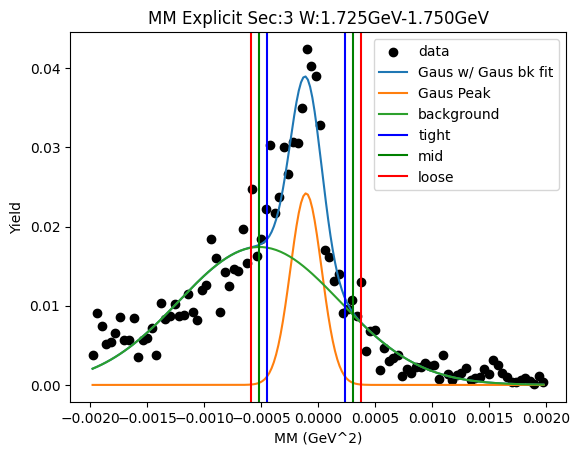

W bin: 14 1.750GeV-1.775GeV
initial Gaus fit:  [ 0.03191829 -0.00023636  0.00035053]
2nd level W dependent
W1_ini_pars: [ 0.03191829 -0.00023636  0.00035053  0.01742383 -0.00051628  0.00070738]
Gaus1 Peak: [ 0.02089293 -0.00018918  0.00023664]
Gaus2 Peak: [ 0.01396009 -0.00065305  0.00084101]
tight should be -0.0007807782564447986   0.0004024224241561911
[[-0.00078078  0.          0.        ]
 [ 0.00040242  0.          0.        ]]
mid should be -0.0008990983245048975   0.00052074249221629
[[-0.00078078 -0.0008991   0.        ]
 [ 0.00040242  0.00052074  0.        ]]
loose should be -0.0010174183925649965   0.000639062560276389
[[-0.00078078 -0.0008991  -0.00101742]
 [ 0.00040242  0.00052074  0.00063906]]
-1.322073781122562e-07 2.0378394602565862e-07
Main Gaus Peak [ 0.02089293 -0.00018918  0.00023664]
Gaus2 [ 0.01396009 -0.00065305  0.00084101]


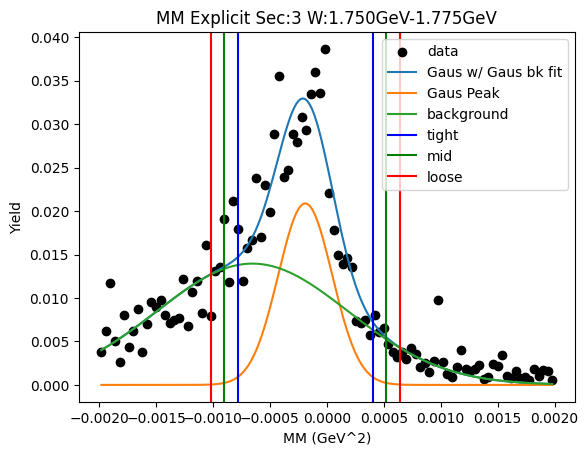

W bin: 15 1.775GeV-1.800GeV
initial Gaus fit:  [ 0.03984079 -0.00017526  0.00026183]
2nd level W dependent
W1_ini_pars: [ 0.03984079 -0.00017526  0.00026183  0.01396009 -0.00065305  0.00084101]
Gaus1 Peak: [ 0.02743817 -0.00014857  0.00017652]
Gaus2 Peak: [ 0.01735897 -0.00061051  0.00073767]
tight should be -0.0005898653443524954   0.0002927332204153589
[[-0.00058987  0.          0.        ]
 [ 0.00029273  0.          0.        ]]
mid should be -0.0006781252008292808   0.0003809930768921444
[[-0.00058987 -0.00067813  0.        ]
 [ 0.00029273  0.00038099  0.        ]]
loose should be -0.0007663850573060662   0.00046925293336892975
[[-0.00058987 -0.00067813 -0.00076639]
 [ 0.00029273  0.00038099  0.00046925]]
-7.14057524147847e-08 1.1554950195248163e-07
Main Gaus Peak [ 0.02743817 -0.00014857  0.00017652]
Gaus2 [ 0.01735897 -0.00061051  0.00073767]


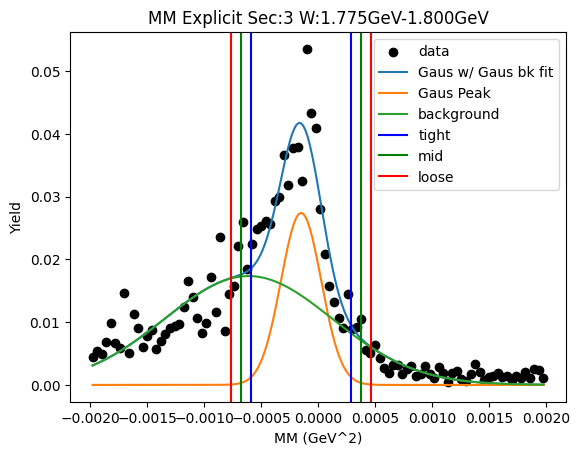

W bin: 16 1.800GeV-1.825GeV
initial Gaus fit:  [ 0.04299455 -0.00017154  0.0002668 ]
2nd level W dependent
W1_ini_pars: [ 0.04299455 -0.00017154  0.0002668   0.01735897 -0.00061051  0.00073767]
Gaus1 Peak: [ 0.03054139 -0.00015328  0.00017624]
Gaus2 Peak: [ 0.01764311 -0.00061967  0.00082805]
tight should be -0.0005938726290737467   0.0002873160509351634
[[-0.00059387  0.          0.        ]
 [ 0.00028732  0.          0.        ]]
mid should be -0.0006819914970746378   0.0003754349189360545
[[-0.00059387 -0.00068199  0.        ]
 [ 0.00028732  0.00037543  0.        ]]
loose should be -0.0007701103650755287   0.00046355378693694547
[[-0.00059387 -0.00068199 -0.00077011]
 [ 0.00028732  0.00037543  0.00046355]]
-6.968498487309213e-08 1.1667345267311077e-07
Main Gaus Peak [ 0.03054139 -0.00015328  0.00017624]
Gaus2 [ 0.01764311 -0.00061967  0.00082805]


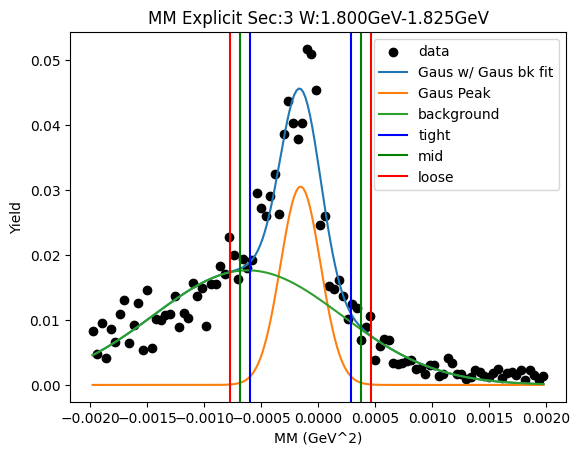

W bin: 17 1.825GeV-1.850GeV
initial Gaus fit:  [ 0.0507248  -0.00018326  0.00026554]
2nd level W dependent
W1_ini_pars: [ 0.0507248  -0.00018326  0.00026554  0.01764311 -0.00061967  0.00082805]
Gaus1 Peak: [ 0.03684931 -0.0001689   0.00020883]
Gaus2 Peak: [ 0.01812743 -0.00068682  0.00080936]
tight should be -0.0006909804484849882   0.00035317737766613327
[[-0.00069098  0.          0.        ]
 [ 0.00035318  0.          0.        ]]
mid should be -0.0007953962311001003   0.00045759316028124537
[[-0.00069098 -0.0007954   0.        ]
 [ 0.00035318  0.00045759  0.        ]]
loose should be -0.0008998120137152125   0.0005620089428963576
[[-0.00069098 -0.0007954  -0.00089981]
 [ 0.00035318  0.00045759  0.00056201]]
-1.0230413924585417e-07 1.5935959657317834e-07
Main Gaus Peak [ 0.03684931 -0.0001689   0.00020883]
Gaus2 [ 0.01812743 -0.00068682  0.00080936]


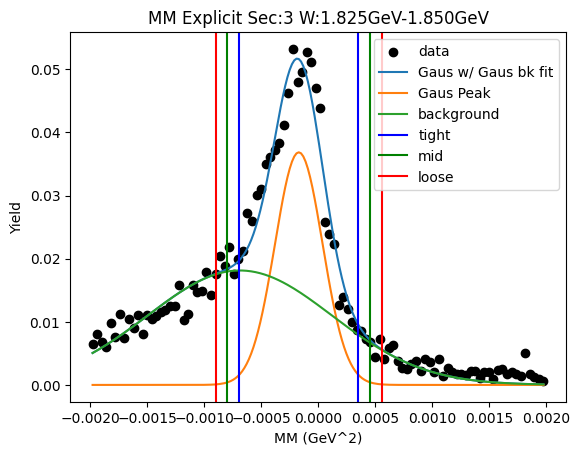

W bin: 18 1.850GeV-1.875GeV
initial Gaus fit:  [ 0.05735166 -0.00016502  0.00024911]
2nd level W dependent
W1_ini_pars: [ 0.05735166 -0.00016502  0.00024911  0.01812743 -0.00068682  0.00080936]
Gaus1 Peak: [ 0.03997287 -0.00013968  0.00015885]
Gaus2 Peak: [ 0.02487814 -0.00058354  0.0007549 ]
tight should be -0.0005368036175012023   0.000257453002822091
[[-0.0005368   0.          0.        ]
 [ 0.00025745  0.          0.        ]]
mid should be -0.0006162292795335316   0.0003368786648544203
[[-0.0005368  -0.00061623  0.        ]
 [ 0.00025745  0.00033688  0.        ]]
loose should be -0.000695654941565861   0.0004163043268867497
[[-0.0005368  -0.00061623 -0.00069565]
 [ 0.00025745  0.00033688  0.0004163 ]]
-5.619203799088628e-08 9.521042095168493e-08
Main Gaus Peak [ 0.03997287 -0.00013968  0.00015885]
Gaus2 [ 0.02487814 -0.00058354  0.0007549 ]


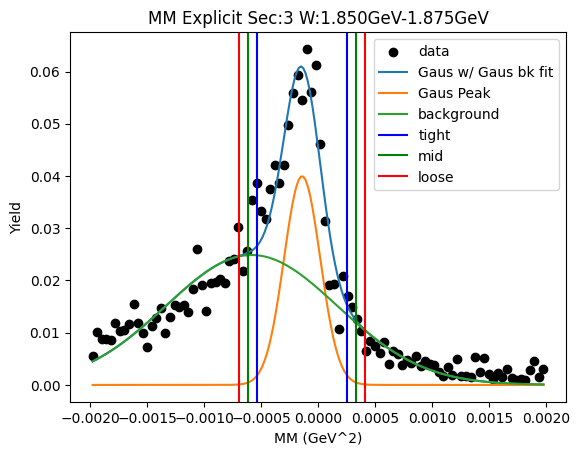

W bin: 19 1.875GeV-1.900GeV
initial Gaus fit:  [ 0.06687121 -0.00014364  0.00024422]
2nd level W dependent
W1_ini_pars: [ 0.06687121 -0.00014364  0.00024422  0.02487814 -0.00058354  0.0007549 ]
Gaus1 Peak: [ 0.04676562 -0.00010888  0.00013729]
Gaus2 Peak: [ 0.03102814 -0.00052187  0.00071516]
tight should be -0.0004521008618611918   0.00023433326350229017
[[-0.0004521   0.          0.        ]
 [ 0.00023433  0.          0.        ]]
mid should be -0.00052074427439754   0.00030297667603863837
[[-0.0004521  -0.00052074  0.        ]
 [ 0.00023433  0.00030298  0.        ]]
loose should be -0.0005893876869338882   0.00037162008857498656
[[-0.0004521  -0.00052074 -0.00058939]
 [ 0.00023433  0.00030298  0.00037162]]
-4.468733529187244e-08 6.839869873937439e-08
Main Gaus Peak [ 0.04676562 -0.00010888  0.00013729]
Gaus2 [ 0.03102814 -0.00052187  0.00071516]


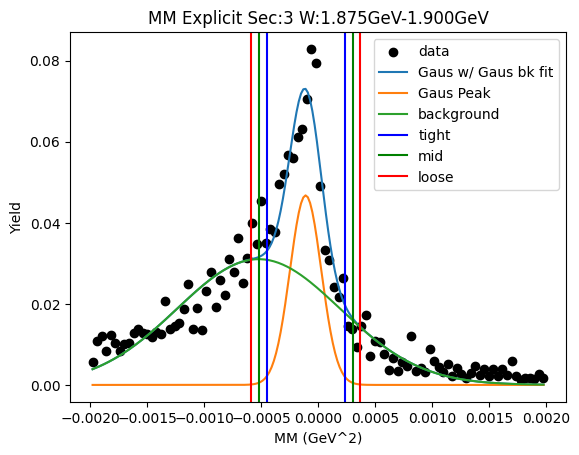

W bin: 20 1.900GeV-1.925GeV
initial Gaus fit:  [ 0.06826204 -0.00015224  0.00024177]
2nd level W dependent
W1_ini_pars: [ 0.06826204 -0.00015224  0.00024177  0.03102814 -0.00052187  0.00071516]
Gaus1 Peak: [ 0.04924605 -0.00011159  0.00012652]
Gaus2 Peak: [ 0.0332355  -0.00059724  0.00074619]
tight should be -0.00042788127566443563   0.00020470984690879182
[[-0.00042788  0.          0.        ]
 [ 0.00020471  0.          0.        ]]
mid should be -0.0004911403879217583   0.00026796895916611453
[[-0.00042788 -0.00049114  0.        ]
 [ 0.00020471  0.00026797  0.        ]]
loose should be -0.0005543995001790811   0.00033122807142343724
[[-0.00042788 -0.00049114 -0.0005544 ]
 [ 0.00020471  0.00026797  0.00033123]]
-3.556921174980587e-08 6.047195505622358e-08
Main Gaus Peak [ 0.04924605 -0.00011159  0.00012652]
Gaus2 [ 0.0332355  -0.00059724  0.00074619]


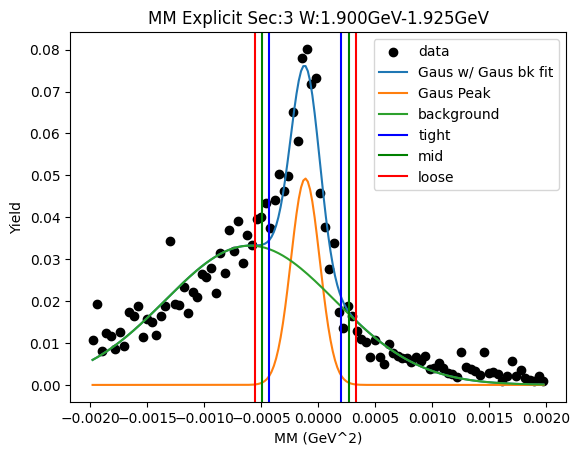

W bin: 21 1.925GeV-1.950GeV
initial Gaus fit:  [ 0.07268784 -0.00018392  0.0002774 ]
2nd level W dependent
W1_ini_pars: [ 0.07268784 -0.00018392  0.0002774   0.0332355  -0.00059724  0.00074619]
Gaus1 Peak: [ 0.04907718 -0.00015319  0.00018919]
Gaus2 Peak: [ 0.03219359 -0.00065588  0.00079639]
tight should be -0.0006261537274317238   0.0003197741605634316
[[-0.00062615  0.          0.        ]
 [ 0.00031977  0.          0.        ]]
mid should be -0.0007207465162312394   0.0004143669493629472
[[-0.00062615 -0.00072075  0.        ]
 [ 0.00031977  0.00041437  0.        ]]
loose should be -0.0008153393050307549   0.0005089597381624627
[[-0.00062615 -0.00072075 -0.00081534]
 [ 0.00031977  0.00041437  0.00050896]]
-8.390643856583646e-08 1.308406580630376e-07
Main Gaus Peak [ 0.04907718 -0.00015319  0.00018919]
Gaus2 [ 0.03219359 -0.00065588  0.00079639]


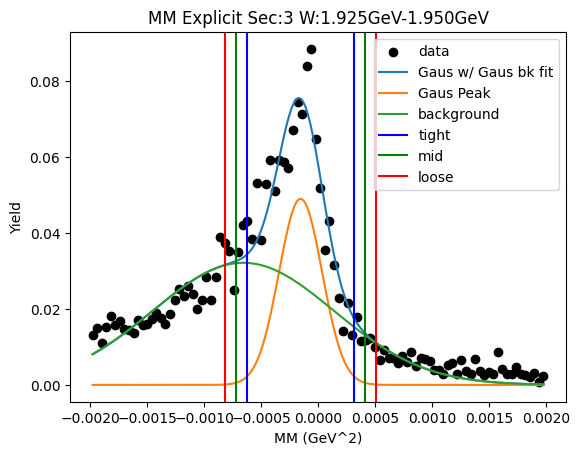

W bin: 22 1.950GeV-1.975GeV
initial Gaus fit:  [ 0.08543551 -0.00019649  0.00026227]
2nd level W dependent
W1_ini_pars: [ 0.08543551 -0.00019649  0.00026227  0.03219359 -0.00065588  0.00079639]
Gaus1 Peak: [ 0.06041254 -0.00017264  0.00018123]
Gaus2 Peak: [ 0.03408481 -0.00065464  0.00080427]
tight should be -0.000625714603539244   0.00028043027316958474
[[-0.00062571  0.          0.        ]
 [ 0.00028043  0.          0.        ]]
mid should be -0.0007163290912101268   0.0003710447608404675
[[-0.00062571 -0.00071633  0.        ]
 [ 0.00028043  0.00037104  0.        ]]
loose should be -0.0008069435788810097   0.0004616592485113504
[[-0.00062571 -0.00071633 -0.00080694]
 [ 0.00028043  0.00037104  0.00046166]]
-6.872650731057298e-08 1.28337141709985e-07
Main Gaus Peak [ 0.06041254 -0.00017264  0.00018123]
Gaus2 [ 0.03408481 -0.00065464  0.00080427]


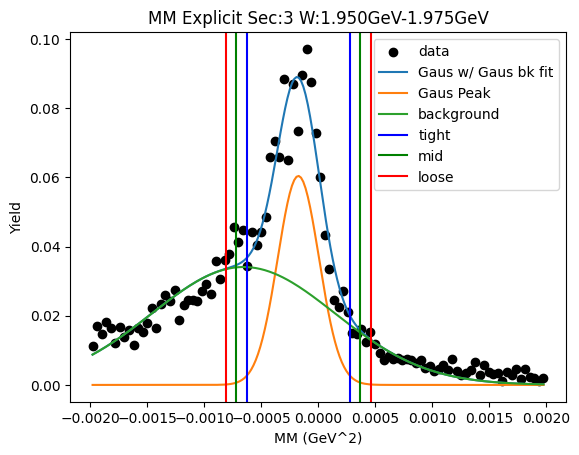

W bin: 23 1.975GeV-2.000GeV
initial Gaus fit:  [ 0.09193705 -0.00019677  0.00028094]
2nd level W dependent
W1_ini_pars: [ 0.09193705 -0.00019677  0.00028094  0.03408481 -0.00065464  0.00080427]
Gaus1 Peak: [ 0.06473993 -0.00017102  0.0001927 ]
Gaus2 Peak: [ 0.03667466 -0.00064009  0.00082963]
tight should be -0.0006527684555215285   0.0003107341362993282
[[-0.00065277  0.          0.        ]
 [ 0.00031073  0.          0.        ]]
mid should be -0.000749118714703614   0.0004070843954814139
[[-0.00065277 -0.00074912  0.        ]
 [ 0.00031073  0.00040708  0.        ]]
loose should be -0.0008454689738856998   0.0005034346546634995
[[-0.00065277 -0.00074912 -0.00084547]
 [ 0.00031073  0.00040708  0.00050343]]
-8.21536004520125e-08 1.4064733821490947e-07
Main Gaus Peak [ 0.06473993 -0.00017102  0.0001927 ]
Gaus2 [ 0.03667466 -0.00064009  0.00082963]


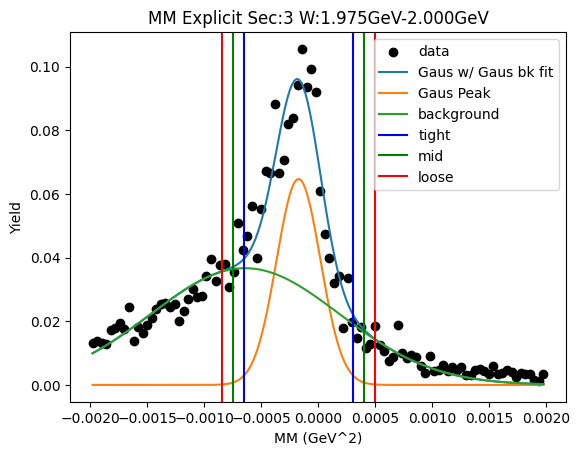

W bin: 24 2.000GeV-2.025GeV
initial Gaus fit:  [ 0.09449622 -0.00017145  0.00026354]
2nd level W dependent
W1_ini_pars: [ 0.09449622 -0.00017145  0.00026354  0.03667466 -0.00064009  0.00082963]
Gaus1 Peak: [ 0.06649923 -0.0001487   0.0001797 ]
Gaus2 Peak: [ 0.03842006 -0.00062553  0.00081639]
tight should be -0.0005979487999311098   0.00030055592988469375
[[-0.00059795  0.          0.        ]
 [ 0.00030056  0.          0.        ]]
mid should be -0.0006877992729126901   0.000390406402866274
[[-0.00059795 -0.0006878   0.        ]
 [ 0.00030056  0.00039041  0.        ]]
loose should be -0.0007776497458942704   0.0004802568758478544
[[-0.00059795 -0.0006878  -0.00077765]
 [ 0.00030056  0.00039041  0.00048026]]
-7.476666015155326e-08 1.1898791972877553e-07
Main Gaus Peak [ 0.06649923 -0.0001487   0.0001797 ]
Gaus2 [ 0.03842006 -0.00062553  0.00081639]


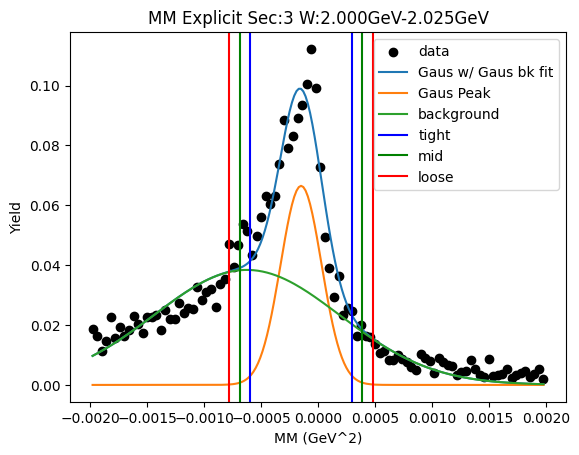

W bin: 25 2.025GeV-2.050GeV
initial Gaus fit:  [ 0.10753279 -0.00017529  0.0002609 ]
2nd level W dependent
W1_ini_pars: [ 0.10753279 -0.00017529  0.0002609   0.03842006 -0.00062553  0.00081639]
Gaus1 Peak: [ 0.07719813 -0.00014557  0.0001763 ]
Gaus2 Peak: [ 0.04303452 -0.00063046  0.00079128]
tight should be -0.00058633465182483   0.0002951880044662728
[[-0.00058633  0.          0.        ]
 [ 0.00029519  0.          0.        ]]
mid should be -0.0006744869174539403   0.00038334027009538315
[[-0.00058633 -0.00067449  0.        ]
 [ 0.00029519  0.00038334  0.        ]]
loose should be -0.0007626391830830505   0.0004714925357244934
[[-0.00058633 -0.00067449 -0.00076264]
 [ 0.00029519  0.00038334  0.00047149]]
-7.20582706595106e-08 1.1444145579357463e-07
Main Gaus Peak [ 0.07719813 -0.00014557  0.0001763 ]
Gaus2 [ 0.04303452 -0.00063046  0.00079128]


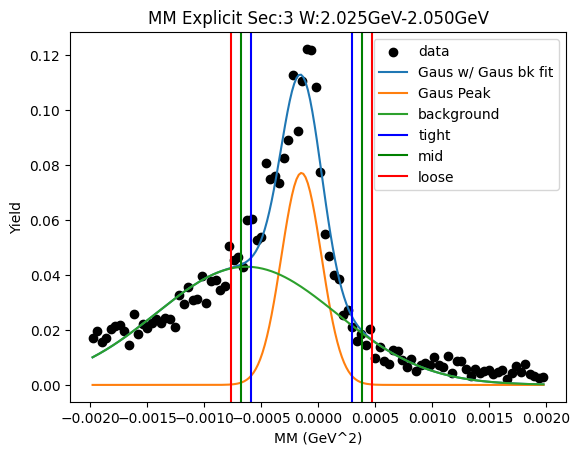

W bin: 26 2.050GeV-2.075GeV
initial Gaus fit:  [ 0.12015041 -0.00016491  0.0002401 ]
2nd level W dependent
W1_ini_pars: [ 0.12015041 -0.00016491  0.0002401   0.04303452 -0.00063046  0.00079128]
Gaus1 Peak: [ 0.08592048 -0.00014874  0.00017484]
Gaus2 Peak: [ 0.04619734 -0.00066591  0.00081813]
tight should be -0.0005858327694273811   0.0002883532323308946
[[-0.00058583  0.          0.        ]
 [ 0.00028835  0.          0.        ]]
mid should be -0.0006732513696032085   0.0003757718325067221
[[-0.00058583 -0.00067325  0.        ]
 [ 0.00028835  0.00037577  0.        ]]
loose should be -0.0007606699697790361   0.00046319043268254966
[[-0.00058583 -0.00067325 -0.00076067]
 [ 0.00028835  0.00037577  0.00046319]]
-6.95806211326294e-08 1.1382765862819933e-07
Main Gaus Peak [ 0.08592048 -0.00014874  0.00017484]
Gaus2 [ 0.04619734 -0.00066591  0.00081813]


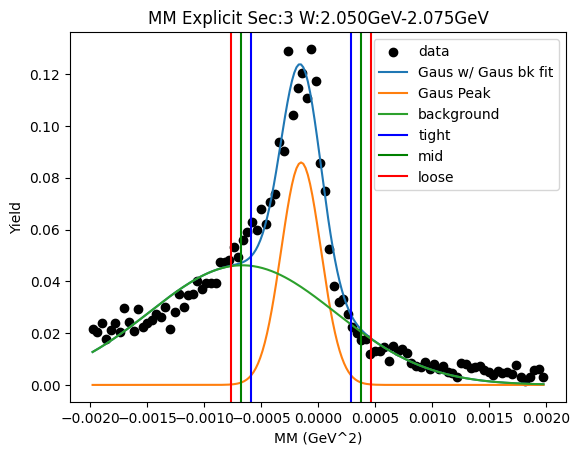

W bin: 27 2.075GeV-2.100GeV
initial Gaus fit:  [ 0.11485698 -0.00017877  0.00025756]
2nd level W dependent
W1_ini_pars: [ 0.11485698 -0.00017877  0.00025756  0.04619734 -0.00066591  0.00081813]
Gaus1 Peak: [ 0.07883358 -0.00014731  0.00016221]
Gaus2 Peak: [ 0.05186899 -0.00062396  0.00077451]
tight should be -0.0005528295234911953   0.0002582042086930978
[[-0.00055283  0.          0.        ]
 [ 0.0002582   0.          0.        ]]
mid should be -0.0006339328967096246   0.00033930758191152706
[[-0.00055283 -0.00063393  0.        ]
 [ 0.0002582   0.00033931  0.        ]]
loose should be -0.0007150362699280539   0.00042041095512995643
[[-0.00055283 -0.00063393 -0.00071504]
 [ 0.0002582   0.00033931  0.00042041]]
-5.7232066738924525e-08 1.0063410479886353e-07
Main Gaus Peak [ 0.07883358 -0.00014731  0.00016221]
Gaus2 [ 0.05186899 -0.00062396  0.00077451]


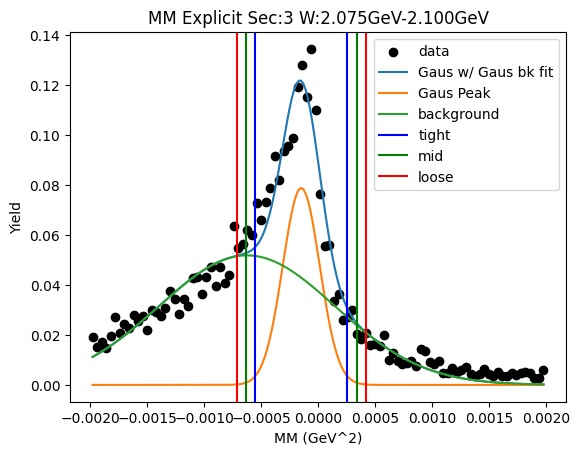

W bin: 28 2.100GeV-2.125GeV
initial Gaus fit:  [ 0.12672708 -0.00017432  0.00025597]
2nd level W dependent
W1_ini_pars: [ 0.12672708 -0.00017432  0.00025597  0.05186899 -0.00062396  0.00077451]
Gaus1 Peak: [ 0.08759947 -0.00015157  0.00019051]
Gaus2 Peak: [ 0.05207553 -0.00067225  0.00078291]
tight should be -0.0006278323333805054   0.0003246939440024909
[[-0.00062783  0.          0.        ]
 [ 0.00032469  0.          0.        ]]
mid should be -0.000723084961118805   0.0004199465717407905
[[-0.00062783 -0.00072308  0.        ]
 [ 0.00032469  0.00041995  0.        ]]
loose should be -0.0008183375888571047   0.0005151991994790902
[[-0.00062783 -0.00072308 -0.00081834]
 [ 0.00032469  0.00041995  0.0005152 ]]
-8.590353631393886e-08 1.3184997787128726e-07
Main Gaus Peak [ 0.08759947 -0.00015157  0.00019051]
Gaus2 [ 0.05207553 -0.00067225  0.00078291]


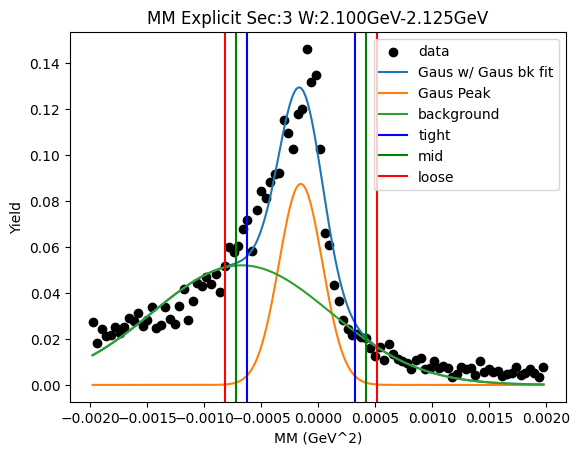

initial bw fit:  [ 3.31571451e+00 -3.05055794e-04  4.73275987e-04]
input parameters for r2 [ 3.31571451e+00 -3.05055794e-04  4.73275987e-04  5.00000000e+00
 -8.08201518e-04  5.76255640e-04]
r2 parameters [ 2.98066105e+00 -1.43618299e-04  1.73771862e-04  1.70332328e+00
 -6.39316639e-04  7.63038253e-04]
-6.996376384481555e-08 1.1121619551588035e-07
Main Gaus Peak [ 2.98066105e+00 -1.43618299e-04  1.73771862e-04]
Gaus2 [ 1.70332328e+00 -6.39316639e-04  7.63038253e-04]


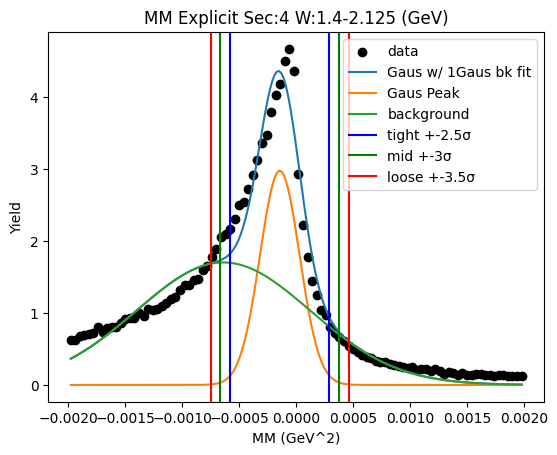

W bin: 0 1.400GeV-1.425GeV
initial Gaus fit:  [ 0.01093015 -0.00016429  0.0002275 ]
2nd level W dependent
W1_ini_pars: [ 0.01093015 -0.00016429  0.0002275   0.00947786 -0.00060779  0.00061885]
Gaus1 Peak: [ 0.00817603 -0.00012859  0.000161  ]
Gaus2 Peak: [ 0.0043968  -0.00064718  0.00065124]
tight should be -0.0005310939415008139   0.00027391494891551387
[[-0.00053109  0.          0.        ]
 [ 0.00027391  0.          0.        ]]
mid should be -0.0006115948305424466   0.00035441583795714666
[[-0.00053109 -0.00061159  0.        ]
 [ 0.00027391  0.00035442  0.        ]]
loose should be -0.0006920957195840794   0.00043491672699877935
[[-0.00053109 -0.00061159 -0.0006921 ]
 [ 0.00027391  0.00035442  0.00043492]]
-6.122945908112181e-08 9.42999761947167e-08
Main Gaus Peak [ 0.00817603 -0.00012859  0.000161  ]
Gaus2 [ 0.0043968  -0.00064718  0.00065124]


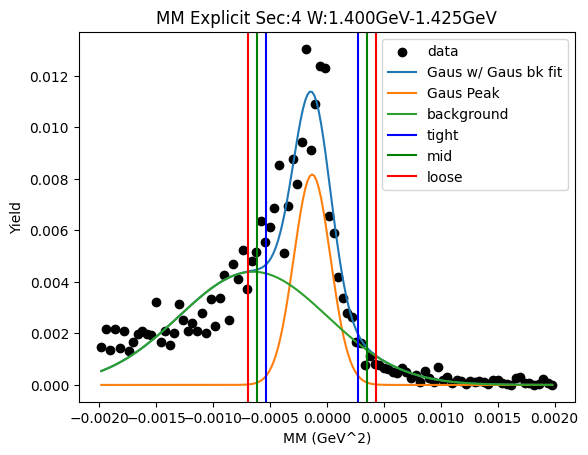

W bin: 1 1.425GeV-1.450GeV
initial Gaus fit:  [ 0.01822885 -0.00015888  0.00021942]
2nd level W dependent
W1_ini_pars: [ 0.01822885 -0.00015888  0.00021942  0.0043968  -0.00064718  0.00065124]
Gaus1 Peak: [ 0.01390977 -0.00012147  0.00015064]
Gaus2 Peak: [ 0.00727114 -0.000642    0.00064397]
tight should be -0.0004980732911693259   0.00025513951063607887
[[-0.00049807  0.          0.        ]
 [ 0.00025514  0.          0.        ]]
mid should be -0.0005733945713498664   0.0003304607908166193
[[-0.00049807 -0.00057339  0.        ]
 [ 0.00025514  0.00033046  0.        ]]
loose should be -0.0006487158515304069   0.0004057820709971598
[[-0.00049807 -0.00057339 -0.00064872]
 [ 0.00025514  0.00033046  0.00040578]]
-5.33253375453818e-08 8.283374840746971e-08
Main Gaus Peak [ 0.01390977 -0.00012147  0.00015064]
Gaus2 [ 0.00727114 -0.000642    0.00064397]


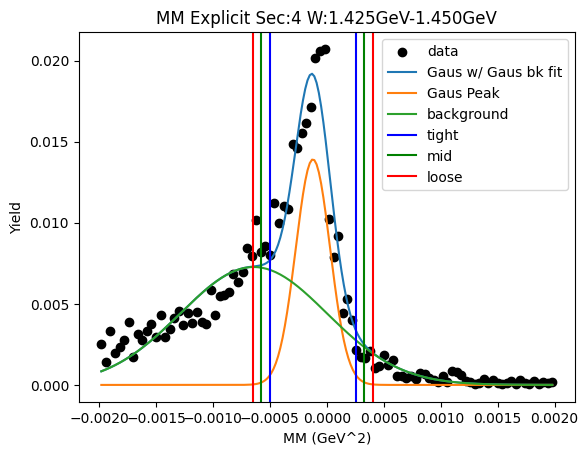

W bin: 2 1.450GeV-1.475GeV
initial Gaus fit:  [ 0.02529967 -0.00016732  0.00024902]
2nd level W dependent
W1_ini_pars: [ 0.02529967 -0.00016732  0.00024902  0.00727114 -0.000642    0.00064397]
Gaus1 Peak: [ 0.01771574 -0.00013185  0.00016808]
Gaus2 Peak: [ 0.01118143 -0.00060108  0.00065737]
tight should be -0.0005520484935279376   0.00028835350669683085
[[-0.00055205  0.          0.        ]
 [ 0.00028835  0.          0.        ]]
mid should be -0.0006360886935504144   0.0003723937067193077
[[-0.00055205 -0.00063609  0.        ]
 [ 0.00028835  0.00037239  0.        ]]
loose should be -0.0007201288935728912   0.00045643390674178453
[[-0.00055205 -0.00063609 -0.00072013]
 [ 0.00028835  0.00037239  0.00045643]]
-6.736930111785061e-08 1.0213682415777937e-07
Main Gaus Peak [ 0.01771574 -0.00013185  0.00016808]
Gaus2 [ 0.01118143 -0.00060108  0.00065737]


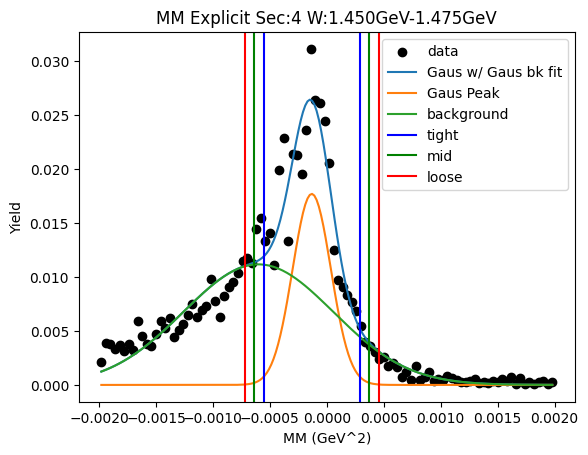

W bin: 3 1.475GeV-1.500GeV
initial Gaus fit:  [ 0.03844575 -0.0001691   0.00024066]
2nd level W dependent
W1_ini_pars: [ 0.03844575 -0.0001691   0.00024066  0.01118143 -0.00060108  0.00065737]
Gaus1 Peak: [ 0.02815829 -0.00014019  0.00018405]
Gaus2 Peak: [ 0.01485241 -0.00064326  0.00065555]
tight should be -0.0006003120652747871   0.00031992673786408244
[[-0.00060031  0.          0.        ]
 [ 0.00031993  0.          0.        ]]
mid should be -0.0006923359455886741   0.00041195061817796944
[[-0.00060031 -0.00069234  0.        ]
 [ 0.00031993  0.00041195  0.        ]]
loose should be -0.000784359825902561   0.0005039744984918563
[[-0.00060031 -0.00069234 -0.00078436]
 [ 0.00031993  0.00041195  0.00050397]]
-8.196675161949309e-08 1.212747175330971e-07
Main Gaus Peak [ 0.02815829 -0.00014019  0.00018405]
Gaus2 [ 0.01485241 -0.00064326  0.00065555]


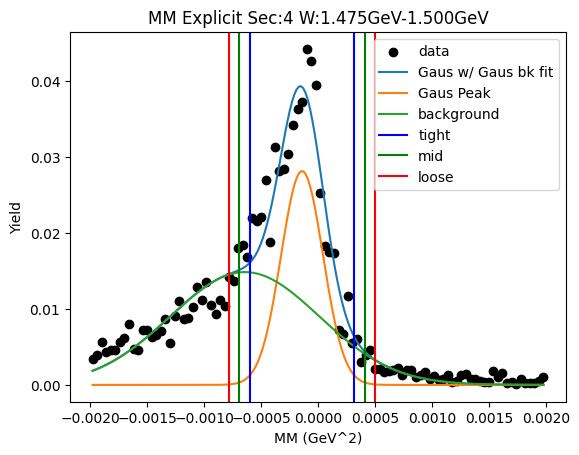

W bin: 4 1.500GeV-1.525GeV
initial Gaus fit:  [ 0.04691241 -0.0001643   0.00022431]
2nd level W dependent
W1_ini_pars: [ 0.04691241 -0.0001643   0.00022431  0.01485241 -0.00064326  0.00065555]
Gaus1 Peak: [ 0.03465439 -0.00012865  0.00015181]
Gaus2 Peak: [ 0.01986007 -0.00067467  0.00069454]
tight should be -0.0005081773434203606   0.0002508709453447033
[[-0.00050818  0.          0.        ]
 [ 0.00025087  0.          0.        ]]
mid should be -0.000584082172296867   0.0003267757742212096
[[-0.00050818 -0.00058408  0.        ]
 [ 0.00025087  0.00032678  0.        ]]
loose should be -0.0006599870011733734   0.000402680603097716
[[-0.00050818 -0.00058408 -0.00065999]
 [ 0.00025087  0.00032678  0.00040268]]
-5.258687093859345e-08 8.569016218392775e-08
Main Gaus Peak [ 0.03465439 -0.00012865  0.00015181]
Gaus2 [ 0.01986007 -0.00067467  0.00069454]


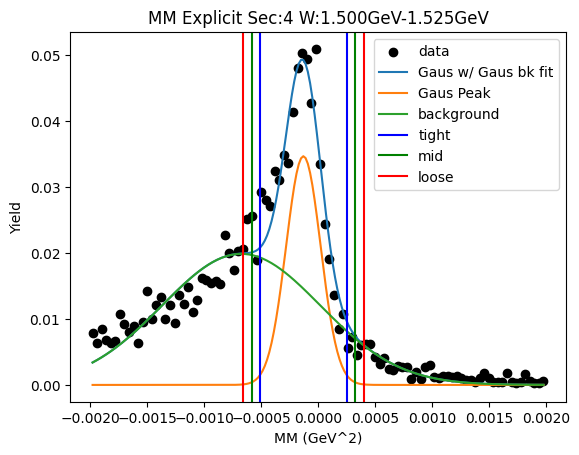

W bin: 5 1.525GeV-1.550GeV
initial Gaus fit:  [ 0.04943364 -0.00016306  0.00025624]
2nd level W dependent
W1_ini_pars: [ 0.04943364 -0.00016306  0.00025624  0.01986007 -0.00067467  0.00069454]
Gaus1 Peak: [ 0.03489551 -0.00012611  0.00016967]
Gaus2 Peak: [ 0.02199698 -0.00062547  0.00069415]
tight should be -0.0005502835229585724   0.0002980691773984382
[[-0.00055028  0.          0.        ]
 [ 0.00029807  0.          0.        ]]
mid should be -0.0006351187929942736   0.0003829044474341393
[[-0.00055028 -0.00063512  0.        ]
 [ 0.00029807  0.0003829   0.        ]]
loose should be -0.0007199540630299747   0.0004677397174698404
[[-0.00055028 -0.00063512 -0.00071995]
 [ 0.00029807  0.0003829   0.00046774]]
-7.046125747778215e-08 1.0226729553094555e-07
Main Gaus Peak [ 0.03489551 -0.00012611  0.00016967]
Gaus2 [ 0.02199698 -0.00062547  0.00069415]


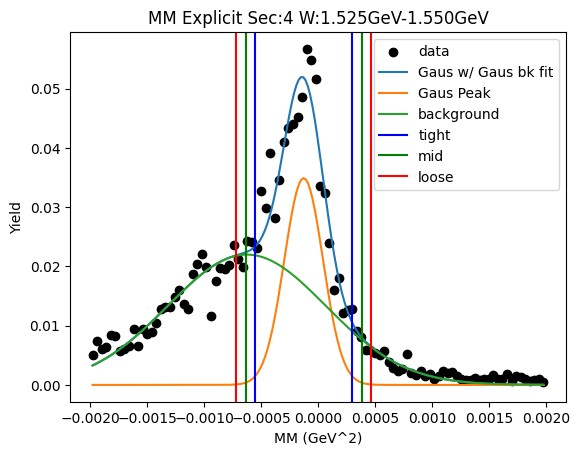

W bin: 6 1.550GeV-1.575GeV
initial Gaus fit:  [ 0.05187292 -0.00018     0.00026075]
2nd level W dependent
W1_ini_pars: [ 0.05187292 -0.00018     0.00026075  0.02199698 -0.00062547  0.00069415]
Gaus1 Peak: [ 0.03634869 -0.00015172  0.00018933]
Gaus2 Peak: [ 0.02172427 -0.00069692  0.00077066]
tight should be -0.0006250412013934273   0.00032160041977702034
[[-0.00062504  0.          0.        ]
 [ 0.0003216   0.          0.        ]]
mid should be -0.000719705363510472   0.0004162645818940651
[[-0.00062504 -0.00071971  0.        ]
 [ 0.0003216   0.00041626  0.        ]]
loose should be -0.0008143695256275168   0.0005109287440111099
[[-0.00062504 -0.00071971 -0.00081437]
 [ 0.0003216   0.00041626  0.00051093]]
-8.451656608487159e-08 1.305547200588596e-07
Main Gaus Peak [ 0.03634869 -0.00015172  0.00018933]
Gaus2 [ 0.02172427 -0.00069692  0.00077066]


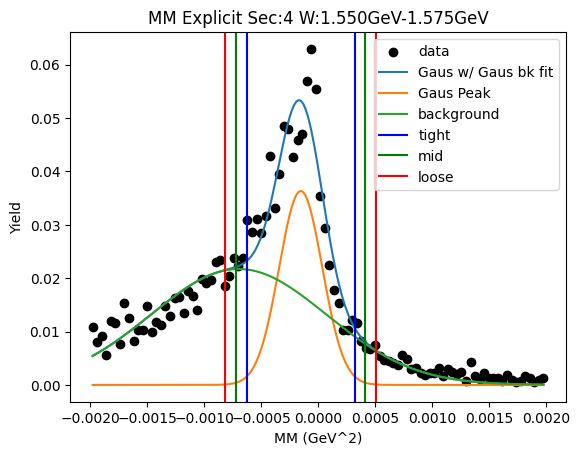

W bin: 7 1.575GeV-1.600GeV
initial Gaus fit:  [ 0.05731831 -0.00017661  0.00026617]
2nd level W dependent
W1_ini_pars: [ 0.05731831 -0.00017661  0.00026617  0.02172427 -0.00069692  0.00077066]
Gaus1 Peak: [ 0.04003989 -0.00014888  0.0001828 ]
Gaus2 Peak: [ 0.02397954 -0.00063875  0.00077997]
tight should be -0.0006058687780623549   0.0003081116900212125
[[-0.00060587  0.          0.        ]
 [ 0.00030811  0.          0.        ]]
mid should be -0.0006972668248707115   0.0003995097368295692
[[-0.00060587 -0.00069727  0.        ]
 [ 0.00030811  0.00039951  0.        ]]
loose should be -0.0007886648716790683   0.000490907783637926
[[-0.00060587 -0.00069727 -0.00078866]
 [ 0.00030811  0.00039951  0.00049091]]
-7.807841465490565e-08 1.2240805639427598e-07
Main Gaus Peak [ 0.04003989 -0.00014888  0.0001828 ]
Gaus2 [ 0.02397954 -0.00063875  0.00077997]


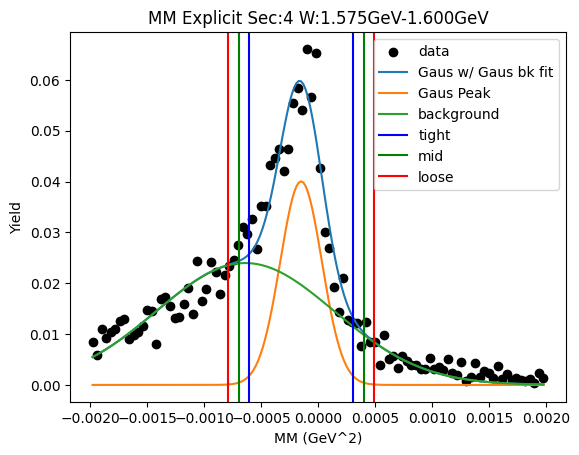

W bin: 8 1.600GeV-1.625GeV
initial Gaus fit:  [ 0.06852392 -0.00016813  0.0002549 ]
2nd level W dependent
W1_ini_pars: [ 0.06852392 -0.00016813  0.0002549   0.02397954 -0.00063875  0.00077997]
Gaus1 Peak: [ 0.0487783  -0.00014294  0.00018553]
Gaus2 Peak: [ 0.02760016 -0.00066885  0.00076089]
tight should be -0.000606750677601814   0.0003208782527622764
[[-0.00060675  0.          0.        ]
 [ 0.00032088  0.          0.        ]]
mid should be -0.000699513570638223   0.0004136411457986854
[[-0.00060675 -0.00069951  0.        ]
 [ 0.00032088  0.00041364  0.        ]]
loose should be -0.0007922764636746321   0.0005064040388350944
[[-0.00060675 -0.00069951 -0.00079228]
 [ 0.00032088  0.00041364  0.0005064 ]]
-8.28286910729019e-08 1.2369021271472044e-07
Main Gaus Peak [ 0.0487783  -0.00014294  0.00018553]
Gaus2 [ 0.02760016 -0.00066885  0.00076089]


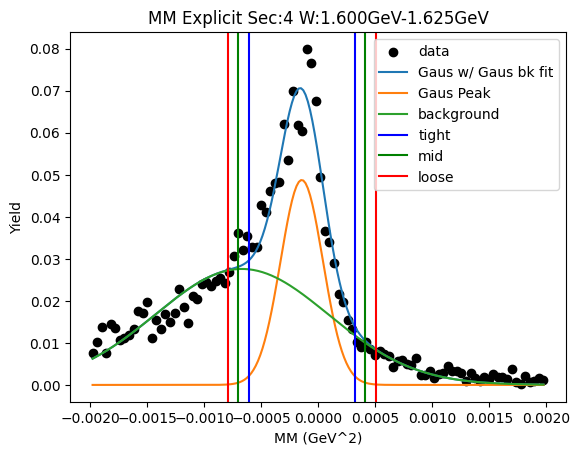

W bin: 9 1.625GeV-1.650GeV
initial Gaus fit:  [ 0.08474134 -0.00016312  0.00023603]
2nd level W dependent
W1_ini_pars: [ 0.08474134 -0.00016312  0.00023603  0.02760016 -0.00066885  0.00076089]
Gaus1 Peak: [ 0.06299267 -0.00013039  0.00014866]
Gaus2 Peak: [ 0.0347479  -0.00061761  0.00073802]
tight should be -0.0005020303596307078   0.0002412491451771775
[[-0.00050203  0.          0.        ]
 [ 0.00024125  0.          0.        ]]
mid should be -0.0005763583101114963   0.00031557709565796597
[[-0.00050203 -0.00057636  0.        ]
 [ 0.00024125  0.00031558  0.        ]]
loose should be -0.0006506862605922849   0.00038990504613875456
[[-0.00050203 -0.00057636 -0.00065069]
 [ 0.00024125  0.00031558  0.00038991]]
-4.9294020219130075e-08 8.329744112505914e-08
Main Gaus Peak [ 0.06299267 -0.00013039  0.00014866]
Gaus2 [ 0.0347479  -0.00061761  0.00073802]


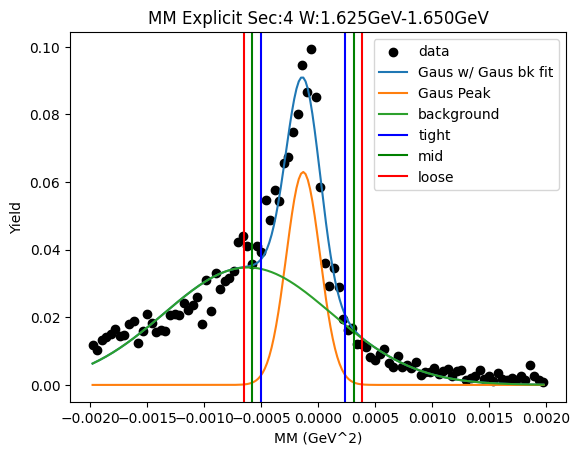

W bin: 10 1.650GeV-1.675GeV
initial Gaus fit:  [ 0.10683562 -0.00015556  0.00023463]
2nd level W dependent
W1_ini_pars: [ 0.10683562 -0.00015556  0.00023463  0.0347479  -0.00061761  0.00073802]
Gaus1 Peak: [ 0.08006265 -0.00013952  0.00018099]
Gaus2 Peak: [ 0.03705323 -0.00066686  0.0007754 ]
tight should be -0.0005919986207002031   0.0003129523191780859
[[-0.000592    0.          0.        ]
 [ 0.00031295  0.          0.        ]]
mid should be -0.0006824937146880319   0.0004034474131659147
[[-0.000592   -0.00068249  0.        ]
 [ 0.00031295  0.00040345  0.        ]]
loose should be -0.0007729888086758608   0.0004939425071537436
[[-0.000592   -0.00068249 -0.00077299]
 [ 0.00031295  0.00040345  0.00049394]]
-7.880563483209872e-08 1.1773905402868491e-07
Main Gaus Peak [ 0.08006265 -0.00013952  0.00018099]
Gaus2 [ 0.03705323 -0.00066686  0.0007754 ]


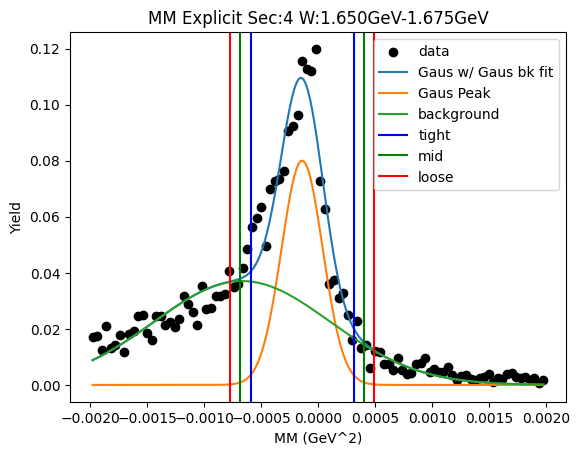

W bin: 11 1.675GeV-1.700GeV
initial Gaus fit:  [ 0.12793972 -0.00017365  0.00024074]
2nd level W dependent
W1_ini_pars: [ 0.12793972 -0.00017365  0.00024074  0.03705323 -0.00066686  0.0007754 ]
Gaus1 Peak: [ 0.09200053 -0.00014416  0.00017873]
Gaus2 Peak: [ 0.05068049 -0.0006395   0.00068685]
tight should be -0.0005909906160933965   0.00030267245771135377
[[-0.00059099  0.          0.        ]
 [ 0.00030267  0.          0.        ]]
mid should be -0.0006803569234738714   0.00039203876509182875
[[-0.00059099 -0.00068036  0.        ]
 [ 0.00030267  0.00039204  0.        ]]
loose should be -0.0007697232308543464   0.0004814050724723038
[[-0.00059099 -0.00068036 -0.00076972]
 [ 0.00030267  0.00039204  0.00048141]]
-7.505420262465535e-08 1.1661788285106169e-07
Main Gaus Peak [ 0.09200053 -0.00014416  0.00017873]
Gaus2 [ 0.05068049 -0.0006395   0.00068685]


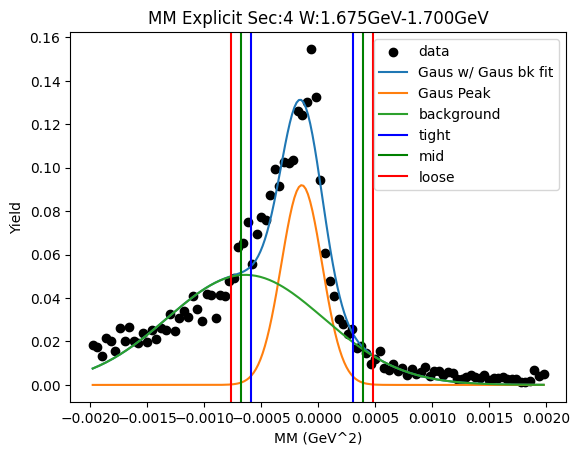

W bin: 12 1.700GeV-1.725GeV
initial Gaus fit:  [ 0.15150097 -0.00016799  0.00023286]
2nd level W dependent
W1_ini_pars: [ 0.15150097 -0.00016799  0.00023286  0.05068049 -0.0006395   0.00068685]
Gaus1 Peak: [ 0.10957598 -0.00013689  0.00015889]
Gaus2 Peak: [ 0.06223545 -0.00061971  0.00069328]
tight should be -0.0005341028320755002   0.00026032971147136935
[[-0.0005341   0.          0.        ]
 [ 0.00026033  0.          0.        ]]
mid should be -0.0006135460864301872   0.0003397729658260564
[[-0.0005341  -0.00061355  0.        ]
 [ 0.00026033  0.00033977  0.        ]]
loose should be -0.0006929893407848741   0.00041921622018074335
[[-0.0005341  -0.00061355 -0.00069299]
 [ 0.00026033  0.00033977  0.00041922]]
-5.699683755823088e-08 9.447269834089287e-08
Main Gaus Peak [ 0.10957598 -0.00013689  0.00015889]
Gaus2 [ 0.06223545 -0.00061971  0.00069328]


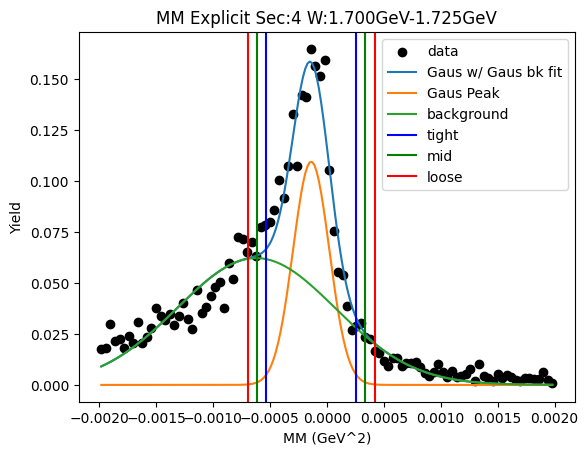

W bin: 13 1.725GeV-1.750GeV
initial Gaus fit:  [ 1.62958678e-01 -1.56174872e-04  2.27405842e-04]
2nd level W dependent
W1_ini_pars: [ 1.62958678e-01 -1.56174872e-04  2.27405842e-04  6.22354513e-02
 -6.19711430e-04  6.93277160e-04]
Gaus1 Peak: [ 0.12107983 -0.00013286  0.00015561]
Gaus2 Peak: [ 0.06213917 -0.00062101  0.00075543]
tight should be -0.0005218935555960052   0.0002561803579838311
[[-0.00052189  0.          0.        ]
 [ 0.00025618  0.          0.        ]]
mid should be -0.000599700946953989   0.0003339877493418147
[[-0.00052189 -0.0005997   0.        ]
 [ 0.00025618  0.00033399  0.        ]]
loose should be -0.0006775083383119726   0.00041179514069979845
[[-0.00052189 -0.0005997  -0.00067751]
 [ 0.00025618  0.00033399  0.0004118 ]]
-5.499700595289154e-08 9.029875764553471e-08
Main Gaus Peak [ 0.12107983 -0.00013286  0.00015561]
Gaus2 [ 0.06213917 -0.00062101  0.00075543]


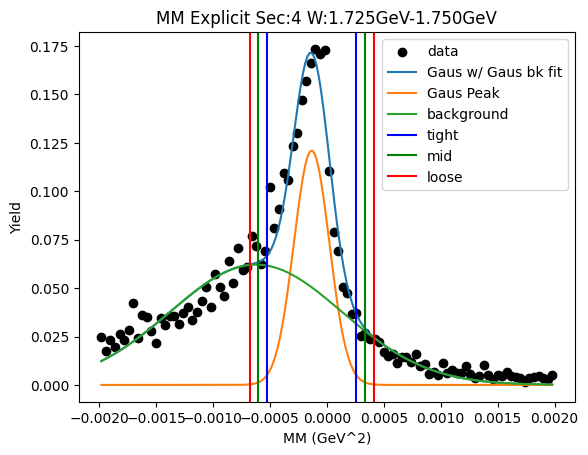

W bin: 14 1.750GeV-1.775GeV
initial Gaus fit:  [ 0.14523017 -0.00018554  0.00025367]
2nd level W dependent
W1_ini_pars: [ 0.14523017 -0.00018554  0.00025367  0.06213917 -0.00062101  0.00075543]
Gaus1 Peak: [ 0.10496178 -0.00018151  0.00020863]
Gaus2 Peak: [ 0.05007296 -0.00070138  0.00084515]
tight should be -0.000703097730965934   0.00034007042634088684
[[-0.0007031   0.          0.        ]
 [ 0.00034007  0.          0.        ]]
mid should be -0.0008074145466966162   0.000444387242071569
[[-0.0007031  -0.00080741  0.        ]
 [ 0.00034007  0.00044439  0.        ]]
loose should be -0.0009117313624272983   0.000548704057802251
[[-0.0007031  -0.00080741 -0.00091173]
 [ 0.00034007  0.00044439  0.0005487 ]]
-9.76367705544373e-08 1.635311825061007e-07
Main Gaus Peak [ 0.10496178 -0.00018151  0.00020863]
Gaus2 [ 0.05007296 -0.00070138  0.00084515]


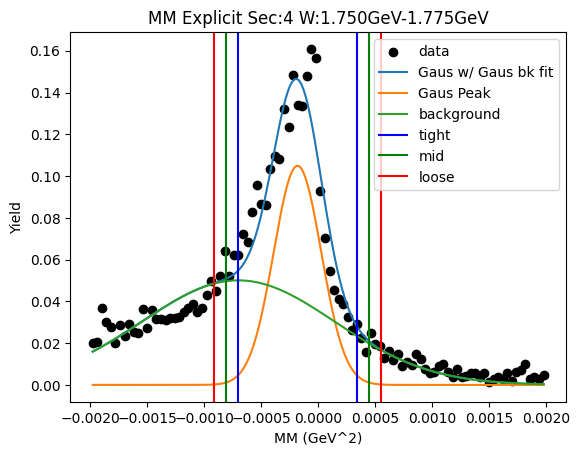

W bin: 15 1.775GeV-1.800GeV
initial Gaus fit:  [ 0.15400924 -0.00016281  0.00025722]
2nd level W dependent
W1_ini_pars: [ 0.15400924 -0.00016281  0.00025722  0.05007296 -0.00070138  0.00084515]
Gaus1 Peak: [ 0.11363269 -0.00014712  0.00019766]
Gaus2 Peak: [ 0.05419846 -0.00069599  0.00085352]
tight should be -0.0006412689361013752   0.00034703097860077736
[[-0.00064127  0.          0.        ]
 [ 0.00034703  0.          0.        ]]
mid should be -0.0007400989275715904   0.00044586097007099257
[[-0.00064127 -0.0007401   0.        ]
 [ 0.00034703  0.00044586  0.        ]]
loose should be -0.0008389289190418057   0.0005446909615412079
[[-0.00064127 -0.0007401  -0.00083893]
 [ 0.00034703  0.00044586  0.00054469]]
-9.556441265950292e-08 1.3885240047656472e-07
Main Gaus Peak [ 0.11363269 -0.00014712  0.00019766]
Gaus2 [ 0.05419846 -0.00069599  0.00085352]


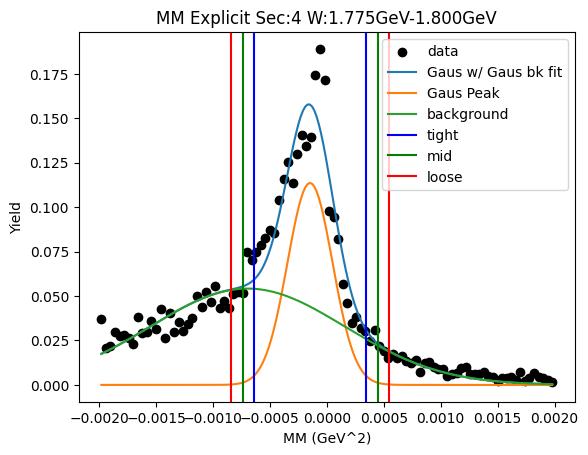

W bin: 16 1.800GeV-1.825GeV
initial Gaus fit:  [ 0.17488222 -0.0001794   0.00025247]
2nd level W dependent
W1_ini_pars: [ 0.17488222 -0.0001794   0.00025247  0.05419846 -0.00069599  0.00085352]
Gaus1 Peak: [ 0.12733098 -0.0001559   0.00018144]
Gaus2 Peak: [ 0.06650177 -0.00065625  0.00077521]
tight should be -0.0006095028130859969   0.0002977119294289024
[[-0.0006095   0.          0.        ]
 [ 0.00029771  0.          0.        ]]
mid should be -0.0007002242873374868   0.00038843340368039227
[[-0.0006095  -0.00070022  0.        ]
 [ 0.00029771  0.00038843  0.        ]]
loose should be -0.0007909457615889767   0.0004791548779318822
[[-0.0006095  -0.00070022 -0.00079095]
 [ 0.00029771  0.00038843  0.00047915]]
-7.446124190144703e-08 1.2306801946728295e-07
Main Gaus Peak [ 0.12733098 -0.0001559   0.00018144]
Gaus2 [ 0.06650177 -0.00065625  0.00077521]


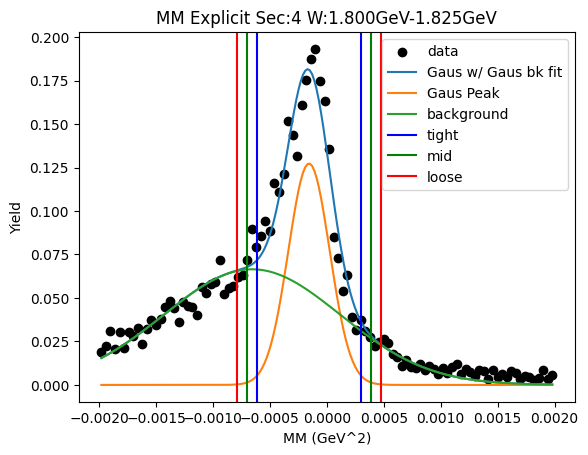

W bin: 17 1.825GeV-1.850GeV
initial Gaus fit:  [ 1.86354295e-01 -1.70816217e-04  2.54737813e-04]
2nd level W dependent
W1_ini_pars: [ 1.86354295e-01 -1.70816217e-04  2.54737813e-04  6.65017708e-02
 -6.56254113e-04  7.75209064e-04]
Gaus1 Peak: [ 0.13660419 -0.00015663  0.0002029 ]
Gaus2 Peak: [ 0.06594297 -0.0007004   0.00080794]
tight should be -0.0006638790874723114   0.00035062236000480004
[[-0.00066388  0.          0.        ]
 [ 0.00035062  0.          0.        ]]
mid should be -0.0007653292322200225   0.00045207250475251114
[[-0.00066388 -0.00076533  0.        ]
 [ 0.00035062  0.00045207  0.        ]]
loose should be -0.0008667793769677338   0.0005535226495002224
[[-0.00066388 -0.00076533 -0.00086678]
 [ 0.00035062  0.00045207  0.00055352]]
-9.897313810606482e-08 1.4803802675789219e-07
Main Gaus Peak [ 0.13660419 -0.00015663  0.0002029 ]
Gaus2 [ 0.06594297 -0.0007004   0.00080794]


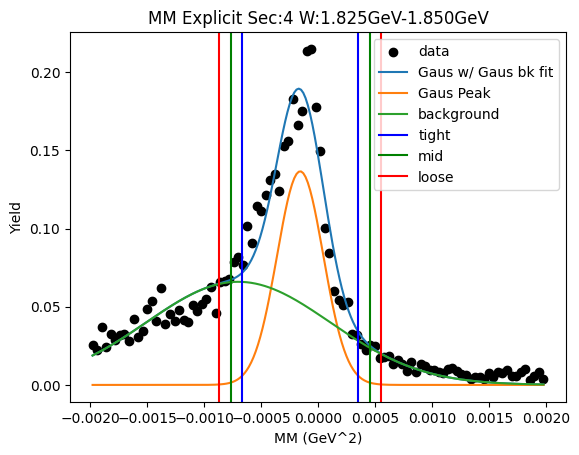

W bin: 18 1.850GeV-1.875GeV
initial Gaus fit:  [ 1.83258778e-01 -1.68133969e-04  2.45851954e-04]
2nd level W dependent
W1_ini_pars: [ 1.83258778e-01 -1.68133969e-04  2.45851954e-04  6.59429662e-02
 -7.00404557e-04  8.07940606e-04]
Gaus1 Peak: [ 0.12959869 -0.00015207  0.00017026]
Gaus2 Peak: [ 0.07342696 -0.0006456   0.00082831]
tight should be -0.0005777222016981579   0.0002735913973833176
[[-0.00057772  0.          0.        ]
 [ 0.00027359  0.          0.        ]]
mid should be -0.0006628535616063054   0.0003587227572914651
[[-0.00057772 -0.00066285  0.        ]
 [ 0.00027359  0.00035872  0.        ]]
loose should be -0.000747984921514453   0.0004438541171996127
[[-0.00057772 -0.00066285 -0.00074798]
 [ 0.00027359  0.00035872  0.00044385]]
-6.384429474442869e-08 1.1009206781102454e-07
Main Gaus Peak [ 0.12959869 -0.00015207  0.00017026]
Gaus2 [ 0.07342696 -0.0006456   0.00082831]


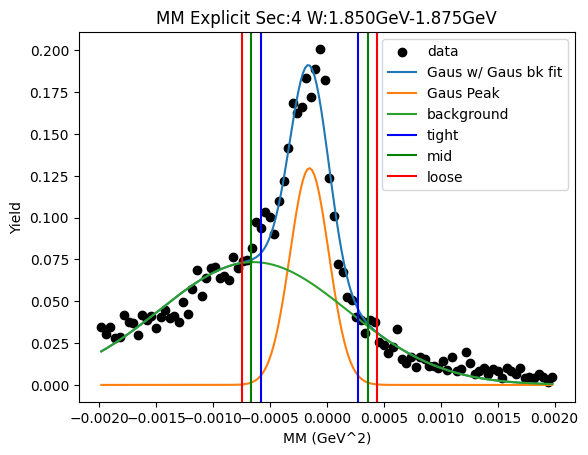

W bin: 19 1.875GeV-1.900GeV
initial Gaus fit:  [ 1.90371577e-01 -1.75084036e-04  2.63348040e-04]
2nd level W dependent
W1_ini_pars: [ 1.90371577e-01 -1.75084036e-04  2.63348040e-04  7.34269595e-02
 -6.45598942e-04  8.28313443e-04]
Gaus1 Peak: [ 0.13542427 -0.00015234  0.00018595]
Gaus2 Peak: [ 0.07586259 -0.00064412  0.00079218]
tight should be -0.0006172163949528799   0.00031253636510865965
[[-0.00061722  0.          0.        ]
 [ 0.00031254  0.          0.        ]]
mid should be -0.000710191670959034   0.0004055116411148137
[[-0.00061722 -0.00071019  0.        ]
 [ 0.00031254  0.00040551  0.        ]]
loose should be -0.0008031669469651879   0.0004984869171209676
[[-0.00061722 -0.00071019 -0.00080317]
 [ 0.00031254  0.00040551  0.00049849]]
-8.052534323457739e-08 1.2694030352751485e-07
Main Gaus Peak [ 0.13542427 -0.00015234  0.00018595]
Gaus2 [ 0.07586259 -0.00064412  0.00079218]


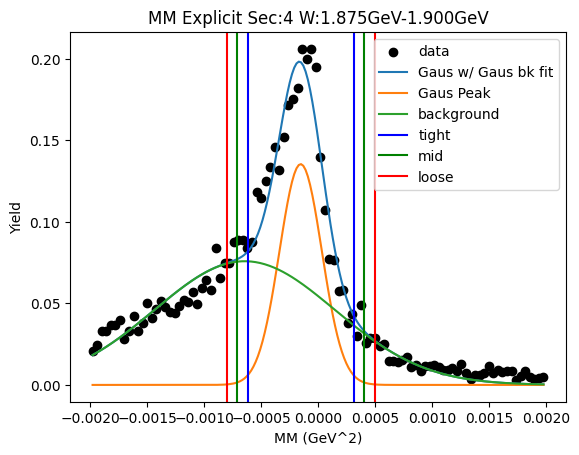

W bin: 20 1.900GeV-1.925GeV
initial Gaus fit:  [ 2.12152840e-01 -1.73201754e-04  2.49337091e-04]
2nd level W dependent
W1_ini_pars: [ 2.12152840e-01 -1.73201754e-04  2.49337091e-04  7.58625886e-02
 -6.44122659e-04  7.92182963e-04]
Gaus1 Peak: [ 0.15232653 -0.00015538  0.0001921 ]
Gaus2 Peak: [ 0.07968278 -0.00070399  0.00081638]
tight should be -0.0006356159281451711   0.00032486419163025096
[[-0.00063562  0.          0.        ]
 [ 0.00032486  0.          0.        ]]
mid should be -0.0007316639401227133   0.0004209122036077931
[[-0.00063562 -0.00073166  0.        ]
 [ 0.00032486  0.00042091  0.        ]]
loose should be -0.0008277119521002556   0.0005169602155853354
[[-0.00063562 -0.00073166 -0.00082771]
 [ 0.00032486  0.00042091  0.00051696]]
-8.656098682129751e-08 1.348443076948167e-07
Main Gaus Peak [ 0.15232653 -0.00015538  0.0001921 ]
Gaus2 [ 0.07968278 -0.00070399  0.00081638]


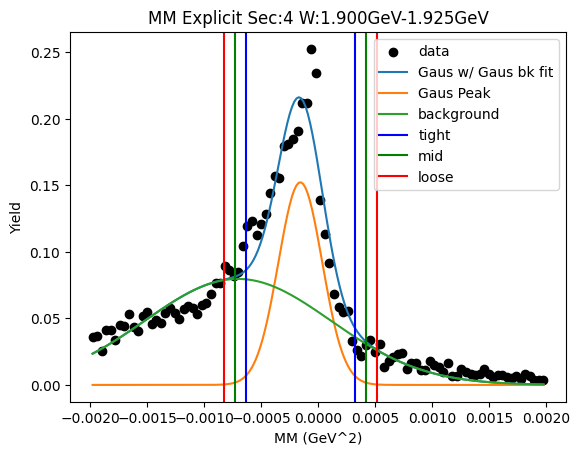

W bin: 21 1.925GeV-1.950GeV
initial Gaus fit:  [ 2.22928675e-01 -1.57777300e-04  2.46442327e-04]
2nd level W dependent
W1_ini_pars: [ 2.22928675e-01 -1.57777300e-04  2.46442327e-04  7.96827824e-02
 -7.03988888e-04  8.16382636e-04]
Gaus1 Peak: [ 1.59377594e-01 -1.23246365e-04  1.56695323e-04]
Gaus2 Peak: [ 0.09581156 -0.00060439  0.0007405 ]
tight should be -0.0005149846716932054   0.0002684919424332825
[[-0.00051498  0.          0.        ]
 [ 0.00026849  0.          0.        ]]
mid should be -0.0005933323331058541   0.00034683960384593126
[[-0.00051498 -0.00059333  0.        ]
 [ 0.00026849  0.00034684  0.        ]]
loose should be -0.0006716799945185029   0.00042518726525858
[[-0.00051498 -0.00059333 -0.00067168]
 [ 0.00026849  0.00034684  0.00042519]]
-5.847060619147125e-08 8.884993898047407e-08
Main Gaus Peak [ 1.59377594e-01 -1.23246365e-04  1.56695323e-04]
Gaus2 [ 0.09581156 -0.00060439  0.0007405 ]


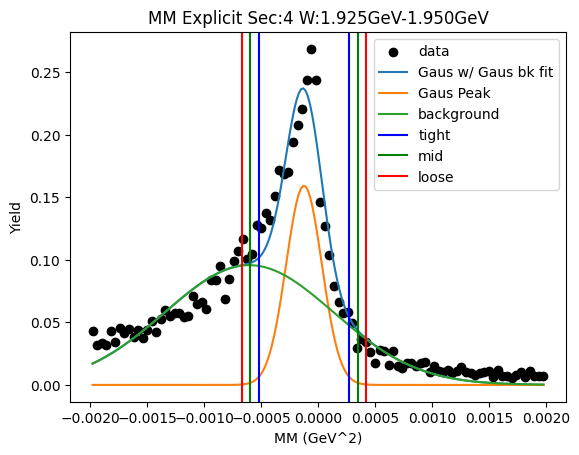

W bin: 22 1.950GeV-1.975GeV
initial Gaus fit:  [ 2.33484707e-01 -1.74204528e-04  2.45068760e-04]
2nd level W dependent
W1_ini_pars: [ 2.33484707e-01 -1.74204528e-04  2.45068760e-04  9.58115600e-02
 -6.04391615e-04  7.40504531e-04]
Gaus1 Peak: [ 1.60091867e-01 -1.56256860e-04  1.74129336e-04]
Gaus2 Peak: [ 0.09727403 -0.00060206  0.00074143]
tight should be -0.0005915802005633116   0.0002790664807403192
[[-0.00059158  0.          0.        ]
 [ 0.00027907  0.          0.        ]]
mid should be -0.0006786448686936747   0.0003661311488706823
[[-0.00059158 -0.00067864  0.        ]
 [ 0.00027907  0.00036613  0.        ]]
loose should be -0.0007657095368240377   0.00045319581700104536
[[-0.00059158 -0.00067864 -0.00076571]
 [ 0.00027907  0.00036613  0.0004532 ]]
-6.654687097040218e-08 1.1537928350920406e-07
Main Gaus Peak [ 1.60091867e-01 -1.56256860e-04  1.74129336e-04]
Gaus2 [ 0.09727403 -0.00060206  0.00074143]


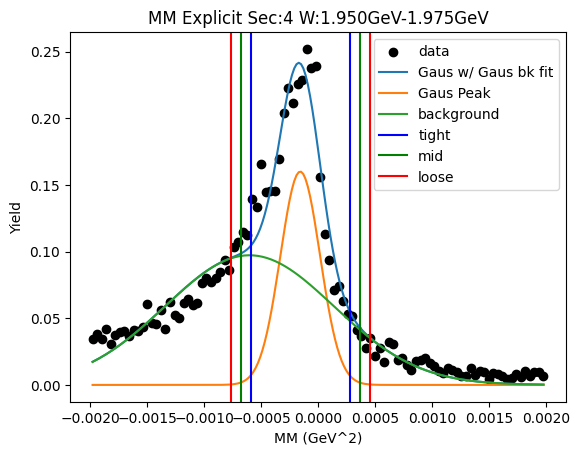

W bin: 23 1.975GeV-2.000GeV
initial Gaus fit:  [ 2.28276240e-01 -1.75121073e-04  2.53430580e-04]
2nd level W dependent
W1_ini_pars: [ 2.28276240e-01 -1.75121073e-04  2.53430580e-04  9.72740275e-02
 -6.02059867e-04  7.41434877e-04]
Gaus1 Peak: [ 1.55000763e-01 -1.45018466e-04  1.70891482e-04]
Gaus2 Peak: [ 0.10220023 -0.00062798  0.000738  ]
tight should be -0.0005722471707707786   0.00028221023798458253
[[-0.00057225  0.          0.        ]
 [ 0.00028221  0.          0.        ]]
mid should be -0.0006576929116463147   0.0003676559788601186
[[-0.00057225 -0.00065769  0.        ]
 [ 0.00028221  0.00036766  0.        ]]
loose should be -0.0007431386525218507   0.0004531017197356547
[[-0.00057225 -0.00065769 -0.00074314]
 [ 0.00028221  0.00036766  0.0004531 ]]
-6.658134001022505e-08 1.0864205120023725e-07
Main Gaus Peak [ 1.55000763e-01 -1.45018466e-04  1.70891482e-04]
Gaus2 [ 0.10220023 -0.00062798  0.000738  ]


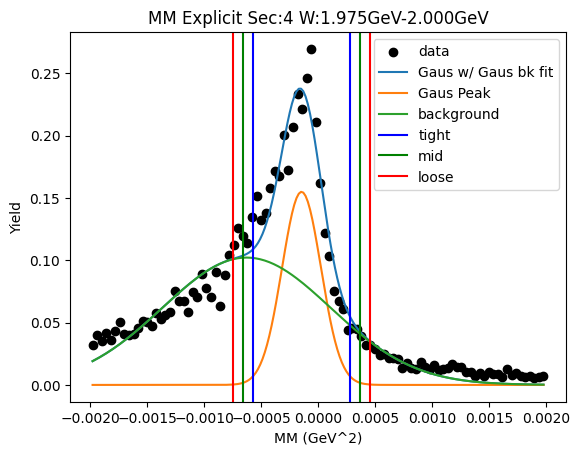

W bin: 24 2.000GeV-2.025GeV
initial Gaus fit:  [ 2.32487427e-01 -1.70238093e-04  2.59870322e-04]
2nd level W dependent
W1_ini_pars: [ 2.32487427e-01 -1.70238093e-04  2.59870322e-04  1.02200229e-01
 -6.27978155e-04  7.38002442e-04]
Gaus1 Peak: [ 1.58231470e-01 -1.34512686e-04  1.61672522e-04]
Gaus2 Peak: [ 0.10821562 -0.00060903  0.00074709]
tight should be -0.00053869399115935   0.0002696686188222024
[[-0.00053869  0.          0.        ]
 [ 0.00026967  0.          0.        ]]
mid should be -0.0006195302521575052   0.0003505048798203576
[[-0.00053869 -0.00061953  0.        ]
 [ 0.00026967  0.0003505   0.        ]]
loose should be -0.0007003665131556606   0.0004313411408185129
[[-0.00053869 -0.00061953 -0.00070037]
 [ 0.00026967  0.0003505   0.00043134]]
-6.032035036565725e-08 9.650767584622772e-08
Main Gaus Peak [ 1.58231470e-01 -1.34512686e-04  1.61672522e-04]
Gaus2 [ 0.10821562 -0.00060903  0.00074709]


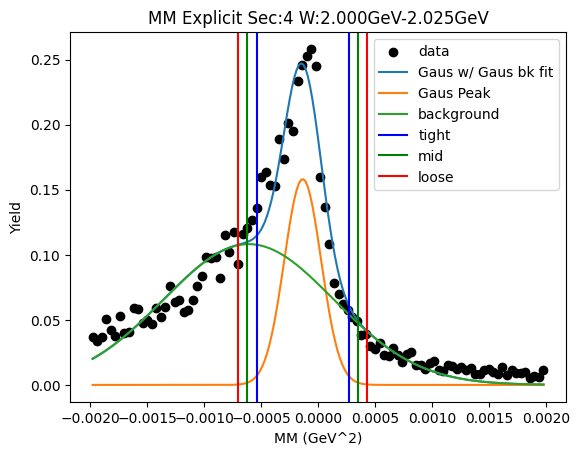

W bin: 25 2.025GeV-2.050GeV
initial Gaus fit:  [ 2.48769030e-01 -1.65743680e-04  2.48120159e-04]
2nd level W dependent
W1_ini_pars: [ 2.48769030e-01 -1.65743680e-04  2.48120159e-04  1.08215622e-01
 -6.09033550e-04  7.47089719e-04]
Gaus1 Peak: [ 1.76156834e-01 -1.29868642e-04  1.59551606e-04]
Gaus2 Peak: [ 0.10772162 -0.00061875  0.00074719]
tight should be -0.0005287476575193768   0.0002690103738557934
[[-0.00052875  0.          0.        ]
 [ 0.00026901  0.          0.        ]]
mid should be -0.0006085234606568938   0.00034878617699331043
[[-0.00052875 -0.00060852  0.        ]
 [ 0.00026901  0.00034879  0.        ]]
loose should be -0.0006882992637944109   0.00042856198013082746
[[-0.00052875 -0.00060852 -0.0006883 ]
 [ 0.00026901  0.00034879  0.00042856]]
-5.9504281063596254e-08 9.323600932606465e-08
Main Gaus Peak [ 1.76156834e-01 -1.29868642e-04  1.59551606e-04]
Gaus2 [ 0.10772162 -0.00061875  0.00074719]


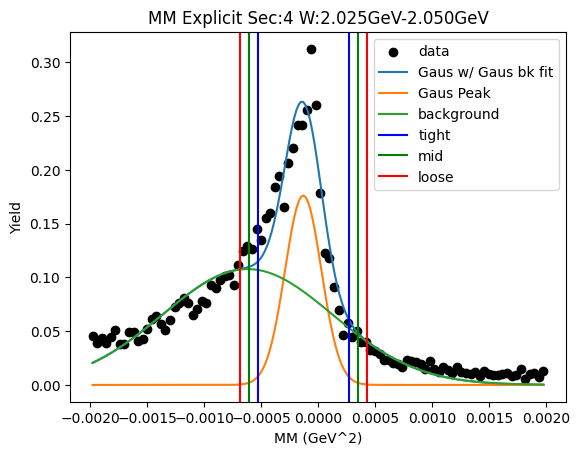

W bin: 26 2.050GeV-2.075GeV
initial Gaus fit:  [ 2.53417255e-01 -1.69828917e-04  2.47064429e-04]
2nd level W dependent
W1_ini_pars: [ 2.53417255e-01 -1.69828917e-04  2.47064429e-04  1.07721619e-01
 -6.18748907e-04  7.47187927e-04]
Gaus1 Peak: [ 1.78504423e-01 -1.46613036e-04  1.69305896e-04]
Gaus2 Peak: [ 0.10447458 -0.00063696  0.00079138]
tight should be -0.0005698777752570672   0.0002766517034289678
[[-0.00056988  0.          0.        ]
 [ 0.00027665  0.          0.        ]]
mid should be -0.0006545307231256707   0.00036130465129757133
[[-0.00056988 -0.00065453  0.        ]
 [ 0.00027665  0.0003613   0.        ]]
loose should be -0.0007391836709942742   0.00044595759916617476
[[-0.00056988 -0.00065453 -0.00073918]
 [ 0.00027665  0.0003613   0.00044596]]
-6.44980766941996e-08 1.0748884129406845e-07
Main Gaus Peak [ 1.78504423e-01 -1.46613036e-04  1.69305896e-04]
Gaus2 [ 0.10447458 -0.00063696  0.00079138]


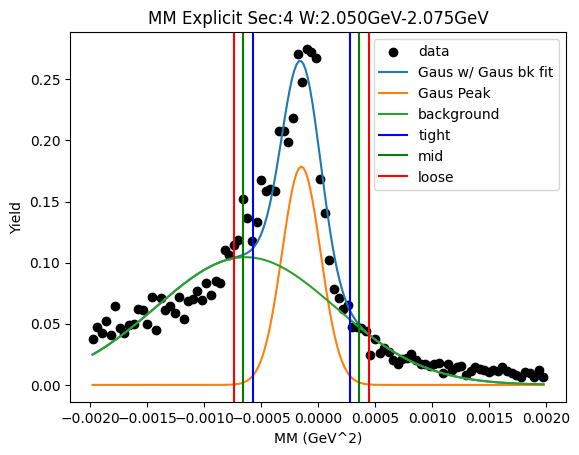

W bin: 27 2.075GeV-2.100GeV
initial Gaus fit:  [ 2.66866592e-01 -1.69098497e-04  2.37192126e-04]
2nd level W dependent
W1_ini_pars: [ 2.66866592e-01 -1.69098497e-04  2.37192126e-04  1.04474582e-01
 -6.36963934e-04  7.91383181e-04]
Gaus1 Peak: [ 1.92454701e-01 -1.45509790e-04  1.62767070e-04]
Gaus2 Peak: [ 0.1070256  -0.00064459  0.00077237]
tight should be -0.0005524274649100815   0.0002614078850321723
[[-0.00055243  0.          0.        ]
 [ 0.00026141  0.          0.        ]]
mid should be -0.000633810999904307   0.0003427914200263976
[[-0.00055243 -0.00063381  0.        ]
 [ 0.00026141  0.00034279  0.        ]]
loose should be -0.0007151945348985324   0.00042417495502062306
[[-0.00055243 -0.00063381 -0.00071519]
 [ 0.00026141  0.00034279  0.00042417]]
-5.830625824979698e-08 1.0065245618595439e-07
Main Gaus Peak [ 1.92454701e-01 -1.45509790e-04  1.62767070e-04]
Gaus2 [ 0.1070256  -0.00064459  0.00077237]


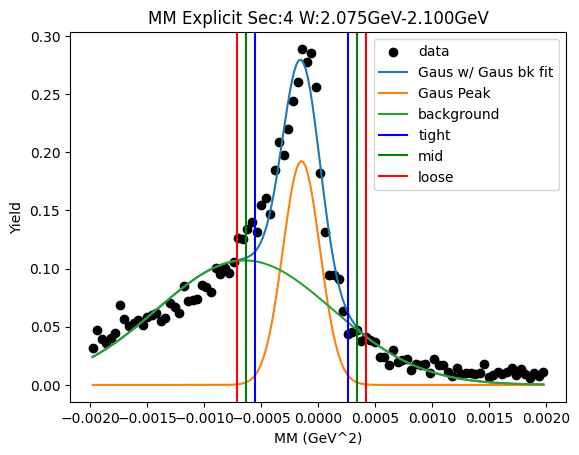

W bin: 28 2.100GeV-2.125GeV
initial Gaus fit:  [ 2.65714422e-01 -1.59253755e-04  2.51920685e-04]
2nd level W dependent
W1_ini_pars: [ 2.65714422e-01 -1.59253755e-04  2.51920685e-04  1.07025601e-01
 -6.44592615e-04  7.72370624e-04]
Gaus1 Peak: [ 1.86796273e-01 -1.30926321e-04  1.69681475e-04]
Gaus2 Peak: [ 0.11220025 -0.00062093  0.00076567]
tight should be -0.0005551300071754314   0.0002932773653550717
[[-0.00055513  0.          0.        ]
 [ 0.00029328  0.          0.        ]]
mid should be -0.0006399707444284817   0.00037811810260812207
[[-0.00055513 -0.00063997  0.        ]
 [ 0.00029328  0.00037812  0.        ]]
loose should be -0.0007248114816815319   0.00046295883986117233
[[-0.00055513 -0.00063997 -0.00072481]
 [ 0.00029328  0.00037812  0.00046296]]
-6.923370686461803e-08 1.0351710987876882e-07
Main Gaus Peak [ 1.86796273e-01 -1.30926321e-04  1.69681475e-04]
Gaus2 [ 0.11220025 -0.00062093  0.00076567]


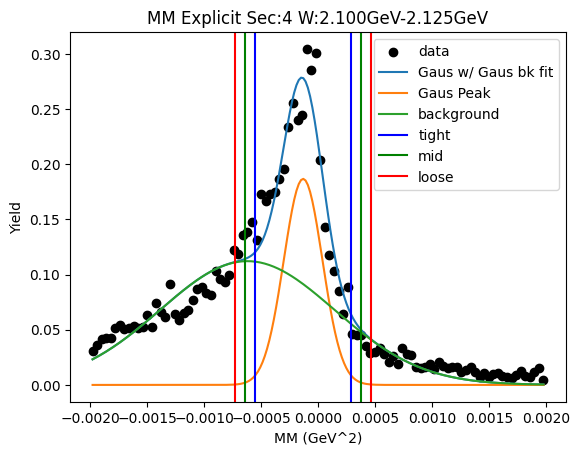

initial bw fit:  [ 6.86854151e+00 -3.72999013e-04  5.48314419e-04]
input parameters for r2 [ 6.86854151e+00 -3.72999013e-04  5.48314419e-04  5.00000000e+00
 -8.08201518e-04  5.76255640e-04]
r2 parameters [ 6.18010673e+00 -1.51958253e-04  1.80228598e-04  3.98896341e+00
 -7.05287841e-04  7.63496867e-04]
-7.435573158248134e-08 1.2053835318945382e-07
Main Gaus Peak [ 6.18010673e+00 -1.51958253e-04  1.80228598e-04]
Gaus2 [ 3.98896341e+00 -7.05287841e-04  7.63496867e-04]


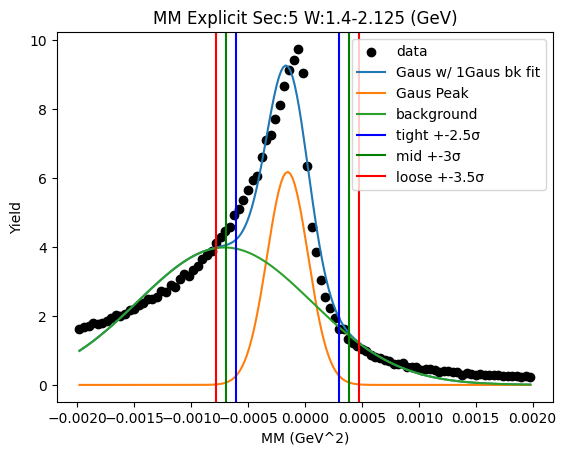

W bin: 0 1.400GeV-1.425GeV
initial Gaus fit:  [ 0.04396087 -0.00018207  0.00023795]
2nd level W dependent
W1_ini_pars: [ 0.04396087 -0.00018207  0.00023795  0.00947786 -0.00060779  0.00061885]
Gaus1 Peak: [ 0.03067297 -0.00014601  0.00016538]
Gaus2 Peak: [ 0.02101484 -0.00073716  0.00069916]
tight should be -0.0005594607128370409   0.0002674419637620078
[[-0.00055946  0.          0.        ]
 [ 0.00026744  0.          0.        ]]
mid should be -0.0006421509804969458   0.0003501322314219126
[[-0.00055946 -0.00064215  0.        ]
 [ 0.00026744  0.00035013  0.        ]]
loose should be -0.0007248412481568507   0.00043282249908181756
[[-0.00055946 -0.00064215 -0.00072484]
 [ 0.00026744  0.00035013  0.00043282]]
-6.07334269351637e-08 1.033709018408373e-07
Main Gaus Peak [ 0.03067297 -0.00014601  0.00016538]
Gaus2 [ 0.02101484 -0.00073716  0.00069916]


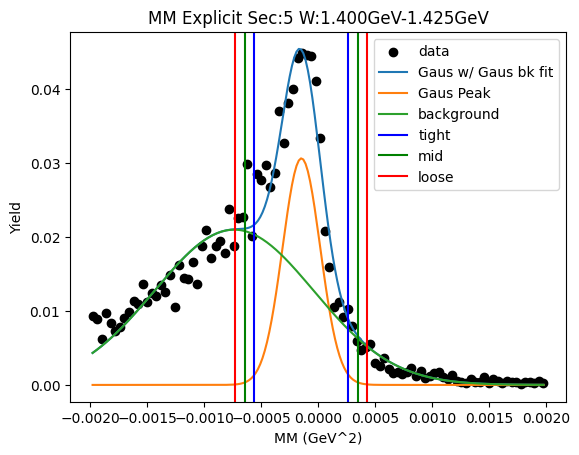

W bin: 1 1.425GeV-1.450GeV
initial Gaus fit:  [ 0.0693347  -0.00019176  0.00024667]
2nd level W dependent
W1_ini_pars: [ 0.0693347  -0.00019176  0.00024667  0.02101484 -0.00073716  0.00069916]
Gaus1 Peak: [ 0.05025779 -0.00015992  0.00019778]
Gaus2 Peak: [ 0.02990655 -0.00080718  0.00069361]
tight should be -0.0006543614404250688   0.00033452500675839247
[[-0.00065436  0.          0.        ]
 [ 0.00033453  0.          0.        ]]
mid should be -0.0007532500851434149   0.00043341365147673856
[[-0.00065436 -0.00075325  0.        ]
 [ 0.00033453  0.00043341  0.        ]]
loose should be -0.0008521387298617611   0.0005323022961950847
[[-0.00065436 -0.00075325 -0.00085214]
 [ 0.00033453  0.00043341  0.0005323 ]]
-9.177373257562087e-08 1.4292140472592997e-07
Main Gaus Peak [ 0.05025779 -0.00015992  0.00019778]
Gaus2 [ 0.02990655 -0.00080718  0.00069361]


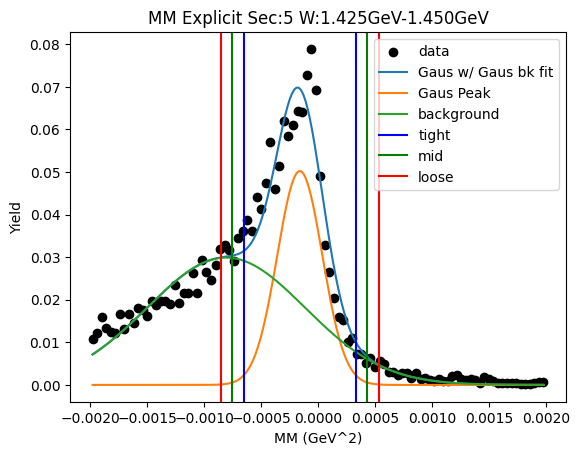

W bin: 2 1.450GeV-1.475GeV
initial Gaus fit:  [ 0.09994801 -0.00018237  0.00024159]
2nd level W dependent
W1_ini_pars: [ 0.09994801 -0.00018237  0.00024159  0.02990655 -0.00080718  0.00069361]
Gaus1 Peak: [ 0.07187251 -0.00014898  0.00017838]
Gaus2 Peak: [ 0.04357955 -0.0007614   0.00071439]
tight should be -0.0005949285379774255   0.00029697363989699614
[[-0.00059493  0.          0.        ]
 [ 0.00029697  0.          0.        ]]
mid should be -0.0006841187557648677   0.00038616385768443825
[[-0.00059493 -0.00068412  0.        ]
 [ 0.00029697  0.00038616  0.        ]]
loose should be -0.0007733089735523098   0.00047535407547188036
[[-0.00059493 -0.00068412 -0.00077331]
 [ 0.00029697  0.00038616  0.00047535]]
-7.326445906512661e-08 1.1765301971018615e-07
Main Gaus Peak [ 0.07187251 -0.00014898  0.00017838]
Gaus2 [ 0.04357955 -0.0007614   0.00071439]


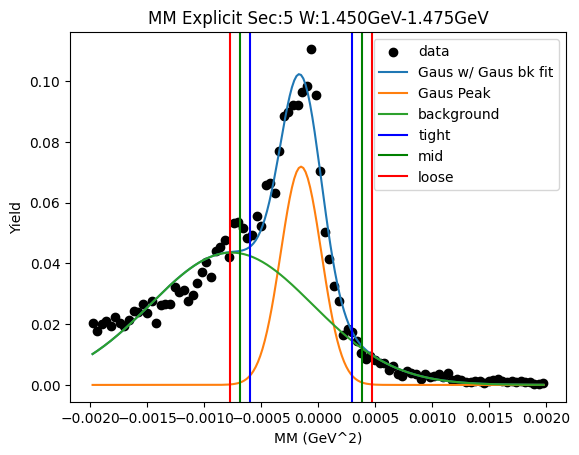

W bin: 3 1.475GeV-1.500GeV
initial Gaus fit:  [ 0.12902958 -0.00018096  0.00024531]
2nd level W dependent
W1_ini_pars: [ 0.12902958 -0.00018096  0.00024531  0.04357955 -0.0007614   0.00071439]
Gaus1 Peak: [ 0.08937362 -0.00013969  0.0001701 ]
Gaus2 Peak: [ 0.06196816 -0.00071566  0.00068452]
tight should be -0.0005649387326507751   0.0002855490031249279
[[-0.00056494  0.          0.        ]
 [ 0.00028555  0.          0.        ]]
mid should be -0.0006499875062283455   0.0003705977767024983
[[-0.00056494 -0.00064999  0.        ]
 [ 0.00028555  0.0003706   0.        ]]
loose should be -0.0007350362798059157   0.00045564655028006856
[[-0.00056494 -0.00064999 -0.00073504]
 [ 0.00028555  0.0003706   0.00045565]]
-6.728487140345434e-08 1.0631418188571738e-07
Main Gaus Peak [ 0.08937362 -0.00013969  0.0001701 ]
Gaus2 [ 0.06196816 -0.00071566  0.00068452]


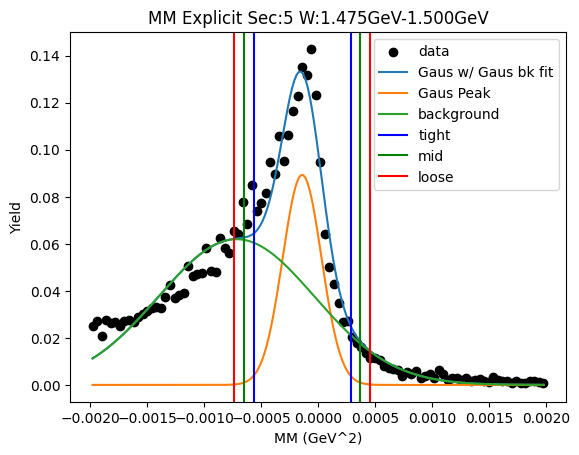

W bin: 4 1.500GeV-1.525GeV
initial Gaus fit:  [ 0.15623766 -0.00018878  0.00025394]
2nd level W dependent
W1_ini_pars: [ 0.15623766 -0.00018878  0.00025394  0.06196816 -0.00071566  0.00068452]
Gaus1 Peak: [ 0.1120558  -0.00016237  0.00019747]
Gaus2 Peak: [ 0.06476039 -0.00077551  0.00074667]
tight should be -0.0006560531663465558   0.00033130882976096533
[[-0.00065605  0.          0.        ]
 [ 0.00033131  0.          0.        ]]
mid should be -0.0007547893659573079   0.0004300450293717175
[[-0.00065605 -0.00075479  0.        ]
 [ 0.00033131  0.00043005  0.        ]]
loose should be -0.0008535255655680601   0.0005287812289824697
[[-0.00065605 -0.00075479 -0.00085353]
 [ 0.00033131  0.00043005  0.00052878]]
-9.062132432678763e-08 1.4335076639899526e-07
Main Gaus Peak [ 0.1120558  -0.00016237  0.00019747]
Gaus2 [ 0.06476039 -0.00077551  0.00074667]


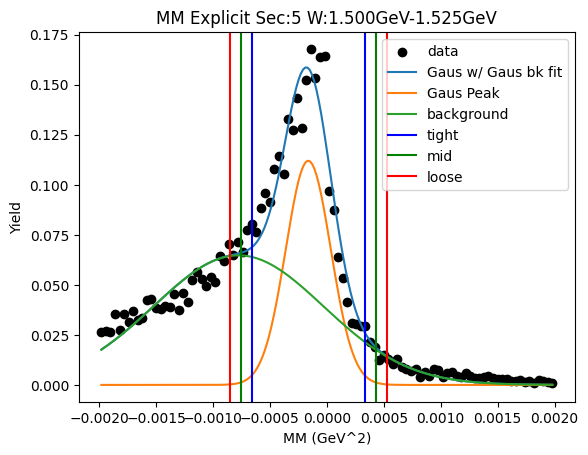

W bin: 5 1.525GeV-1.550GeV
initial Gaus fit:  [ 1.80796828e-01 -1.72017212e-04  2.38474447e-04]
2nd level W dependent
W1_ini_pars: [ 1.80796828e-01 -1.72017212e-04  2.38474447e-04  6.47603908e-02
 -7.75508672e-04  7.46669764e-04]
Gaus1 Peak: [ 0.12942305 -0.00014055  0.00016879]
Gaus2 Peak: [ 0.08000062 -0.0007358   0.00073285]
tight should be -0.0005625116810748088   0.0002814173293448506
[[-0.00056251  0.          0.        ]
 [ 0.00028142  0.          0.        ]]
mid should be -0.0006469045821167747   0.0003658102303868165
[[-0.00056251 -0.0006469   0.        ]
 [ 0.00028142  0.00036581  0.        ]]
loose should be -0.0007312974831587406   0.00045020313142878245
[[-0.00056251 -0.0006469  -0.0007313 ]
 [ 0.00028142  0.00036581  0.0004502 ]]
-6.57124323117273e-08 1.0521944959897e-07
Main Gaus Peak [ 0.12942305 -0.00014055  0.00016879]
Gaus2 [ 0.08000062 -0.0007358   0.00073285]


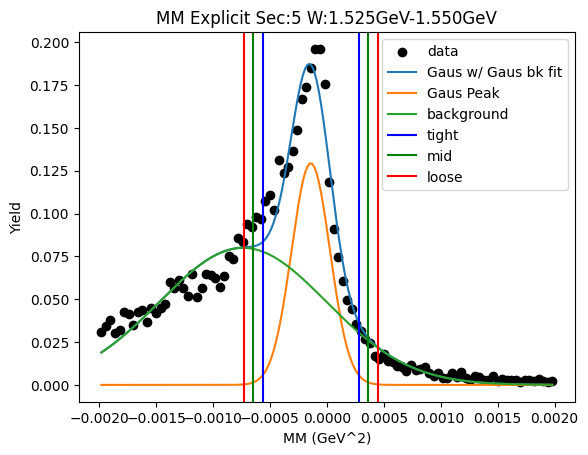

W bin: 6 1.550GeV-1.575GeV
initial Gaus fit:  [ 1.78302993e-01 -1.70213085e-04  2.46238214e-04]
2nd level W dependent
W1_ini_pars: [ 1.78302993e-01 -1.70213085e-04  2.46238214e-04  8.00006232e-02
 -7.35797611e-04  7.32853811e-04]
Gaus1 Peak: [ 0.12075592 -0.00012888  0.00015355]
Gaus2 Peak: [ 0.08903419 -0.00066752  0.00071732]
tight should be -0.000512748537628776   0.0002549801337168921
[[-0.00051275  0.          0.        ]
 [ 0.00025498  0.          0.        ]]
mid should be -0.0005895214047633427   0.00033175300085145894
[[-0.00051275 -0.00058952  0.        ]
 [ 0.00025498  0.00033175  0.        ]]
loose should be -0.0006662942718979096   0.0004085258679860258
[[-0.00051275 -0.00058952 -0.00066629]
 [ 0.00025498  0.00033175  0.00040853]]
-5.411774002292215e-08 8.734001505056219e-08
Main Gaus Peak [ 0.12075592 -0.00012888  0.00015355]
Gaus2 [ 0.08903419 -0.00066752  0.00071732]


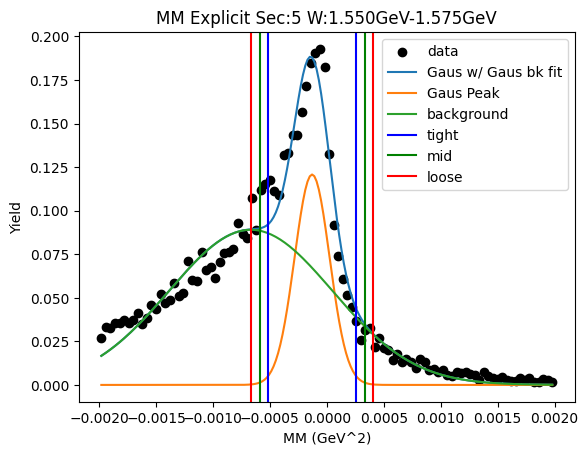

W bin: 7 1.575GeV-1.600GeV
initial Gaus fit:  [ 1.91870654e-01 -1.78598353e-04  2.55509738e-04]
2nd level W dependent
W1_ini_pars: [ 1.91870654e-01 -1.78598353e-04  2.55509738e-04  8.90341937e-02
 -6.67521032e-04  7.17322337e-04]
Gaus1 Peak: [ 0.13326724 -0.00014299  0.00017084]
Gaus2 Peak: [ 0.08748058 -0.00069082  0.00074836]
tight should be -0.0005700812359826242   0.00028410434621006157
[[-0.00057008  0.          0.        ]
 [ 0.0002841   0.          0.        ]]
mid should be -0.0006554997942018928   0.00036952290442933015
[[-0.00057008 -0.0006555   0.        ]
 [ 0.0002841   0.00036952  0.        ]]
loose should be -0.0007409183524211614   0.0004549414626485987
[[-0.00057008 -0.0006555  -0.00074092]
 [ 0.0002841   0.00036952  0.00045494]]
-6.71102656881058e-08 1.0800165643010002e-07
Main Gaus Peak [ 0.13326724 -0.00014299  0.00017084]
Gaus2 [ 0.08748058 -0.00069082  0.00074836]


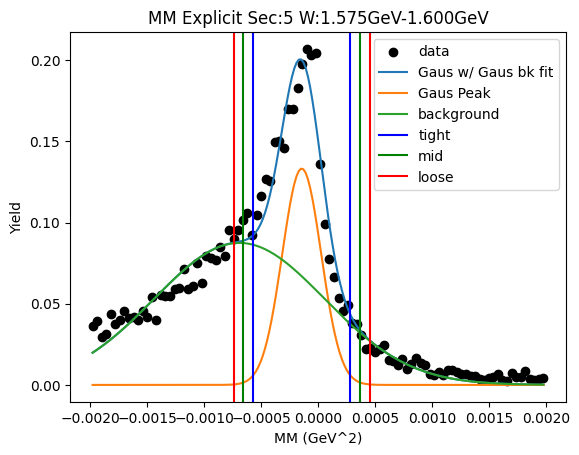

W bin: 8 1.600GeV-1.625GeV
initial Gaus fit:  [ 2.15669059e-01 -1.81912179e-04  2.57209849e-04]
2nd level W dependent
W1_ini_pars: [ 2.15669059e-01 -1.81912179e-04  2.57209849e-04  8.74805809e-02
 -6.90823115e-04  7.48355113e-04]
Gaus1 Peak: [ 0.15166098 -0.00016061  0.00020278]
Gaus2 Peak: [ 0.08998337 -0.00077819  0.00078567]
tight should be -0.0006675525369564163   0.0003463363683782184
[[-0.00066755  0.          0.        ]
 [ 0.00034634  0.          0.        ]]
mid should be -0.0007689414274898797   0.00044772525891168186
[[-0.00066755 -0.00076894  0.        ]
 [ 0.00034634  0.00044773  0.        ]]
loose should be -0.0008703303180233432   0.0005491141494451453
[[-0.00066755 -0.00076894 -0.00087033]
 [ 0.00034634  0.00044773  0.00054911]]
-9.756152874426534e-08 1.4915144222229395e-07
Main Gaus Peak [ 0.15166098 -0.00016061  0.00020278]
Gaus2 [ 0.08998337 -0.00077819  0.00078567]


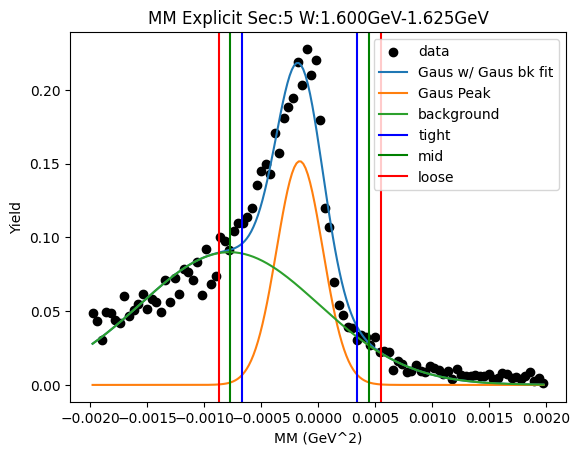

W bin: 9 1.625GeV-1.650GeV
initial Gaus fit:  [ 2.48086735e-01 -1.85054101e-04  2.53069596e-04]
2nd level W dependent
W1_ini_pars: [ 2.48086735e-01 -1.85054101e-04  2.53069596e-04  8.99833684e-02
 -7.78188443e-04  7.85670742e-04]
Gaus1 Peak: [ 1.72002295e-01 -1.53525238e-04  1.82970986e-04]
Gaus2 Peak: [ 0.11296509 -0.00075301  0.00075192]
tight should be -0.0006109527023061464   0.0003039022259249957
[[-0.00061095  0.          0.        ]
 [ 0.0003039   0.          0.        ]]
mid should be -0.0007024381951292605   0.0003953877187481099
[[-0.00061095 -0.00070244  0.        ]
 [ 0.0003039   0.00039539  0.        ]]
loose should be -0.0007939236879523747   0.0004868732115712241
[[-0.00061095 -0.00070244 -0.00079392]
 [ 0.0003039   0.00039539  0.00048687]]
-7.686514600358408e-08 1.2400514352652986e-07
Main Gaus Peak [ 1.72002295e-01 -1.53525238e-04  1.82970986e-04]
Gaus2 [ 0.11296509 -0.00075301  0.00075192]


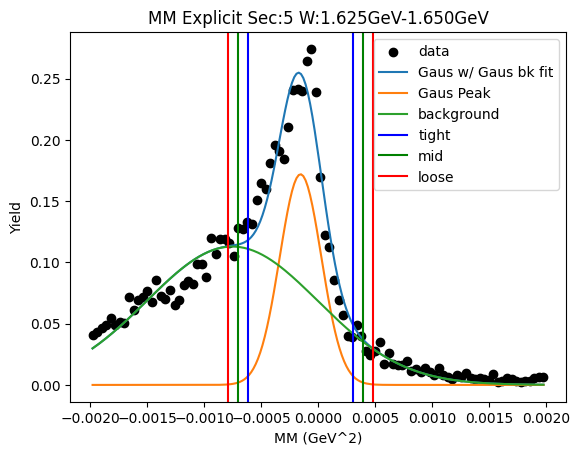

W bin: 10 1.650GeV-1.675GeV
initial Gaus fit:  [ 2.96971589e-01 -1.82789718e-04  2.48983396e-04]
2nd level W dependent
W1_ini_pars: [ 2.96971589e-01 -1.82789718e-04  2.48983396e-04  1.12965089e-01
 -7.53010962e-04  7.51924221e-04]
Gaus1 Peak: [ 2.06884302e-01 -1.53576200e-04  1.81445189e-04]
Gaus2 Peak: [ 0.13061167 -0.00073282  0.00075147]
tight should be -0.0006071891734052669   0.00030003677360472824
[[-0.00060719  0.          0.        ]
 [ 0.00030004  0.          0.        ]]
mid should be -0.0006979117681062666   0.00039075936830572784
[[-0.00060719 -0.00069791  0.        ]
 [ 0.00030004  0.00039076  0.        ]]
loose should be -0.0007886343628072661   0.00048148196300672733
[[-0.00060719 -0.00069791 -0.00078863]
 [ 0.00030004  0.00039076  0.00048148]]
-7.518142109557444e-08 1.2235271944718943e-07
Main Gaus Peak [ 2.06884302e-01 -1.53576200e-04  1.81445189e-04]
Gaus2 [ 0.13061167 -0.00073282  0.00075147]


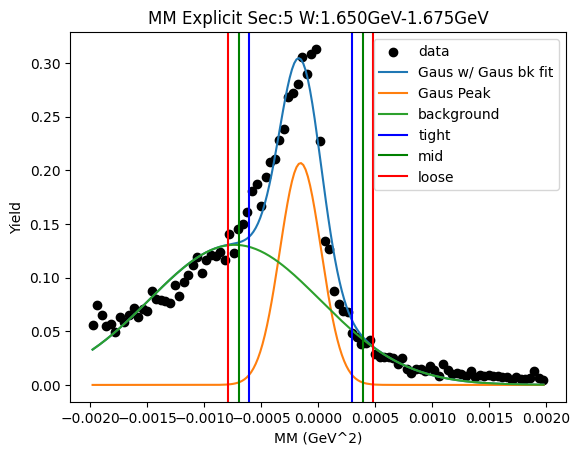

W bin: 11 1.675GeV-1.700GeV
initial Gaus fit:  [ 3.58687331e-01 -1.77222542e-04  2.43255804e-04]
2nd level W dependent
W1_ini_pars: [ 3.58687331e-01 -1.77222542e-04  2.43255804e-04  1.30611669e-01
 -7.32818880e-04  7.51468033e-04]
Gaus1 Peak: [ 2.50797141e-01 -1.51297485e-04  1.87374929e-04]
Gaus2 Peak: [ 0.15469046 -0.00072824  0.0007183 ]
tight should be -0.0006197348063062559   0.0003171398366325328
[[-0.00061973  0.          0.        ]
 [ 0.00031714  0.          0.        ]]
mid should be -0.0007134222706001348   0.0004108273009264117
[[-0.00061973 -0.00071342  0.        ]
 [ 0.00031714  0.00041083  0.        ]]
loose should be -0.0008071097348940136   0.0005045147652202905
[[-0.00061973 -0.00071342 -0.00080711]
 [ 0.00031714  0.00041083  0.00050451]]
-8.243716267184162e-08 1.2821902050776228e-07
Main Gaus Peak [ 2.50797141e-01 -1.51297485e-04  1.87374929e-04]
Gaus2 [ 0.15469046 -0.00072824  0.0007183 ]


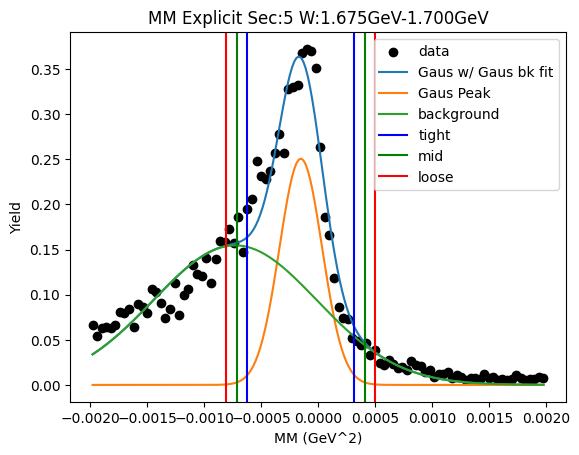

W bin: 12 1.700GeV-1.725GeV
initial Gaus fit:  [ 3.89532322e-01 -1.72925717e-04  2.52242441e-04]
2nd level W dependent
W1_ini_pars: [ 3.89532322e-01 -1.72925717e-04  2.52242441e-04  1.54690459e-01
 -7.28235415e-04  7.18301064e-04]
Gaus1 Peak: [ 2.68493068e-01 -1.36219321e-04  1.75146507e-04]
Gaus2 Peak: [ 0.18199247 -0.00071124  0.00073386]
tight should be -0.0005740855889243375   0.0003016469471837861
[[-0.00057409  0.          0.        ]
 [ 0.00030165  0.          0.        ]]
mid should be -0.0006616588425351499   0.0003892202007945985
[[-0.00057409 -0.00066166  0.        ]
 [ 0.00030165  0.00038922  0.        ]]
loose should be -0.0007492320961459622   0.00047679345440541086
[[-0.00057409 -0.00066166 -0.00074923]
 [ 0.00030165  0.00038922  0.00047679]]
-7.347319359744481e-08 1.1058460035416304e-07
Main Gaus Peak [ 2.68493068e-01 -1.36219321e-04  1.75146507e-04]
Gaus2 [ 0.18199247 -0.00071124  0.00073386]


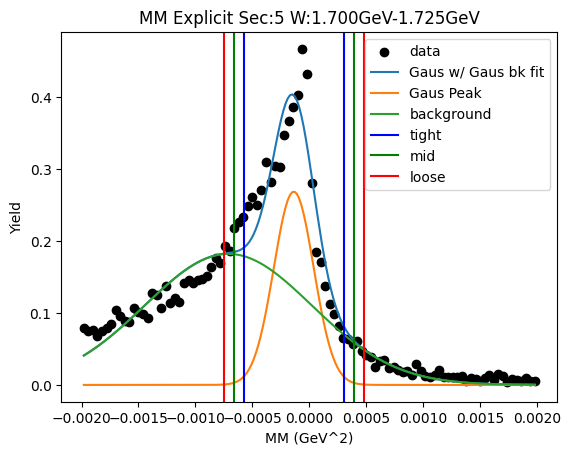

W bin: 13 1.725GeV-1.750GeV
initial Gaus fit:  [ 3.95276752e-01 -1.78785724e-04  2.54371811e-04]
2nd level W dependent
W1_ini_pars: [ 3.95276752e-01 -1.78785724e-04  2.54371811e-04  1.81992466e-01
 -7.11242334e-04  7.33857700e-04]
Gaus1 Peak: [ 2.73751694e-01 -1.57487361e-04  1.96091911e-04]
Gaus2 Peak: [ 0.16953445 -0.00074593  0.00077   ]
tight should be -0.0006477171372354497   0.000332742415338181
[[-0.00064772  0.          0.        ]
 [ 0.00033274  0.          0.        ]]
mid should be -0.0007457630924928127   0.0004307883705955441
[[-0.00064772 -0.00074576  0.        ]
 [ 0.00033274  0.00043079  0.        ]]
loose should be -0.0008438090477501758   0.0005288343258529071
[[-0.00064772 -0.00074576 -0.00084381]
 [ 0.00033274  0.00043079  0.00052883]]
-9.055384324938065e-08 1.401583809665115e-07
Main Gaus Peak [ 2.73751694e-01 -1.57487361e-04  1.96091911e-04]
Gaus2 [ 0.16953445 -0.00074593  0.00077   ]


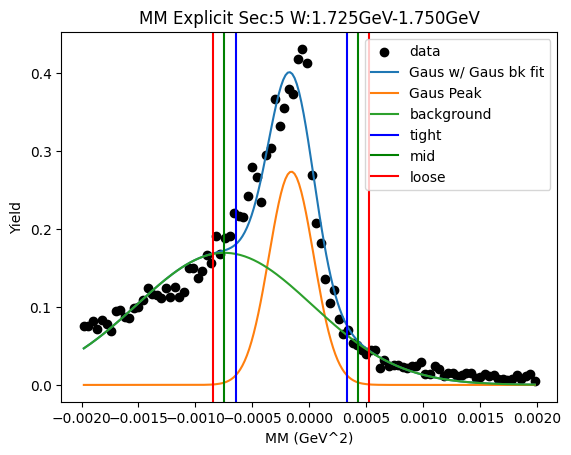

W bin: 14 1.750GeV-1.775GeV
initial Gaus fit:  [ 3.86421028e-01 -1.80729519e-04  2.57799964e-04]
2nd level W dependent
W1_ini_pars: [ 3.86421028e-01 -1.80729519e-04  2.57799964e-04  1.69534448e-01
 -7.45934666e-04  7.69999419e-04]
Gaus1 Peak: [ 2.67759031e-01 -1.48259469e-04  1.78611569e-04]
Gaus2 Peak: [ 0.1720058  -0.00070515  0.00076832]
tight should be -0.0005947883928891754   0.0002982694542375016
[[-0.00059479  0.          0.        ]
 [ 0.00029827  0.          0.        ]]
mid should be -0.0006840941776018431   0.0003875752389501693
[[-0.00059479 -0.00068409  0.        ]
 [ 0.00029827  0.00038758  0.        ]]
loose should be -0.0007733999623145108   0.000476881023662837
[[-0.00059479 -0.00068409 -0.0007734 ]
 [ 0.00029827  0.00038758  0.00047688]]
-7.372540795296544e-08 1.17687148442523e-07
Main Gaus Peak [ 2.67759031e-01 -1.48259469e-04  1.78611569e-04]
Gaus2 [ 0.1720058  -0.00070515  0.00076832]


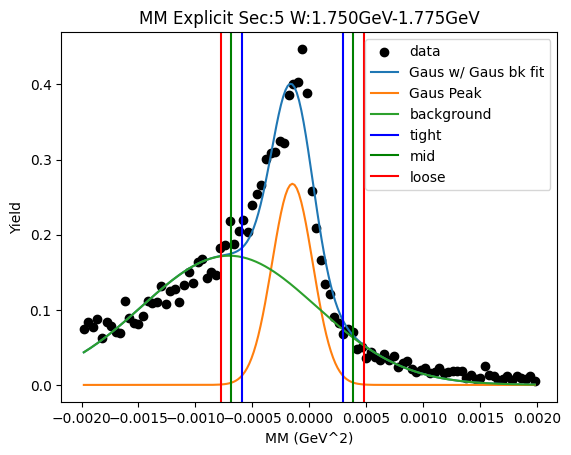

W bin: 15 1.775GeV-1.800GeV
initial Gaus fit:  [ 3.74361876e-01 -1.84321566e-04  2.64164222e-04]
2nd level W dependent
W1_ini_pars: [ 3.74361876e-01 -1.84321566e-04  2.64164222e-04  1.72005803e-01
 -7.05149541e-04  7.68323320e-04]
Gaus1 Peak: [ 2.56388552e-01 -1.58611870e-04  1.92215287e-04]
Gaus2 Peak: [ 0.16477387 -0.00072438  0.00078733]
tight should be -0.0006391500860086566   0.00032192634660639706
[[-0.00063915  0.          0.        ]
 [ 0.00032193  0.          0.        ]]
mid should be -0.000735257729270162   0.00041803398986790233
[[-0.00063915 -0.00073526  0.        ]
 [ 0.00032193  0.00041803  0.        ]]
loose should be -0.0008313653725316673   0.0005141416331294077
[[-0.00063915 -0.00073526 -0.00083137]
 [ 0.00032193  0.00041803  0.00051414]]
-8.568242390928115e-08 1.3599787432945748e-07
Main Gaus Peak [ 2.56388552e-01 -1.58611870e-04  1.92215287e-04]
Gaus2 [ 0.16477387 -0.00072438  0.00078733]


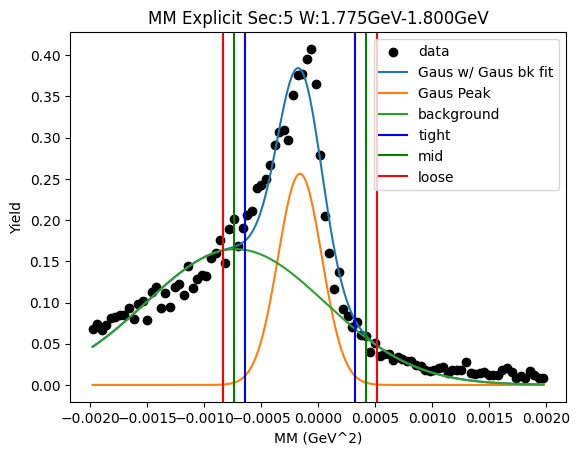

W bin: 16 1.800GeV-1.825GeV
initial Gaus fit:  [ 3.90970134e-01 -1.91929072e-04  2.59939973e-04]
2nd level W dependent
W1_ini_pars: [ 3.90970134e-01 -1.91929072e-04  2.59939973e-04  1.64773870e-01
 -7.24376275e-04  7.87334146e-04]
Gaus1 Peak: [ 2.66543188e-01 -1.67546479e-04  1.91076844e-04]
Gaus2 Peak: [ 0.17125804 -0.00072008  0.00077311]
tight should be -0.0006452385892981295   0.0003101456307368146
[[-0.00064524  0.          0.        ]
 [ 0.00031015  0.          0.        ]]
mid should be -0.0007407770113016239   0.000405684052740309
[[-0.00064524 -0.00074078  0.        ]
 [ 0.00031015  0.00040568  0.        ]]
loose should be -0.0008363154333051184   0.0005012224747438035
[[-0.00064524 -0.00074078 -0.00083632]
 [ 0.00031015  0.00040568  0.00050122]]
-8.145925822766963e-08 1.3760290366635718e-07
Main Gaus Peak [ 2.66543188e-01 -1.67546479e-04  1.91076844e-04]
Gaus2 [ 0.17125804 -0.00072008  0.00077311]


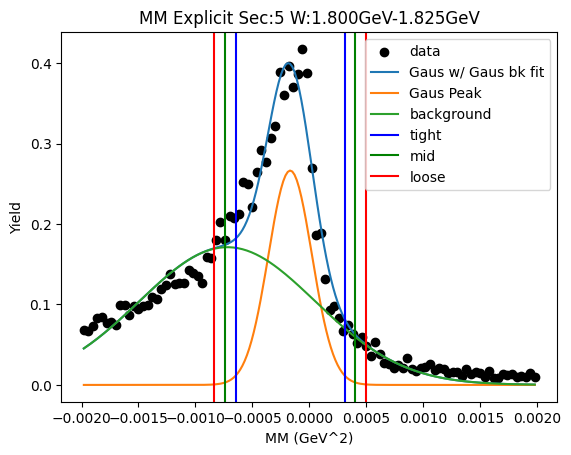

W bin: 17 1.825GeV-1.850GeV
initial Gaus fit:  [ 3.89979022e-01 -1.84865474e-04  2.67159127e-04]
2nd level W dependent
W1_ini_pars: [ 3.89979022e-01 -1.84865474e-04  2.67159127e-04  1.71258038e-01
 -7.20077566e-04  7.73113071e-04]
Gaus1 Peak: [ 2.58466504e-01 -1.47304252e-04  1.68981790e-04]
Gaus2 Peak: [ 0.19039235 -0.00064582  0.00074023]
tight should be -0.0005697587266627747   0.00027515022238924834
[[-0.00056976  0.          0.        ]
 [ 0.00027515  0.          0.        ]]
mid should be -0.0006542496215679771   0.0003596411172944507
[[-0.00056976 -0.00065425  0.        ]
 [ 0.00027515  0.00035964  0.        ]]
loose should be -0.0007387405164731793   0.00044413201219965293
[[-0.00056976 -0.00065425 -0.00073874]
 [ 0.00027515  0.00035964  0.00044413]]
-6.396599316501222e-08 1.073630785601544e-07
Main Gaus Peak [ 2.58466504e-01 -1.47304252e-04  1.68981790e-04]
Gaus2 [ 0.19039235 -0.00064582  0.00074023]


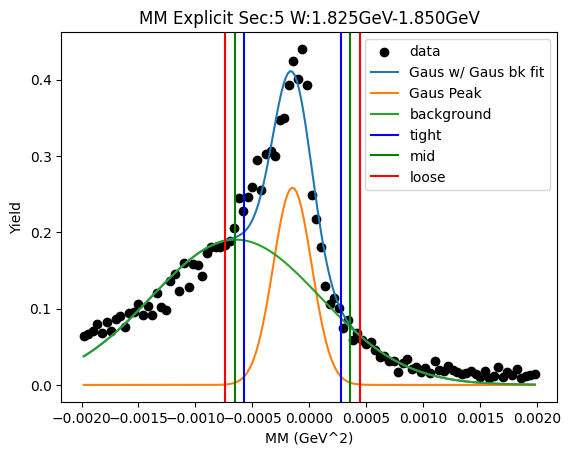

W bin: 18 1.850GeV-1.875GeV
initial Gaus fit:  [ 3.98949797e-01 -1.89366995e-04  2.72613759e-04]
2nd level W dependent
W1_ini_pars: [ 3.98949797e-01 -1.89366995e-04  2.72613759e-04  1.90392354e-01
 -6.45818409e-04  7.40225018e-04]
Gaus1 Peak: [ 2.71095586e-01 -1.57356021e-04  1.89465497e-04]
Gaus2 Peak: [ 0.17952796 -0.00070658  0.00078708]
tight should be -0.0006310197638155885   0.00031630772159028047
[[-0.00063102  0.          0.        ]
 [ 0.00031631  0.          0.        ]]
mid should be -0.0007257525123561754   0.00041104047013086744
[[-0.00063102 -0.00072575  0.        ]
 [ 0.00031631  0.00041104  0.        ]]
loose should be -0.0008204852608967622   0.0005057732186714544
[[-0.00063102 -0.00072575 -0.00082049]
 [ 0.00031631  0.00041104  0.00050577]]
-8.293060637224283e-08 1.3245244113305483e-07
Main Gaus Peak [ 2.71095586e-01 -1.57356021e-04  1.89465497e-04]
Gaus2 [ 0.17952796 -0.00070658  0.00078708]


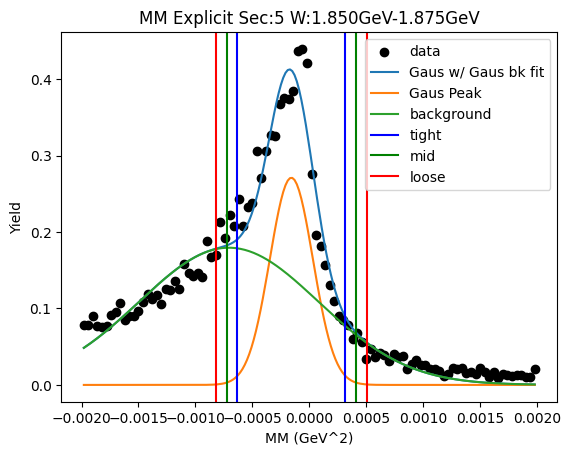

W bin: 19 1.875GeV-1.900GeV
initial Gaus fit:  [ 4.14560175e-01 -1.71596946e-04  2.48349419e-04]
2nd level W dependent
W1_ini_pars: [ 4.14560175e-01 -1.71596946e-04  2.48349419e-04  1.79527958e-01
 -7.06575484e-04  7.87080745e-04]
Gaus1 Peak: [ 2.86688766e-01 -1.44563013e-04  1.64877189e-04]
Gaus2 Peak: [ 0.18619834 -0.00068094  0.00078555]
tight should be -0.0005567559850679915   0.00026762995825146984
[[-0.00055676  0.          0.        ]
 [ 0.00026763  0.          0.        ]]
mid should be -0.0006391945793999377   0.000350068552583416
[[-0.00055676 -0.00063919  0.        ]
 [ 0.00026763  0.00035007  0.        ]]
loose should be -0.0007216331737318838   0.0004325071469153621
[[-0.00055676 -0.00063919 -0.00072163]
 [ 0.00026763  0.00035007  0.00043251]]
-6.06549971794492e-08 1.0245192687080317e-07
Main Gaus Peak [ 2.86688766e-01 -1.44563013e-04  1.64877189e-04]
Gaus2 [ 0.18619834 -0.00068094  0.00078555]


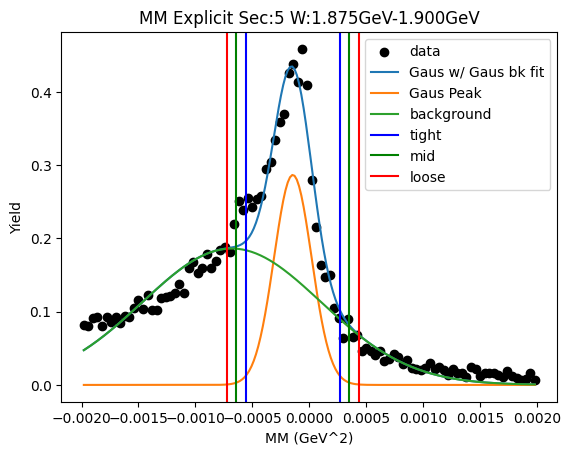

W bin: 20 1.900GeV-1.925GeV
initial Gaus fit:  [ 4.26925583e-01 -1.81111286e-04  2.41456555e-04]
2nd level W dependent
W1_ini_pars: [ 4.26925583e-01 -1.81111286e-04  2.41456555e-04  1.86198342e-01
 -6.80942193e-04  7.85545821e-04]
Gaus1 Peak: [ 2.94413382e-01 -1.55063044e-04  1.64160861e-04]
Gaus2 Peak: [ 0.18920952 -0.00068053  0.00077136]
tight should be -0.0005654651971976969   0.00025533910931818074
[[-0.00056547  0.          0.        ]
 [ 0.00025534  0.          0.        ]]
mid should be -0.0006475456278492847   0.0003374195399697686
[[-0.00056547 -0.00064755  0.        ]
 [ 0.00025534  0.00033742  0.        ]]
loose should be -0.0007296260585008725   0.00041949997062135634
[[-0.00056547 -0.00064755 -0.00072963]
 [ 0.00025534  0.00033742  0.0004195 ]]
-5.680181755553797e-08 1.0489091274726465e-07
Main Gaus Peak [ 2.94413382e-01 -1.55063044e-04  1.64160861e-04]
Gaus2 [ 0.18920952 -0.00068053  0.00077136]


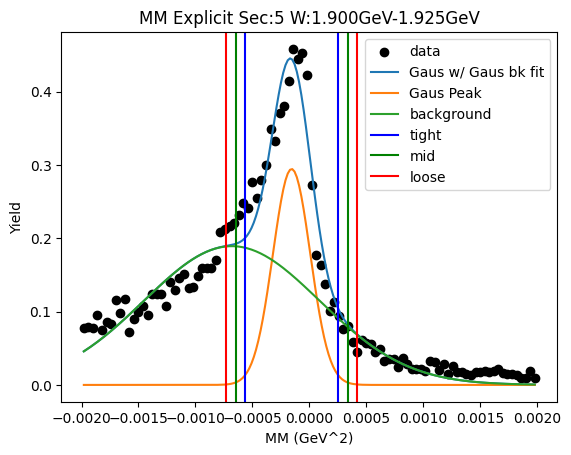

W bin: 21 1.925GeV-1.950GeV
initial Gaus fit:  [ 4.04716917e-01 -1.93047584e-04  2.67421669e-04]
2nd level W dependent
W1_ini_pars: [ 4.04716917e-01 -1.93047584e-04  2.67421669e-04  1.89209521e-01
 -6.80532055e-04  7.71362491e-04]
Gaus1 Peak: [ 2.71000931e-01 -1.58850818e-04  1.87606685e-04]
Gaus2 Peak: [ 0.18838913 -0.00072141  0.00077179]
tight should be -0.0006278675290162199   0.00031016589349457265
[[-0.00062787  0.          0.        ]
 [ 0.00031017  0.          0.        ]]
mid should be -0.0007216708712672992   0.0004039692357456519
[[-0.00062787 -0.00072167  0.        ]
 [ 0.00031017  0.00040397  0.        ]]
loose should be -0.0008154742135183784   0.0004977725779967313
[[-0.00062787 -0.00072167 -0.00081547]
 [ 0.00031017  0.00040397  0.00049777]]
-8.035522190639494e-08 1.3082238651295971e-07
Main Gaus Peak [ 2.71000931e-01 -1.58850818e-04  1.87606685e-04]
Gaus2 [ 0.18838913 -0.00072141  0.00077179]


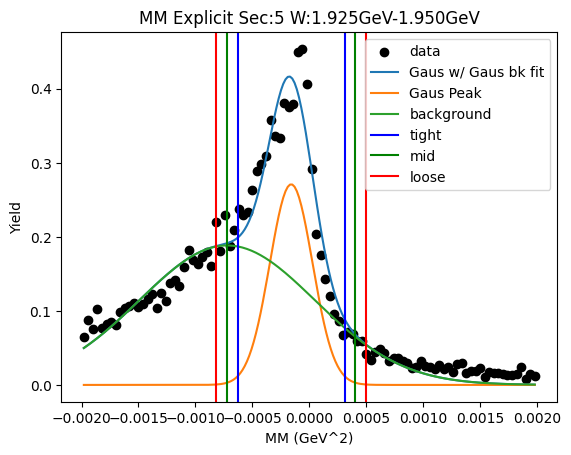

W bin: 22 1.950GeV-1.975GeV
initial Gaus fit:  [ 4.08581953e-01 -1.76054879e-04  2.61636633e-04]
2nd level W dependent
W1_ini_pars: [ 4.08581953e-01 -1.76054879e-04  2.61636633e-04  1.88389125e-01
 -7.21408958e-04  7.71785406e-04]
Gaus1 Peak: [ 2.80765672e-01 -1.44809486e-04  1.80965640e-04]
Gaus2 Peak: [ 0.18215543 -0.00070024  0.00079007]
tight should be -0.000597223584619664   0.0003076046133945014
[[-0.00059722  0.          0.        ]
 [ 0.0003076   0.          0.        ]]
mid should be -0.0006877064044210806   0.0003980874331959178
[[-0.00059722 -0.00068771  0.        ]
 [ 0.0003076   0.00039809  0.        ]]
loose should be -0.0007781892242224971   0.0004885702529973344
[[-0.00059722 -0.00068771 -0.00077819]
 [ 0.0003076   0.00039809  0.00048857]]
-7.727590102720698e-08 1.192154752739678e-07
Main Gaus Peak [ 2.80765672e-01 -1.44809486e-04  1.80965640e-04]
Gaus2 [ 0.18215543 -0.00070024  0.00079007]


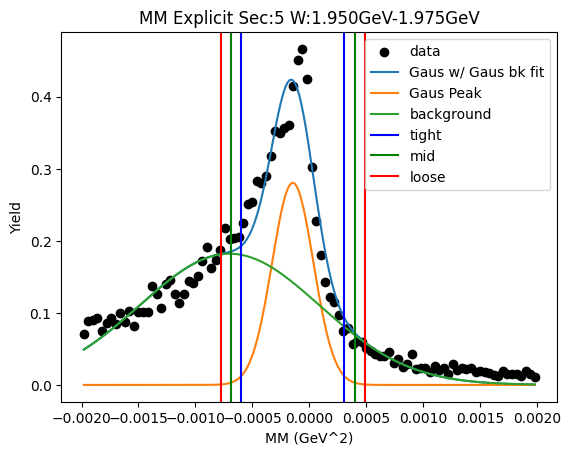

W bin: 23 1.975GeV-2.000GeV
initial Gaus fit:  [ 4.20076848e-01 -1.74604213e-04  2.49055416e-04]
2nd level W dependent
W1_ini_pars: [ 4.20076848e-01 -1.74604213e-04  2.49055416e-04  1.82155432e-01
 -7.00237432e-04  7.90071471e-04]
Gaus1 Peak: [ 2.89814076e-01 -1.41459603e-04  1.65899173e-04]
Gaus2 Peak: [ 0.18879373 -0.00066827  0.00076453]
tight should be -0.0005562075348033818   0.00027328832970336
[[-0.00055621  0.          0.        ]
 [ 0.00027329  0.          0.        ]]
mid should be -0.000639157121254056   0.00035623791615403417
[[-0.00055621 -0.00063916  0.        ]
 [ 0.00027329  0.00035624  0.        ]]
loose should be -0.0007221067077047301   0.00043918750260470835
[[-0.00055621 -0.00063916 -0.00072211]
 [ 0.00027329  0.00035624  0.00043919]]
-6.255678755444738e-08 1.0257842586166148e-07
Main Gaus Peak [ 2.89814076e-01 -1.41459603e-04  1.65899173e-04]
Gaus2 [ 0.18879373 -0.00066827  0.00076453]


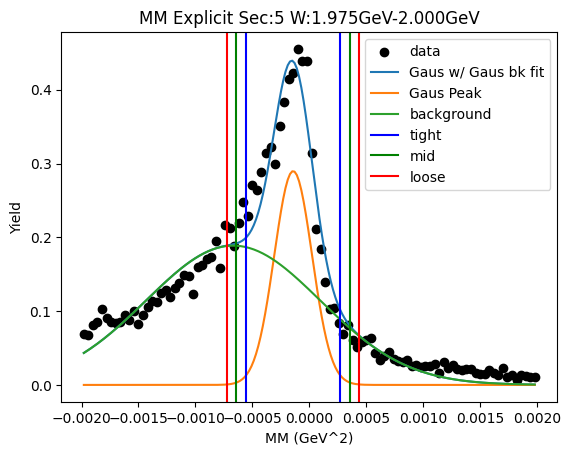

W bin: 24 2.000GeV-2.025GeV
initial Gaus fit:  [ 4.06319741e-01 -1.79518368e-04  2.54745713e-04]
2nd level W dependent
W1_ini_pars: [ 4.06319741e-01 -1.79518368e-04  2.54745713e-04  1.88793731e-01
 -6.68268952e-04  7.64527153e-04]
Gaus1 Peak: [ 2.79717475e-01 -1.58408355e-04  1.84545606e-04]
Gaus2 Peak: [ 0.17290176 -0.00069981  0.00079948]
tight should be -0.0006197723691528911   0.00030295565847885525
[[-0.00061977  0.          0.        ]
 [ 0.00030296  0.          0.        ]]
mid should be -0.0007120451719160657   0.0003952284612420299
[[-0.00061977 -0.00071205  0.        ]
 [ 0.00030296  0.00039523  0.        ]]
loose should be -0.0008043179746792403   0.0004875012640052045
[[-0.00061977 -0.00071205 -0.00080432]
 [ 0.00030296  0.00039523  0.0004875 ]]
-7.70780345166818e-08 1.2726444859783967e-07
Main Gaus Peak [ 2.79717475e-01 -1.58408355e-04  1.84545606e-04]
Gaus2 [ 0.17290176 -0.00069981  0.00079948]


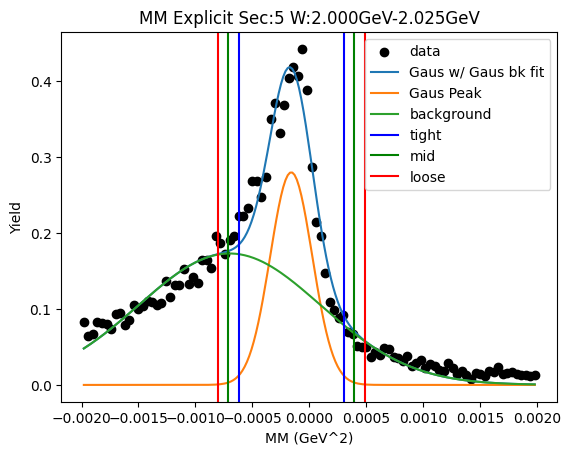

W bin: 25 2.025GeV-2.050GeV
initial Gaus fit:  [ 4.10606582e-01 -1.88434826e-04  2.61745027e-04]
2nd level W dependent
W1_ini_pars: [ 4.10606582e-01 -1.88434826e-04  2.61745027e-04  1.72901761e-01
 -6.99813033e-04  7.99477093e-04]
Gaus1 Peak: [ 2.76041771e-01 -1.63159268e-04  1.89098436e-04]
Gaus2 Peak: [ 0.18205333 -0.00068395  0.00076781]
tight should be -0.0006359053568022221   0.0003095868211580737
[[-0.00063591  0.          0.        ]
 [ 0.00030959  0.          0.        ]]
mid should be -0.0007304545745982517   0.0004041360389541034
[[-0.00063591 -0.00073045  0.        ]
 [ 0.00030959  0.00040414  0.        ]]
loose should be -0.0008250037923942814   0.0004986852567501329
[[-0.00063591 -0.00073045 -0.000825  ]
 [ 0.00030959  0.00040414  0.00049869]]
-8.065370835385712e-08 1.338956017063278e-07
Main Gaus Peak [ 2.76041771e-01 -1.63159268e-04  1.89098436e-04]
Gaus2 [ 0.18205333 -0.00068395  0.00076781]


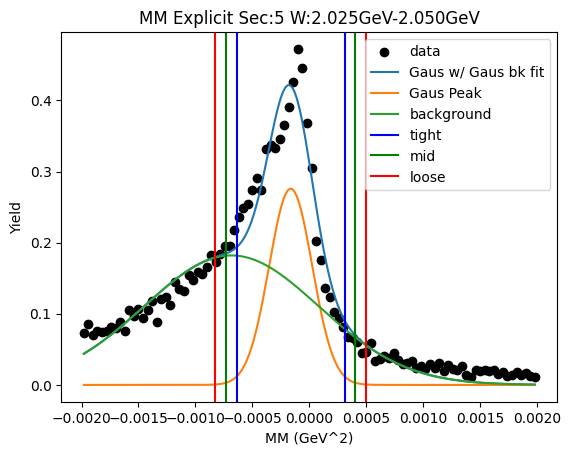

W bin: 26 2.050GeV-2.075GeV
initial Gaus fit:  [ 4.12833872e-01 -1.87638075e-04  2.50295226e-04]
2nd level W dependent
W1_ini_pars: [ 4.12833872e-01 -1.87638075e-04  2.50295226e-04  1.82053330e-01
 -6.83954625e-04  7.67812824e-04]
Gaus1 Peak: [ 2.87739526e-01 -1.64873734e-04  1.84336883e-04]
Gaus2 Peak: [ 0.17059545 -0.00070286  0.00078066]
tight should be -0.0006257159415534104   0.00029596847382508753
[[-0.00062572  0.          0.        ]
 [ 0.00029597  0.          0.        ]]
mid should be -0.0007178843830912602   0.00038813691536293733
[[-0.00062572 -0.00071788  0.        ]
 [ 0.00029597  0.00038814  0.        ]]
loose should be -0.00081005282462911   0.0004803053569007871
[[-0.00062572 -0.00071788 -0.00081005]
 [ 0.00029597  0.00038814  0.00048031]]
-7.475691126788209e-08 1.2912360750450277e-07
Main Gaus Peak [ 2.87739526e-01 -1.64873734e-04  1.84336883e-04]
Gaus2 [ 0.17059545 -0.00070286  0.00078066]


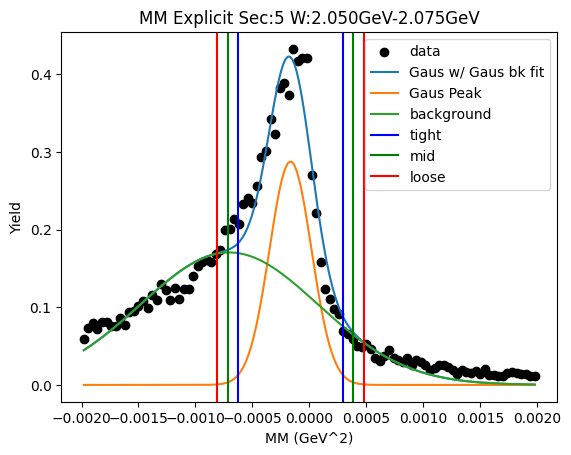

W bin: 27 2.075GeV-2.100GeV
initial Gaus fit:  [ 3.99710379e-01 -1.69853619e-04  2.44533676e-04]
2nd level W dependent
W1_ini_pars: [ 3.99710379e-01 -1.69853619e-04  2.44533676e-04  1.70595450e-01
 -7.02858798e-04  7.80658131e-04]
Gaus1 Peak: [ 2.85014464e-01 -1.37247638e-04  1.58775631e-04]
Gaus2 Peak: [ 0.17308672 -0.00065575  0.00076315]
tight should be -0.0005341867138864963   0.00025969143886690434
[[-0.00053419  0.          0.        ]
 [ 0.00025969  0.          0.        ]]
mid should be -0.0006135745291618364   0.0003390792541422444
[[-0.00053419 -0.00061357  0.        ]
 [ 0.00025969  0.00033908  0.        ]]
loose should be -0.0006929623444371765   0.0004184670694175845
[[-0.00053419 -0.00061357 -0.00069296]
 [ 0.00025969  0.00033908  0.00041847]]
-5.679218856827785e-08 9.446601657231858e-08
Main Gaus Peak [ 2.85014464e-01 -1.37247638e-04  1.58775631e-04]
Gaus2 [ 0.17308672 -0.00065575  0.00076315]


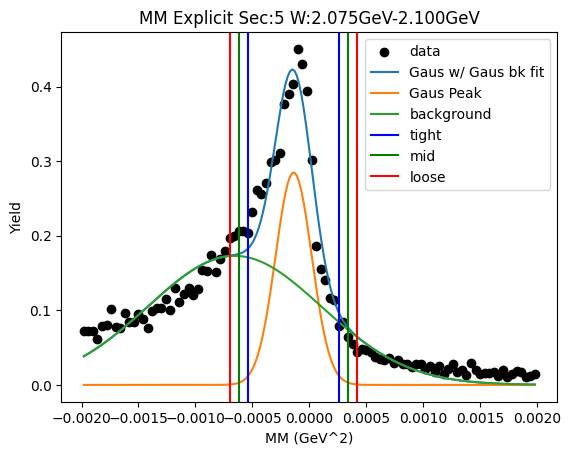

W bin: 28 2.100GeV-2.125GeV
initial Gaus fit:  [ 3.86798922e-01 -1.76165793e-04  2.49625437e-04]
2nd level W dependent
W1_ini_pars: [ 3.86798922e-01 -1.76165793e-04  2.49625437e-04  1.73086716e-01
 -6.55753206e-04  7.63147243e-04]
Gaus1 Peak: [ 2.67525999e-01 -1.53214610e-04  1.75239155e-04]
Gaus2 Peak: [ 0.1639359  -0.00066399  0.00078758]
tight should be -0.0005913124971276575   0.00028488327719447017
[[-0.00059131  0.          0.        ]
 [ 0.00028488  0.          0.        ]]
mid should be -0.0006789320745598703   0.00037250285462668293
[[-0.00059131 -0.00067893  0.        ]
 [ 0.00028488  0.0003725   0.        ]]
loose should be -0.000766551651992083   0.0004601224320588957
[[-0.00059131 -0.00067893 -0.00076655]
 [ 0.00028488  0.0003725   0.00046012]]
-6.865156748557892e-08 1.1560100090000977e-07
Main Gaus Peak [ 2.67525999e-01 -1.53214610e-04  1.75239155e-04]
Gaus2 [ 0.1639359  -0.00066399  0.00078758]


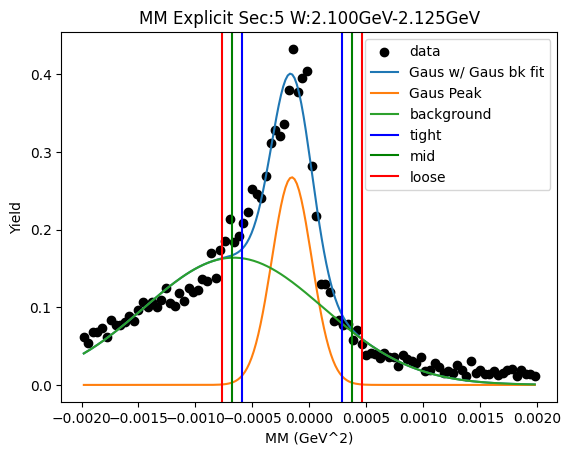

initial bw fit:  [ 1.61271469e+00 -3.15063833e-04  4.93243636e-04]
input parameters for r2 [ 1.61271469e+00 -3.15063833e-04  4.93243636e-04  5.00000000e+00
 -8.08201518e-04  5.76255640e-04]
r2 parameters [ 8.51666174e-01 -6.41129150e-04  7.68114175e-04  1.44457649e+00
 -1.43806235e-04  1.76443534e-04]
-1.3589515718309666e-06 2.181044746519053e-06
Main Gaus Peak [ 1.44457649e+00 -1.43806235e-04  1.76443534e-04]
Gaus2 [ 8.51666174e-01 -6.41129150e-04  7.68114175e-04]


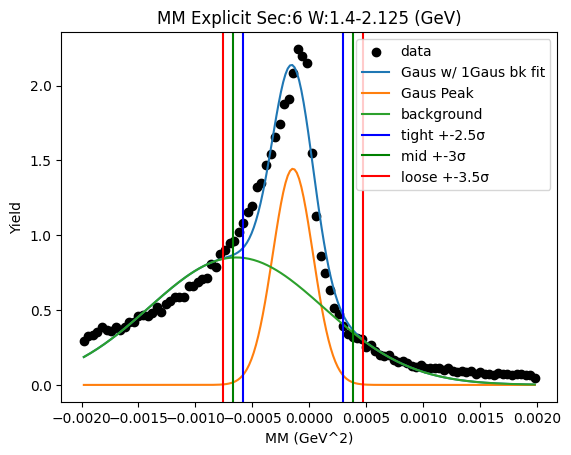

W bin: 0 1.400GeV-1.425GeV
initial Gaus fit:  [ 0.00228474 -0.00016795  0.00025264]
2nd level W dependent
W1_ini_pars: [ 0.00228474 -0.00016795  0.00025264  0.00947786 -0.00060779  0.00061885]
Gaus1 Peak: [ 0.00162814 -0.00014255  0.0001935 ]
Gaus2 Peak: [ 0.00094742 -0.00074148  0.00075283]
tight should be -0.0006262915073256219   0.00034118551643972544
[[-0.00062629  0.          0.        ]
 [ 0.00034119  0.          0.        ]]
mid should be -0.0007230392097021565   0.0004379332188162601
[[-0.00062629 -0.00072304  0.        ]
 [ 0.00034119  0.00043793  0.        ]]
loose should be -0.0008197869120786913   0.0005346809211927948
[[-0.00062629 -0.00072304 -0.00081979]
 [ 0.00034119  0.00043793  0.00053468]]
-9.200005847190531e-08 1.3264277149141974e-07
Main Gaus Peak [ 0.00162814 -0.00014255  0.0001935 ]
Gaus2 [ 0.00094742 -0.00074148  0.00075283]


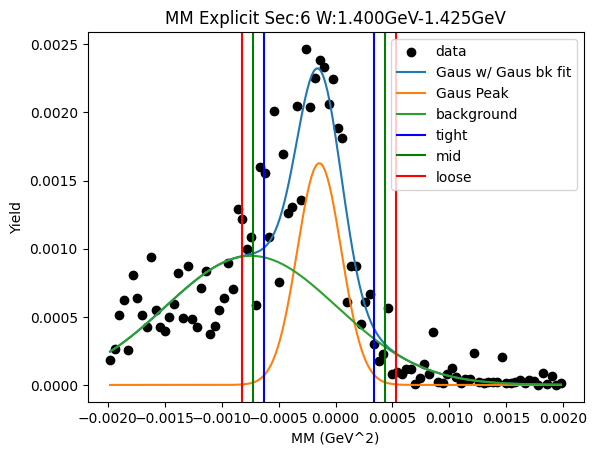

W bin: 1 1.425GeV-1.450GeV
initial Gaus fit:  [ 0.00473186 -0.00016857  0.00023722]
2nd level W dependent
W1_ini_pars: [ 0.00473186 -0.00016857  0.00023722  0.00094742 -0.00074148  0.00075283]
Gaus1 Peak: [ 0.00362852 -0.00014371  0.0001888 ]
Gaus2 Peak: [ 0.00166019 -0.00071282  0.00069188]
tight should be -0.0006157065934510915   0.0003282885220767276
[[-0.00061571  0.          0.        ]
 [ 0.00032829  0.          0.        ]]
mid should be -0.0007101061050038734   0.0004226880336295095
[[-0.00061571 -0.00071011  0.        ]
 [ 0.00032829  0.00042269  0.        ]]
loose should be -0.0008045056165566553   0.0005170875451822914
[[-0.00061571 -0.00071011 -0.00080451]
 [ 0.00032829  0.00042269  0.00051709]]
-8.628292643870592e-08 1.275875003149854e-07
Main Gaus Peak [ 0.00362852 -0.00014371  0.0001888 ]
Gaus2 [ 0.00166019 -0.00071282  0.00069188]


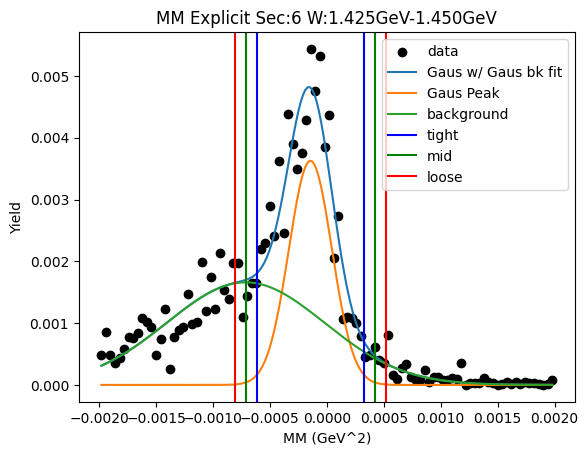

W bin: 2 1.450GeV-1.475GeV
initial Gaus fit:  [ 0.00816256 -0.00016439  0.00020659]
2nd level W dependent
W1_ini_pars: [ 0.00816256 -0.00016439  0.00020659  0.00166019 -0.00071282  0.00069188]
Gaus1 Peak: [ 0.00575972 -0.0001305   0.00014695]
Gaus2 Peak: [ 0.00357984 -0.00060777  0.00059827]
tight should be -0.0004978835992163838   0.0002368739819188392
[[-0.00049788  0.          0.        ]
 [ 0.00023687  0.          0.        ]]
mid should be -0.0005713593573299061   0.0003103497400323615
[[-0.00049788 -0.00057136  0.        ]
 [ 0.00023687  0.00031035  0.        ]]
loose should be -0.0006448351154434284   0.0003838254981458838
[[-0.00049788 -0.00057136 -0.00064484]
 [ 0.00023687  0.00031035  0.00038383]]
-4.775273928382939e-08 8.181574944473474e-08
Main Gaus Peak [ 0.00575972 -0.0001305   0.00014695]
Gaus2 [ 0.00357984 -0.00060777  0.00059827]


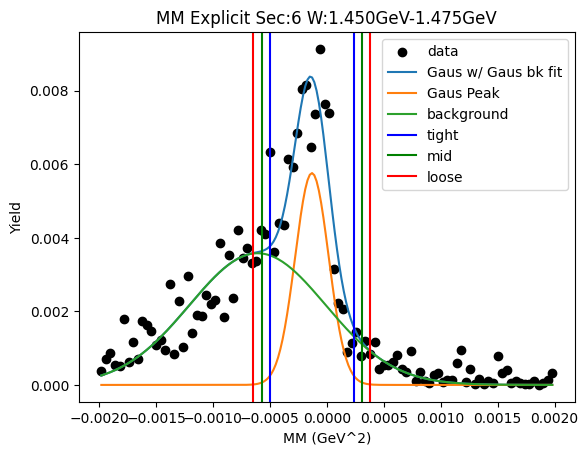

W bin: 3 1.475GeV-1.500GeV
initial Gaus fit:  [ 0.01147713 -0.0001658   0.00022602]
2nd level W dependent
W1_ini_pars: [ 0.01147713 -0.0001658   0.00022602  0.00357984 -0.00060777  0.00059827]
Gaus1 Peak: [ 0.00876667 -0.0001243   0.00014937]
Gaus2 Peak: [ 0.00464648 -0.00064216  0.00066353]
tight should be -0.0004977334734532402   0.00024912426830453135
[[-0.00049773  0.          0.        ]
 [ 0.00024912  0.          0.        ]]
mid should be -0.0005724192476290175   0.00032381004248030856
[[-0.00049773 -0.00057242  0.        ]
 [ 0.00024912  0.00032381  0.        ]]
loose should be -0.0006471050218047945   0.00039849581665608565
[[-0.00049773 -0.00057242 -0.00064711]
 [ 0.00024912  0.00032381  0.0003985 ]]
-5.148394414965399e-08 8.238721259199041e-08
Main Gaus Peak [ 0.00876667 -0.0001243   0.00014937]
Gaus2 [ 0.00464648 -0.00064216  0.00066353]


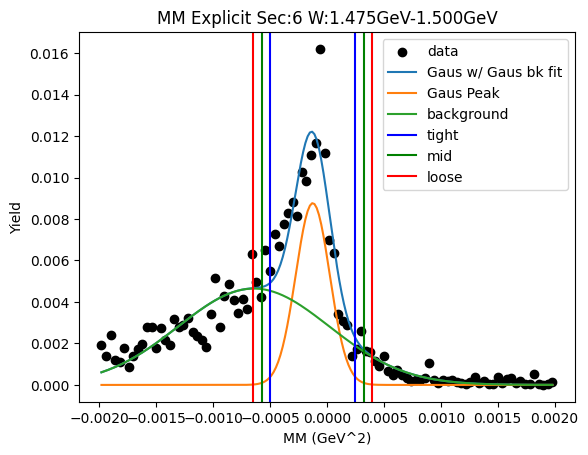

W bin: 4 1.500GeV-1.525GeV
initial Gaus fit:  [ 0.01546939 -0.00015568  0.00023087]
2nd level W dependent
W1_ini_pars: [ 0.01546939 -0.00015568  0.00023087  0.00464648 -0.00064216  0.00066353]
Gaus1 Peak: [ 0.01227332 -0.00013189  0.00016607]
Gaus2 Peak: [ 0.00524427 -0.00070426  0.0007671 ]
tight should be -0.0005470591448840365   0.00028327296347482916
[[-0.00054706  0.          0.        ]
 [ 0.00028327  0.          0.        ]]
mid should be -0.0006300923557199231   0.00036630617431071576
[[-0.00054706 -0.00063009  0.        ]
 [ 0.00028327  0.00036631  0.        ]]
loose should be -0.0007131255665558096   0.0004493393851466023
[[-0.00054706 -0.00063009 -0.00071313]
 [ 0.00028327  0.00036631  0.00044934]]
-6.533838184498869e-08 1.001299565962143e-07
Main Gaus Peak [ 0.01227332 -0.00013189  0.00016607]
Gaus2 [ 0.00524427 -0.00070426  0.0007671 ]


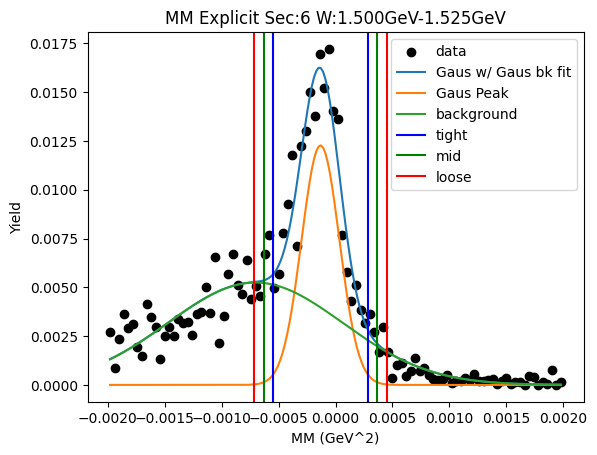

W bin: 5 1.525GeV-1.550GeV
initial Gaus fit:  [ 0.01756884 -0.0001528   0.00023445]
2nd level W dependent
W1_ini_pars: [ 0.01756884 -0.0001528   0.00023445  0.00524427 -0.00070426  0.0007671 ]
Gaus1 Peak: [ 0.0132243  -0.00012795  0.00016121]
Gaus2 Peak: [ 0.00656487 -0.00062673  0.00076048]
tight should be -0.0005309827385882787   0.000275075687444577
[[-0.00053098  0.          0.        ]
 [ 0.00027508  0.          0.        ]]
mid should be -0.0006115885811915642   0.0003556815300478626
[[-0.00053098 -0.00061159  0.        ]
 [ 0.00027508  0.00035568  0.        ]]
loose should be -0.0006921944237948498   0.0004362873726511481
[[-0.00053098 -0.00061159 -0.00069219]
 [ 0.00027508  0.00035568  0.00043629]]
-6.159551763516149e-08 9.433972704769404e-08
Main Gaus Peak [ 0.0132243  -0.00012795  0.00016121]
Gaus2 [ 0.00656487 -0.00062673  0.00076048]


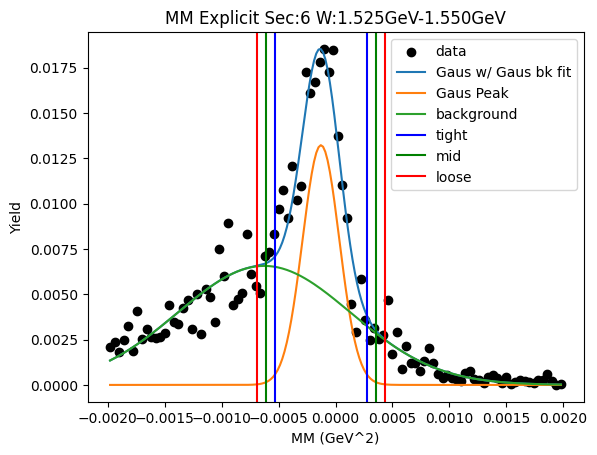

W bin: 6 1.550GeV-1.575GeV
initial Gaus fit:  [ 0.020206   -0.00014876  0.00022326]
2nd level W dependent
W1_ini_pars: [ 0.020206   -0.00014876  0.00022326  0.00656487 -0.00062673  0.00076048]
Gaus1 Peak: [ 0.01514392 -0.00011694  0.0001359 ]
Gaus2 Peak: [ 0.00819745 -0.00052761  0.00067181]
tight should be -0.00045668880569414455   0.0002228103181998849
[[-0.00045669  0.          0.        ]
 [ 0.00022281  0.          0.        ]]
mid should be -0.0005246387180835475   0.00029076023058928783
[[-0.00045669 -0.00052464  0.        ]
 [ 0.00022281  0.00029076  0.        ]]
loose should be -0.0005925886304729504   0.0003587101429786908
[[-0.00045669 -0.00052464 -0.00059259]
 [ 0.00022281  0.00029076  0.00035871]]
-4.1731500396579786e-08 6.908107385288107e-08
Main Gaus Peak [ 0.01514392 -0.00011694  0.0001359 ]
Gaus2 [ 0.00819745 -0.00052761  0.00067181]


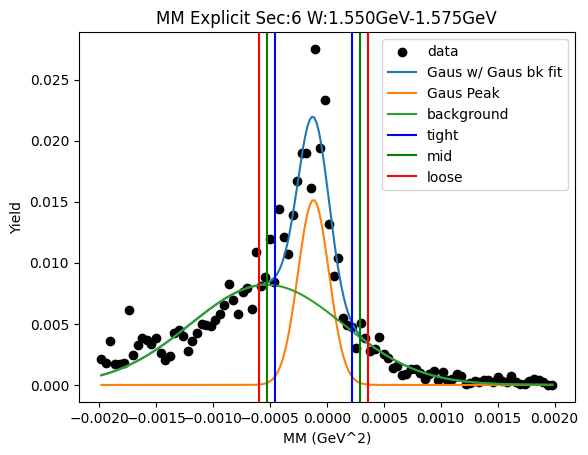

W bin: 7 1.575GeV-1.600GeV
initial Gaus fit:  [ 0.02130464 -0.0001601   0.00023129]
2nd level W dependent
W1_ini_pars: [ 0.02130464 -0.0001601   0.00023129  0.00819745 -0.00052761  0.00067181]
Gaus1 Peak: [ 0.0151733  -0.00012964  0.00014936]
Gaus2 Peak: [ 0.00923405 -0.00059877  0.00069083]
tight should be -0.0005030267325116574   0.00024375513502632347
[[-0.00050303  0.          0.        ]
 [ 0.00024376  0.          0.        ]]
mid should be -0.0005777049192654555   0.00031843332178012156
[[-0.00050303 -0.0005777   0.        ]
 [ 0.00024376  0.00031843  0.        ]]
loose should be -0.0006523831060192536   0.00039311150853391964
[[-0.00050303 -0.0005777  -0.00065238]
 [ 0.00024376  0.00031843  0.00039311]]
-5.011653860637248e-08 8.372741923767099e-08
Main Gaus Peak [ 0.0151733  -0.00012964  0.00014936]
Gaus2 [ 0.00923405 -0.00059877  0.00069083]


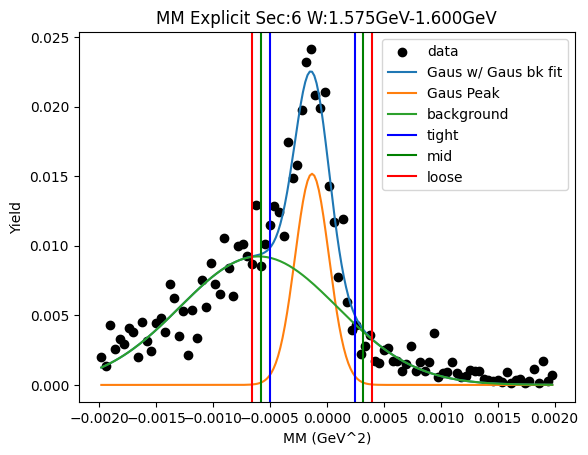

W bin: 8 1.600GeV-1.625GeV
initial Gaus fit:  [ 0.02634051 -0.00015014  0.00023388]
2nd level W dependent
W1_ini_pars: [ 0.02634051 -0.00015014  0.00023388  0.00923405 -0.00059877  0.00069083]
Gaus1 Peak: [ 0.01954629 -0.00012071  0.00016512]
Gaus2 Peak: [ 0.01019562 -0.00067207  0.00077059]
tight should be -0.0005335011898360841   0.00029209044516204205
[[-0.0005335   0.          0.        ]
 [ 0.00029209  0.          0.        ]]
mid should be -0.0006160603533358968   0.00037464960866185465
[[-0.0005335  -0.00061606  0.        ]
 [ 0.00029209  0.00037465  0.        ]]
loose should be -0.0006986195168357094   0.00045720877216166725
[[-0.0005335  -0.00061606 -0.00069862]
 [ 0.00029209  0.00037465  0.00045721]]
-6.722239882244662e-08 9.636197264448438e-08
Main Gaus Peak [ 0.01954629 -0.00012071  0.00016512]
Gaus2 [ 0.01019562 -0.00067207  0.00077059]


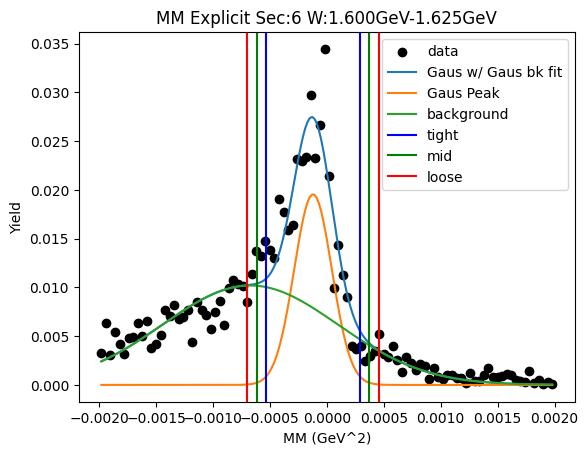

W bin: 9 1.625GeV-1.650GeV
initial Gaus fit:  [ 0.03191029 -0.00013846  0.00021468]
2nd level W dependent
W1_ini_pars: [ 0.03191029 -0.00013846  0.00021468  0.01019562 -0.00067207  0.00077059]
Gaus1 Peak: [ 2.54799099e-02 -9.29086190e-05  1.08911481e-04]
Gaus2 Peak: [ 0.01436991 -0.0005673   0.00067704]
tight should be -0.00036518732067341306   0.00017937008274759262
[[-0.00036519  0.          0.        ]
 [ 0.00017937  0.          0.        ]]
mid should be -0.0004196430610155136   0.00023382582308969314
[[-0.00036519 -0.00041964  0.        ]
 [ 0.00017937  0.00023383  0.        ]]
loose should be -0.00047409880135761416   0.0002882815634317937
[[-0.00036519 -0.00041964 -0.0004741 ]
 [ 0.00017937  0.00023383  0.00028828]]
-2.69531203968801e-08 4.421714335207058e-08
Main Gaus Peak [ 2.54799099e-02 -9.29086190e-05  1.08911481e-04]
Gaus2 [ 0.01436991 -0.0005673   0.00067704]


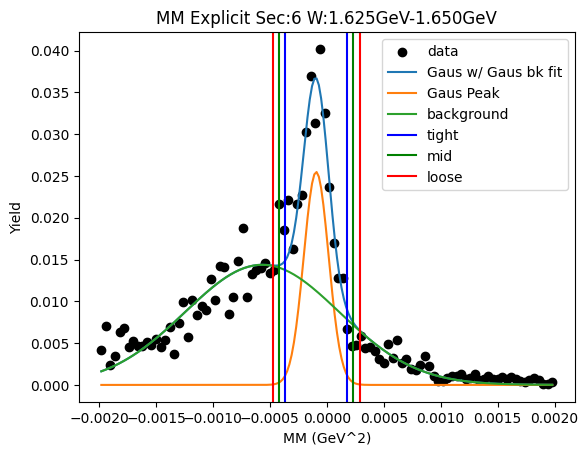

W bin: 10 1.650GeV-1.675GeV
initial Gaus fit:  [ 0.03723258 -0.00015246  0.00023255]
2nd level W dependent
W1_ini_pars: [ 0.03723258 -0.00015246  0.00023255  0.01436991 -0.0005673   0.00067704]
Gaus1 Peak: [ 0.02734103 -0.00011902  0.00015702]
Gaus2 Peak: [ 0.01590411 -0.00067639  0.00071316]
tight should be -0.0005115738560654228   0.00027353183756208466
[[-0.00051157  0.          0.        ]
 [ 0.00027353  0.          0.        ]]
mid should be -0.0005900844254281735   0.0003520424069248354
[[-0.00051157 -0.00059008  0.        ]
 [ 0.00027353  0.00035204  0.        ]]
loose should be -0.0006685949947909243   0.0004305529762875862
[[-0.00051157 -0.00059008 -0.00066859]
 [ 0.00027353  0.00035204  0.00043055]]
-5.980091337667366e-08 8.813291466324544e-08
Main Gaus Peak [ 0.02734103 -0.00011902  0.00015702]
Gaus2 [ 0.01590411 -0.00067639  0.00071316]


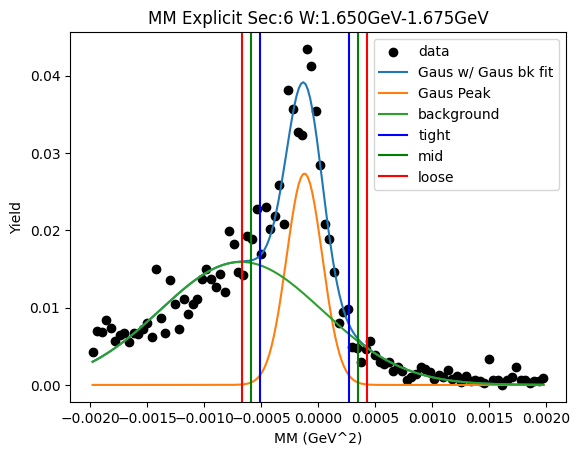

W bin: 11 1.675GeV-1.700GeV
initial Gaus fit:  [ 0.04940097 -0.0001615   0.00023093]
2nd level W dependent
W1_ini_pars: [ 0.04940097 -0.0001615   0.00023093  0.01590411 -0.00067639  0.00071316]
Gaus1 Peak: [ 3.83816299e-02 -9.73218102e-05  1.02417896e-04]
Gaus2 Peak: [ 0.02461077 -0.00053766  0.00064637]
tight should be -0.0003533665490828568   0.0001587229286397066
[[-0.00035337  0.          0.        ]
 [ 0.00015872  0.          0.        ]]
mid should be -0.0004045754968551131   0.00020993187641196292
[[-0.00035337 -0.00040458  0.        ]
 [ 0.00015872  0.00020993  0.        ]]
loose should be -0.0004557844446273694   0.00026114082418421923
[[-0.00035337 -0.00040458 -0.00045578]
 [ 0.00015872  0.00020993  0.00026114]]
-2.1996741238495846e-08 4.0939810728104406e-08
Main Gaus Peak [ 3.83816299e-02 -9.73218102e-05  1.02417896e-04]
Gaus2 [ 0.02461077 -0.00053766  0.00064637]


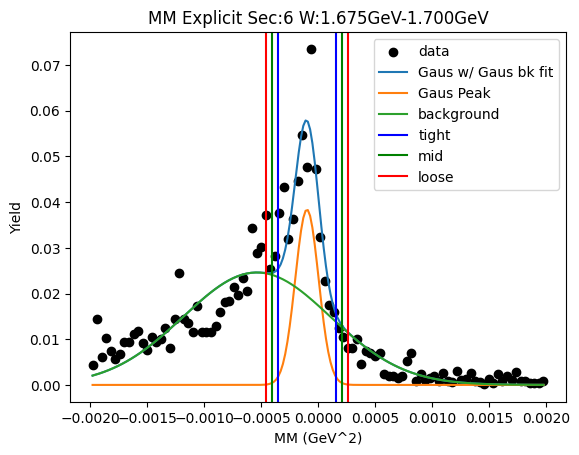

W bin: 12 1.700GeV-1.725GeV
initial Gaus fit:  [ 0.0595593  -0.00017368  0.00025161]
2nd level W dependent
W1_ini_pars: [ 0.0595593  -0.00017368  0.00025161  0.02461077 -0.00053766  0.00064637]
Gaus1 Peak: [ 0.0427237  -0.000153    0.00018631]
Gaus2 Peak: [ 0.02291507 -0.00064874  0.00076709]
tight should be -0.000618766478510173   0.0003127744478106134
[[-0.00061877  0.          0.        ]
 [ 0.00031277  0.          0.        ]]
mid should be -0.0007119205711422517   0.00040592854044269207
[[-0.00061877 -0.00071192  0.        ]
 [ 0.00031277  0.00040593  0.        ]]
loose should be -0.0008050746637743302   0.0004990826330747706
[[-0.00061877 -0.00071192 -0.00080507]
 [ 0.00031277  0.00040593  0.00049908]]
-8.072443897636061e-08 1.275400004021807e-07
Main Gaus Peak [ 0.0427237  -0.000153    0.00018631]
Gaus2 [ 0.02291507 -0.00064874  0.00076709]


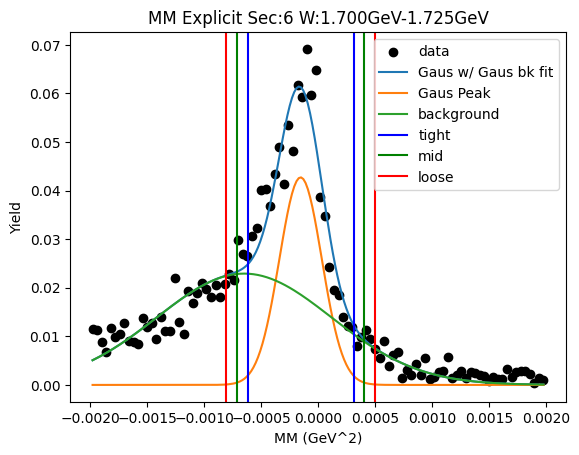

W bin: 13 1.725GeV-1.750GeV
initial Gaus fit:  [ 0.06538757 -0.00014221  0.00024094]
2nd level W dependent
W1_ini_pars: [ 0.06538757 -0.00014221  0.00024094  0.02291507 -0.00064874  0.00076709]
Gaus1 Peak: [ 5.06812451e-02 -8.19752292e-05  1.12412440e-04]
Gaus2 Peak: [ 0.03113    -0.0005226   0.00068164]
tight should be -0.0003630063293045346   0.00019905587089600273
[[-0.00036301  0.          0.        ]
 [ 0.00019906  0.          0.        ]]
mid should be -0.00041921254932458834   0.00025526209091605645
[[-0.00036301 -0.00041921  0.        ]
 [ 0.00019906  0.00025526  0.        ]]
loose should be -0.0004754187693446421   0.0003114683109361102
[[-0.00036301 -0.00041921 -0.00047542]
 [ 0.00019906  0.00025526  0.00031147]]
-3.118973182422033e-08 4.46296082304042e-08
Main Gaus Peak [ 5.06812451e-02 -8.19752292e-05  1.12412440e-04]
Gaus2 [ 0.03113    -0.0005226   0.00068164]


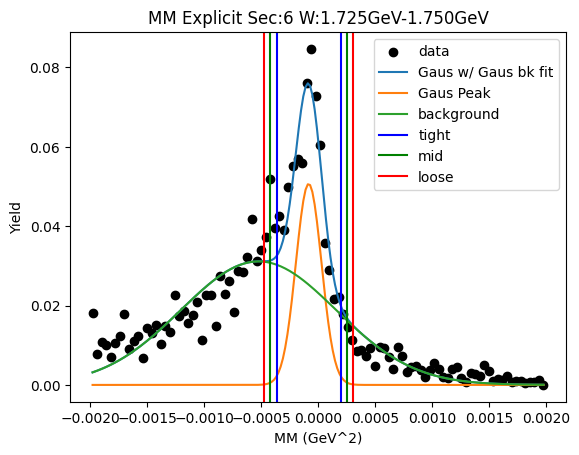

W bin: 14 1.750GeV-1.775GeV
initial Gaus fit:  [ 0.06526347 -0.00016856  0.0002476 ]
2nd level W dependent
W1_ini_pars: [ 0.06526347 -0.00016856  0.0002476   0.03113    -0.0005226   0.00068164]
Gaus1 Peak: [ 0.046534   -0.0001426   0.00017489]
Gaus2 Peak: [ 0.0262589  -0.00064149  0.00074866]
tight should be -0.0005798202684643297   0.0002946144987107768
[[-0.00057982  0.          0.        ]
 [ 0.00029461  0.          0.        ]]
mid should be -0.0006672637451818404   0.0003820579754282874
[[-0.00057982 -0.00066726  0.        ]
 [ 0.00029461  0.00038206  0.        ]]
loose should be -0.0007547072218993511   0.0004695014521457981
[[-0.00057982 -0.00066726 -0.00075471]
 [ 0.00029461  0.00038206  0.0004695 ]]
-7.142075667017075e-08 1.1209192222052908e-07
Main Gaus Peak [ 0.046534   -0.0001426   0.00017489]
Gaus2 [ 0.0262589  -0.00064149  0.00074866]


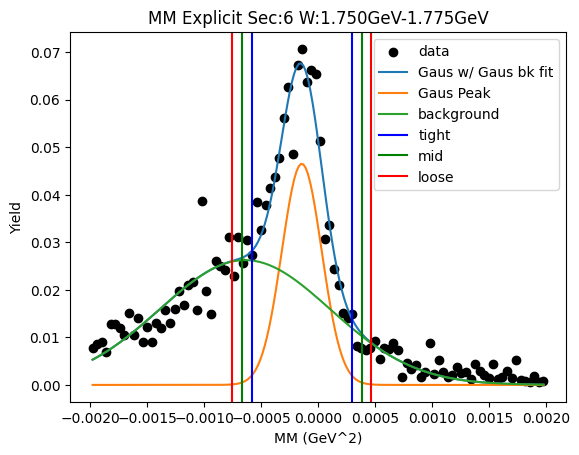

W bin: 15 1.775GeV-1.800GeV
initial Gaus fit:  [ 0.0694494  -0.00016364  0.00024546]
2nd level W dependent
W1_ini_pars: [ 0.0694494  -0.00016364  0.00024546  0.0262589  -0.00064149  0.00074866]
Gaus1 Peak: [ 0.05003989 -0.00013337  0.00016732]
Gaus2 Peak: [ 0.02800264 -0.00060974  0.00073573]
tight should be -0.0005516564035159817   0.0002849244258090564
[[-0.00055166  0.          0.        ]
 [ 0.00028492  0.          0.        ]]
mid should be -0.0006353144864484854   0.00036858250874156017
[[-0.00055166 -0.00063531  0.        ]
 [ 0.00028492  0.00036858  0.        ]]
loose should be -0.0007189725693809893   0.00045224059167406404
[[-0.00055166 -0.00063531 -0.00071897]
 [ 0.00028492  0.00036858  0.00045224]]
-6.619761109643829e-08 1.0177058506216213e-07
Main Gaus Peak [ 0.05003989 -0.00013337  0.00016732]
Gaus2 [ 0.02800264 -0.00060974  0.00073573]


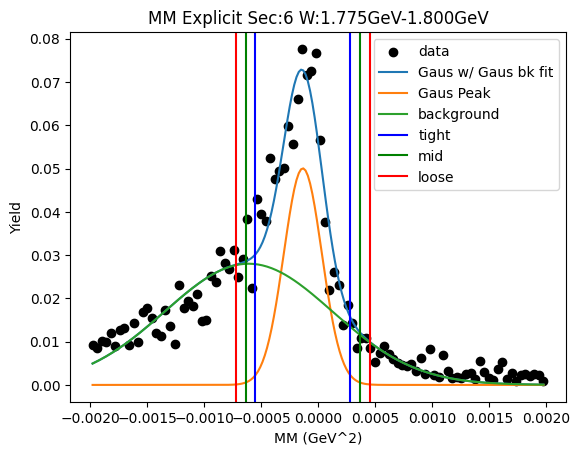

W bin: 16 1.800GeV-1.825GeV
initial Gaus fit:  [ 0.07420984 -0.00017139  0.00025965]
2nd level W dependent
W1_ini_pars: [ 0.07420984 -0.00017139  0.00025965  0.02800264 -0.00060974  0.00073573]
Gaus1 Peak: [ 0.05164407 -0.00015527  0.0001982 ]
Gaus2 Peak: [ 0.02909389 -0.00065292  0.00078913]
tight should be -0.0006507624498439697   0.0003402288314429939
[[-0.00065076  0.          0.        ]
 [ 0.00034023  0.          0.        ]]
mid should be -0.0007498615779726661   0.0004393279595716903
[[-0.00065076 -0.00074986  0.        ]
 [ 0.00034023  0.00043933  0.        ]]
loose should be -0.0008489607061013624   0.0005384270877003866
[[-0.00065076 -0.00074986 -0.00084896]
 [ 0.00034023  0.00043933  0.00053843]]
-9.373986431111263e-08 1.4195542838971408e-07
Main Gaus Peak [ 0.05164407 -0.00015527  0.0001982 ]
Gaus2 [ 0.02909389 -0.00065292  0.00078913]


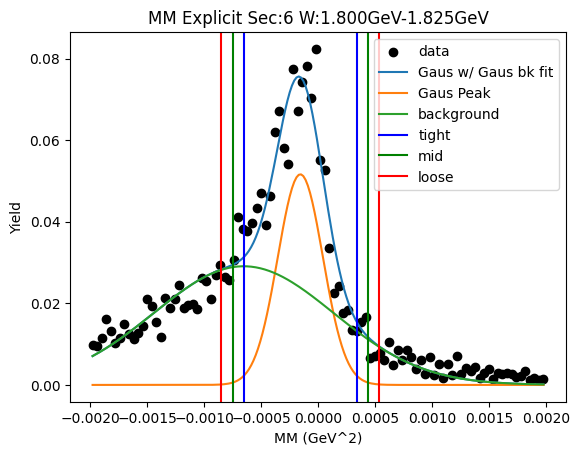

W bin: 17 1.825GeV-1.850GeV
initial Gaus fit:  [ 0.08743908 -0.00017084  0.00024031]
2nd level W dependent
W1_ini_pars: [ 0.08743908 -0.00017084  0.00024031  0.02909389 -0.00065292  0.00078913]
Gaus1 Peak: [ 0.0636409  -0.00016317  0.00019322]
Gaus2 Peak: [ 0.03010563 -0.00068153  0.00082953]
tight should be -0.0006462300266160978   0.00031989394885835367
[[-0.00064623  0.          0.        ]
 [ 0.00031989  0.          0.        ]]
mid should be -0.000742842424163543   0.00041650634640579877
[[-0.00064623 -0.00074284  0.        ]
 [ 0.00031989  0.00041651  0.        ]]
loose should be -0.0008394548217109882   0.000513118743953244
[[-0.00064623 -0.00074284 -0.00083945]
 [ 0.00031989  0.00041651  0.00051312]]
-8.538365540680991e-08 1.3863127322996413e-07
Main Gaus Peak [ 0.0636409  -0.00016317  0.00019322]
Gaus2 [ 0.03010563 -0.00068153  0.00082953]


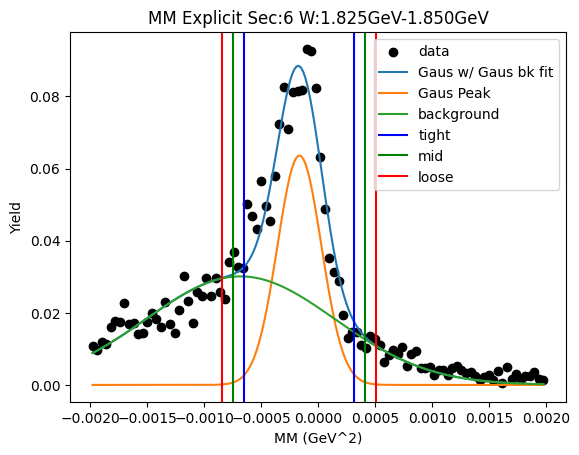

W bin: 18 1.850GeV-1.875GeV
initial Gaus fit:  [ 0.08503826 -0.00018823  0.00027875]
2nd level W dependent
W1_ini_pars: [ 0.08503826 -0.00018823  0.00027875  0.03010563 -0.00068153  0.00082953]
Gaus1 Peak: [ 0.05746425 -0.00014039  0.00015263]
Gaus2 Peak: [ 0.04180298 -0.00056191  0.00071672]
tight should be -0.0005219479409116116   0.000241177688294932
[[-0.00052195  0.          0.        ]
 [ 0.00024118  0.          0.        ]]
mid should be -0.0005982605038322659   0.00031749025121558634
[[-0.00052195 -0.00059826  0.        ]
 [ 0.00024118  0.00031749  0.        ]]
loose should be -0.0006745730667529203   0.0003938028141362407
[[-0.00052195 -0.00059826 -0.00067457]
 [ 0.00024118  0.00031749  0.0003938 ]]
-5.017530342561746e-08 8.959127080283447e-08
Main Gaus Peak [ 0.05746425 -0.00014039  0.00015263]
Gaus2 [ 0.04180298 -0.00056191  0.00071672]


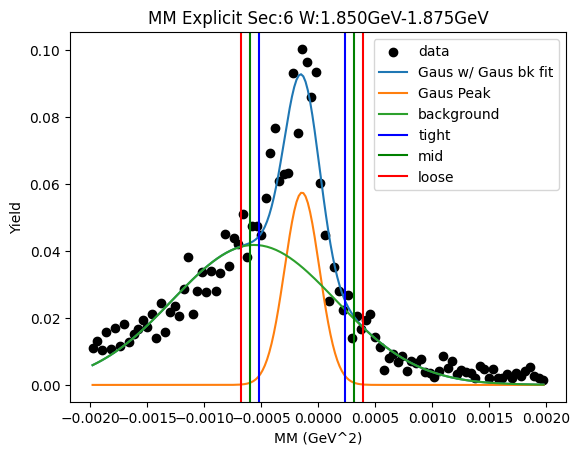

W bin: 19 1.875GeV-1.900GeV
initial Gaus fit:  [ 0.09166755 -0.00017807  0.00025953]
2nd level W dependent
W1_ini_pars: [ 0.09166755 -0.00017807  0.00025953  0.04180298 -0.00056191  0.00071672]
Gaus1 Peak: [ 0.06450795 -0.0001466   0.00017983]
Gaus2 Peak: [ 0.03799276 -0.00064882  0.00076423]
tight should be -0.0005961818476901598   0.0003029886546278887
[[-0.00059618  0.          0.        ]
 [ 0.00030299  0.          0.        ]]
mid should be -0.0006860988979219646   0.0003929057048596936
[[-0.00059618 -0.0006861   0.        ]
 [ 0.00030299  0.00039291  0.        ]]
loose should be -0.0007760159481537696   0.00048282275509149844
[[-0.00059618 -0.0006861  -0.00077602]
 [ 0.00030299  0.00039291  0.00048282]]
-7.553034895415447e-08 1.1851147318317956e-07
Main Gaus Peak [ 0.06450795 -0.0001466   0.00017983]
Gaus2 [ 0.03799276 -0.00064882  0.00076423]


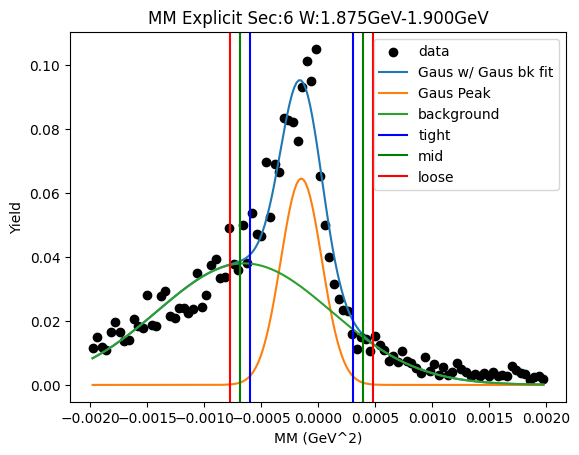

W bin: 20 1.900GeV-1.925GeV
initial Gaus fit:  [ 0.10433444 -0.00017033  0.00026903]
2nd level W dependent
W1_ini_pars: [ 0.10433444 -0.00017033  0.00026903  0.03799276 -0.00064882  0.00076423]
Gaus1 Peak: [ 0.07466649 -0.00014412  0.00018568]
Gaus2 Peak: [ 0.04187868 -0.00066247  0.00082151]
tight should be -0.0006083158487440036   0.0003200761669185919
[[-0.00060832  0.          0.        ]
 [ 0.00032008  0.          0.        ]]
mid should be -0.0007011550503102631   0.0004129153684848514
[[-0.00060832 -0.00070116  0.        ]
 [ 0.00032008  0.00041292  0.        ]]
loose should be -0.0007939942518765227   0.000505754570051111
[[-0.00060832 -0.00070116 -0.00079399]
 [ 0.00032008  0.00041292  0.00050575]]
-8.265887962482317e-08 1.2419993671423046e-07
Main Gaus Peak [ 0.07466649 -0.00014412  0.00018568]
Gaus2 [ 0.04187868 -0.00066247  0.00082151]


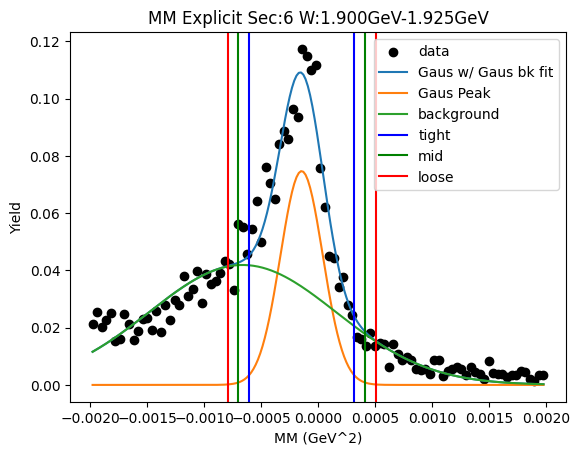

W bin: 21 1.925GeV-1.950GeV
initial Gaus fit:  [ 0.1104252  -0.00017815  0.00026329]
2nd level W dependent
W1_ini_pars: [ 0.1104252  -0.00017815  0.00026329  0.04187868 -0.00066247  0.00082151]
Gaus1 Peak: [ 0.07362846 -0.00015116  0.00018929]
Gaus2 Peak: [ 0.04878002 -0.00064354  0.00074895]
tight should be -0.0006243779771901236   0.0003220594390617649
[[-0.00062438  0.          0.        ]
 [ 0.00032206  0.          0.        ]]
mid should be -0.0007190217188153125   0.00041670318068695383
[[-0.00062438 -0.00071902  0.        ]
 [ 0.00032206  0.0004167   0.        ]]
loose should be -0.0008136654604405014   0.0005113469223121427
[[-0.00062438 -0.00071902 -0.00081367]
 [ 0.00032206  0.0004167   0.00051135]]
-8.464012932176912e-08 1.3033837856980304e-07
Main Gaus Peak [ 0.07362846 -0.00015116  0.00018929]
Gaus2 [ 0.04878002 -0.00064354  0.00074895]


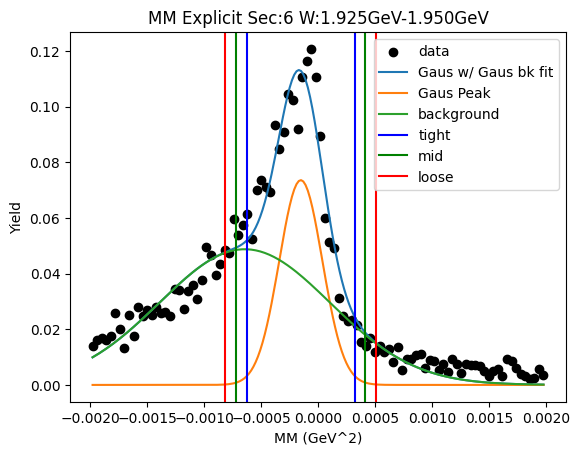

W bin: 22 1.950GeV-1.975GeV
initial Gaus fit:  [ 0.11802923 -0.0001746   0.00027151]
2nd level W dependent
W1_ini_pars: [ 0.11802923 -0.0001746   0.00027151  0.04878002 -0.00064354  0.00074895]
Gaus1 Peak: [ 0.07746346 -0.00013848  0.00017117]
Gaus2 Peak: [ 0.05737448 -0.00063938  0.00077431]
tight should be -0.0005663912460796073   0.0002894387018255979
[[-0.00056639  0.          0.        ]
 [ 0.00028944  0.          0.        ]]
mid should be -0.0006519742408701278   0.0003750216966161183
[[-0.00056639 -0.00065197  0.        ]
 [ 0.00028944  0.00037502  0.        ]]
loose should be -0.0007375572356606483   0.00046060469140663885
[[-0.00056639 -0.00065197 -0.00073756]
 [ 0.00028944  0.00037502  0.0004606 ]]
-6.871771002557887e-08 1.070690659099634e-07
Main Gaus Peak [ 0.07746346 -0.00013848  0.00017117]
Gaus2 [ 0.05737448 -0.00063938  0.00077431]


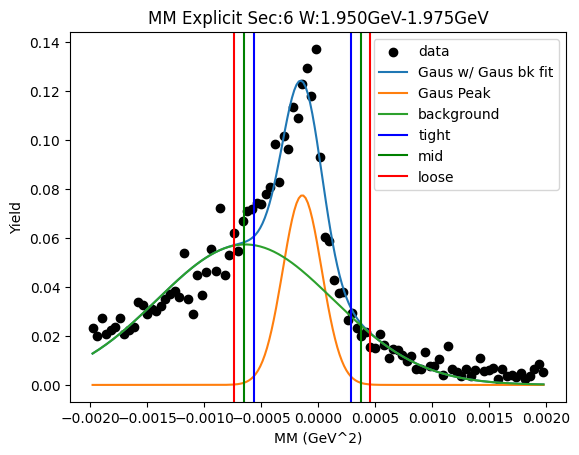

W bin: 23 1.975GeV-2.000GeV
initial Gaus fit:  [ 0.13176982 -0.00016733  0.00024145]
2nd level W dependent
W1_ini_pars: [ 0.13176982 -0.00016733  0.00024145  0.05737448 -0.00063938  0.00077431]
Gaus1 Peak: [ 0.09128938 -0.00013396  0.00014587]
Gaus2 Peak: [ 0.05968432 -0.00057682  0.00073442]
tight should be -0.0004986400193803806   0.00023071929523380677
[[-0.00049864  0.          0.        ]
 [ 0.00023072  0.          0.        ]]
mid should be -0.0005715759508417994   0.00030365522669522553
[[-0.00049864 -0.00057158  0.        ]
 [ 0.00023072  0.00030366  0.        ]]
loose should be -0.0006445118823032182   0.00037659115815664426
[[-0.00049864 -0.00057158 -0.00064451]
 [ 0.00023072  0.00030366  0.00037659]]
-4.589042257093114e-08 8.17811797845434e-08
Main Gaus Peak [ 0.09128938 -0.00013396  0.00014587]
Gaus2 [ 0.05968432 -0.00057682  0.00073442]


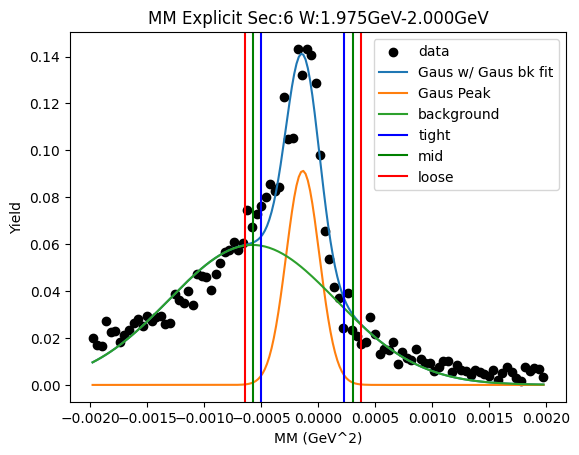

W bin: 24 2.000GeV-2.025GeV
initial Gaus fit:  [ 0.13441843 -0.00017446  0.00026331]
2nd level W dependent
W1_ini_pars: [ 0.13441843 -0.00017446  0.00026331  0.05968432 -0.00057682  0.00073442]
Gaus1 Peak: [ 0.09481114 -0.00015004  0.00019792]
Gaus2 Peak: [ 0.0535334  -0.00070029  0.00080638]
tight should be -0.0006448496420158552   0.0003447733811557473
[[-0.00064485  0.          0.        ]
 [ 0.00034477  0.          0.        ]]
mid should be -0.0007438119443330155   0.0004437356834729076
[[-0.00064485 -0.00074381  0.        ]
 [ 0.00034477  0.00044374  0.        ]]
loose should be -0.0008427742466501758   0.0005426979857900679
[[-0.00064485 -0.00074381 -0.00084277]
 [ 0.00034477  0.00044374  0.0005427 ]]
-9.50110067760104e-08 1.4003388794190213e-07
Main Gaus Peak [ 0.09481114 -0.00015004  0.00019792]
Gaus2 [ 0.0535334  -0.00070029  0.00080638]


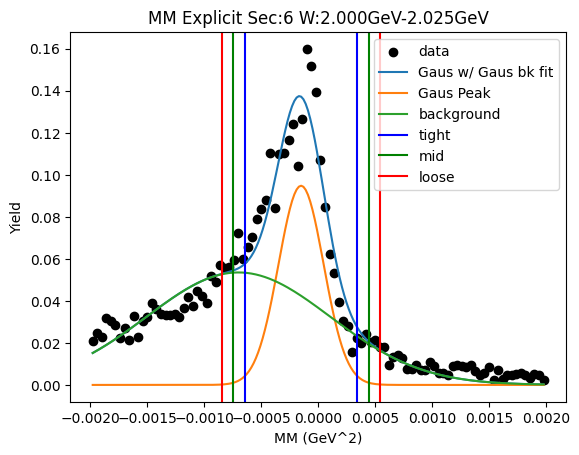

W bin: 25 2.025GeV-2.050GeV
initial Gaus fit:  [ 0.147169   -0.00017435  0.00026091]
2nd level W dependent
W1_ini_pars: [ 0.147169   -0.00017435  0.00026091  0.0535334  -0.00070029  0.00080638]
Gaus1 Peak: [ 0.10599567 -0.00014603  0.00017859]
Gaus2 Peak: [ 0.05936055 -0.00064707  0.00077821]
tight should be -0.0005925139736853236   0.00030045114033034335
[[-0.00059251  0.          0.        ]
 [ 0.00030045  0.          0.        ]]
mid should be -0.0006818104850868902   0.00038974765173191005
[[-0.00059251 -0.00068181  0.        ]
 [ 0.00030045  0.00038975  0.        ]]
loose should be -0.0007711069964884569   0.00047904416313347676
[[-0.00059251 -0.00068181 -0.00077111]
 [ 0.00030045  0.00038975  0.00047904]]
-7.436122872504683e-08 1.1701157803871628e-07
Main Gaus Peak [ 0.10599567 -0.00014603  0.00017859]
Gaus2 [ 0.05936055 -0.00064707  0.00077821]


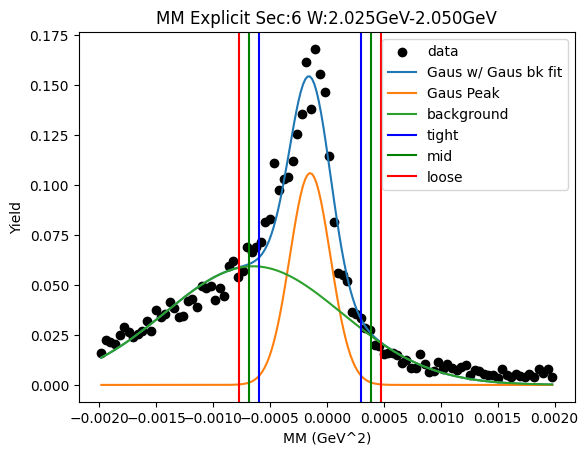

W bin: 26 2.050GeV-2.075GeV
initial Gaus fit:  [ 0.15050274 -0.00018436  0.00025912]
2nd level W dependent
W1_ini_pars: [ 0.15050274 -0.00018436  0.00025912  0.05936055 -0.00064707  0.00077821]
Gaus1 Peak: [ 0.10514412 -0.00016726  0.00018755]
Gaus2 Peak: [ 0.06023253 -0.00065617  0.00079986]
tight should be -0.000636130823035485   0.00030162033713085465
[[-0.00063613  0.          0.        ]
 [ 0.00030162  0.          0.        ]]
mid should be -0.000729905939052119   0.0003953954531474886
[[-0.00063613 -0.00072991  0.        ]
 [ 0.00030162  0.0003954   0.        ]]
loose should be -0.000823681055068753   0.0004891705691641226
[[-0.00063613 -0.00072991 -0.00082368]
 [ 0.00030162  0.0003954   0.00048917]]
-7.755095231215995e-08 1.334995849022359e-07
Main Gaus Peak [ 0.10514412 -0.00016726  0.00018755]
Gaus2 [ 0.06023253 -0.00065617  0.00079986]


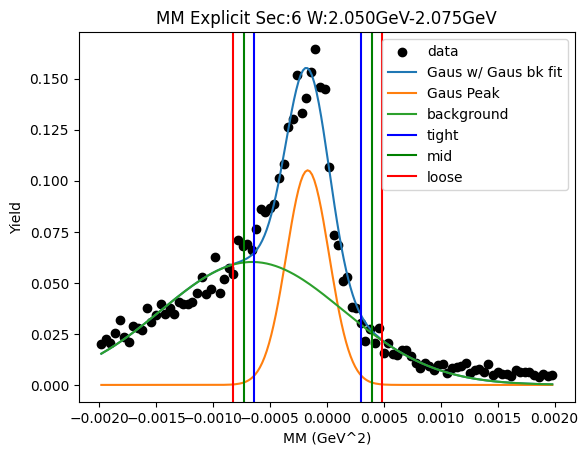

W bin: 27 2.075GeV-2.100GeV
initial Gaus fit:  [ 0.15418235 -0.0001704   0.00025961]
2nd level W dependent
W1_ini_pars: [ 0.15418235 -0.0001704   0.00025961  0.06023253 -0.00065617  0.00079986]
Gaus1 Peak: [ 0.1091497  -0.00015115  0.00018672]
Gaus2 Peak: [ 0.06090868 -0.00065664  0.00082069]
tight should be -0.0006179526752956283   0.0003156539765872898
[[-0.00061795  0.          0.        ]
 [ 0.00031565  0.          0.        ]]
mid should be -0.00071131334048392   0.00040901464177558154
[[-0.00061795 -0.00071131  0.        ]
 [ 0.00031565  0.00040901  0.        ]]
loose should be -0.0008046740056722118   0.0005023753069638734
[[-0.00061795 -0.00071131 -0.00080467]
 [ 0.00031565  0.00040901  0.00050238]]
-8.174843984261514e-08 1.2744069146299255e-07
Main Gaus Peak [ 0.1091497  -0.00015115  0.00018672]
Gaus2 [ 0.06090868 -0.00065664  0.00082069]


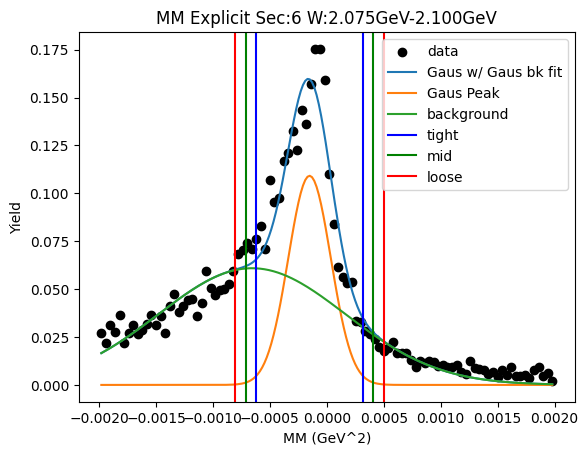

W bin: 28 2.100GeV-2.125GeV
initial Gaus fit:  [ 0.1628316  -0.00018096  0.00025256]
2nd level W dependent
W1_ini_pars: [ 0.1628316  -0.00018096  0.00025256  0.06090868 -0.00065664  0.00082069]
Gaus1 Peak: [ 0.11579419 -0.00016217  0.00019202]
Gaus2 Peak: [ 0.06247147 -0.00069816  0.00081575]
tight should be -0.0006422205216194127   0.00031788248628659445
[[-0.00064222  0.          0.        ]
 [ 0.00031788  0.          0.        ]]
mid should be -0.0007382308224100134   0.0004138927870771952
[[-0.00064222 -0.00073823  0.        ]
 [ 0.00031788  0.00041389  0.        ]]
loose should be -0.0008342411232006141   0.0005099030878677959
[[-0.00064222 -0.00073823 -0.00083424]
 [ 0.00031788  0.00041389  0.0005099 ]]
-8.431694400393138e-08 1.369145245857076e-07
Main Gaus Peak [ 0.11579419 -0.00016217  0.00019202]
Gaus2 [ 0.06247147 -0.00069816  0.00081575]


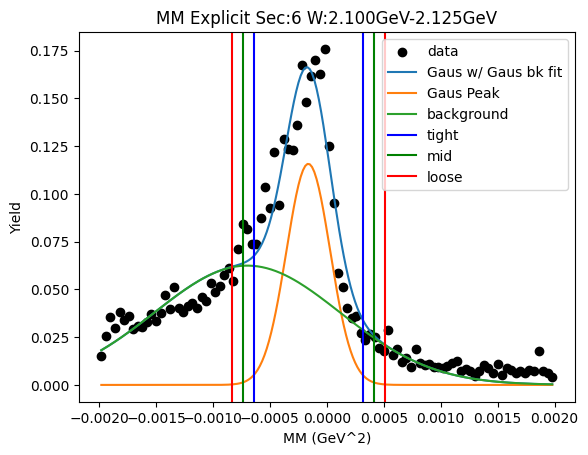

In [17]:
bkgd=True
Wlow_bin = -1
Wbin_bkgd = 0

tight = 2.5
mid = 3
loose = 3.5



#a_ini=180
#m_ini=0.000034
#g_ini=12
#bw_ini = [a_ini,m_ini,g_ini]

gaus1_ini = [9., -0.00022, 0.0002]
gaus2_ini = [5., -8.08201518e-04,  5.76255640e-04]
gaus3_ini = [7., 0.4, 0.2417]
 
#bw_ini_w = [30, 0.000034, 12]

gaus1_ini_w = [0.0171581,  -0.00012925,  0.00014695]
gaus2_ini_w = [0.00947786, -0.00060779,  0.00061885]
gaus3_ini_w = [2.78458923, 0.4, 0.10165907]

gaus_bounds = [[0.0,-0.01,1e-05],[np.inf,0.01,np.inf]]
full_bounds2= [[0.0,-0.01,1e-05,0.0,-np.inf,0.0],[np.inf,0.01,np.inf,np.inf,np.inf,np.inf]]
full_bounds = [[0.0,-0.01,1e-05,0.0,-np.inf,0.0,0.0,-np.inf,0.0],[np.inf,0.01,np.inf,np.inf,np.inf,np.inf,np.inf,np.inf,np.inf]]
   

#bw_pars = np.zeros((6,_W_bins_+1,3))
gaus1_pars = np.zeros((6,_W_bins_+1,3))
gaus2_pars = np.zeros((6,_W_bins_+1,3))
gaus3_pars = np.zeros((6,_W_bins_+1,3))

gaus1_err = np.zeros((6,_W_bins_+1,3))
gaus2_err = np.zeros((6,_W_bins_+1,3))
gaus3_err = np.zeros((6,_W_bins_+1,3))


ini_pars= np.zeros(9)
ini_pars2= np.zeros(6)
for i in range(3):
    #ini_pars[i] = bw_ini[i]
    ini_pars2[i] = gaus1_ini[i]
    ini_pars2[i+3] = gaus2_ini[i]
    ini_pars[i] = gaus1_ini[i]
    ini_pars[i+3] = gaus2_ini[i]
    ini_pars[i+6] = gaus3_ini[i]

    #sec W low, high, tight, mid, loose
cut_bounds = np.zeros((6,_W_bins_+1,2,3))
cut_bounds_err = np.zeros((6,_W_bins_+1,2,3))

#bw_ini_w1 = np.zeros(3)
gaus1_ini_w1 = np.zeros(3)
    
for sec in range(6):
    x_r=Center_Xbins(hist_name[sec][1])
    y_r=Values_1d(hist_name[sec][1])
    plt.scatter(x_r,y_r,color='k',label='data')
    plt.title("MM {} Sec:{} W:{}-{} (GeV)".format(Particle,sec+1,_W_min_,_W_max_))
    plt.xlabel("MM (GeV^2)")
    plt.ylabel("Yield")
    tmp_x1 = np.linspace(x_r[0],x_r[len(x_r)-1],200)
    try:
        #plt.plot(tmp_x1,BW_e2(tmp_x1,*bw_ini),label="BW ini pars")
        pars_r1, pars_cov_r1 = op.curve_fit(Gaus,x_r,y_r,p0=gaus1_ini,maxfev=5000,bounds=gaus_bounds)
        #plt.plot(tmp_x1,Gaus(tmp_x1,*pars_r1),label="Gaus fit1")
        print("initial bw fit: ",pars_r1)
        try:
            #r1_ini_pars = np.zeros(9)
            r1_ini_pars = np.zeros(6)
            
            for i in range(3):
                r1_ini_pars[i] = pars_r1[i]
                r1_ini_pars[i+3] = gaus2_ini[i]
                #r1_ini_pars[i+6] = gaus3_ini[i]
            #pars_r2, pars_cov_r2 = op.curve_fit(Gaus3,x_r,y_r,p0=r1_ini_pars,maxfev=5000,bounds=full_bounds)
            print("input parameters for r2",r1_ini_pars)
            pars_r2, pars_cov_r2 = op.curve_fit(Gaus2,x_r,y_r,p0=r1_ini_pars,maxfev=5000,bounds=full_bounds2)
            #plt.plot(tmp_x1,Gaus3(tmp_x1,*pars_r2),label="Gaus w/ 2Gaus bk fit")
            #plt.plot(tmp_x1,Gaus2(tmp_x1,*r1_ini_pars),label="Gaus w/ 1Gaus bk guess")
            plt.plot(tmp_x1,Gaus2(tmp_x1,*pars_r2),label="Gaus w/ 1Gaus bk fit")
            print("r2 parameters",pars_r2)
            #r1_bkgd_pars = np.zeros(6)
            r1_bkgd_pars = np.zeros(3)
            
            for i in range(3):
                #bw_pars[sec][_W_bins_][i] = pars_r2[i]
                if np.abs(pars_r2[1]) < np.abs(pars_r2[4]):
                    gaus1_pars[sec][_W_bins_][i] = pars_r2[i]
                    gaus1_err[sec][_W_bins_][i] = pars_cov_r2[i][i]
                    r1_bkgd_pars[i] = pars_r2[i+3]
                    #r1_bkgd_pars[i+3] = pars_r2[i+6]
                    gaus2_pars[sec][_W_bins_][i] = pars_r2[i+3]
                    gaus2_err[sec][_W_bins_][i] = pars_cov_r2[i+3][i+3]
                else:
                    gaus1_pars[sec][_W_bins_][i] = pars_r2[i+3]
                    gaus1_err[sec][_W_bins_][i] = pars_cov_r2[i+3][i+3]
                    r1_bkgd_pars[i] = pars_r2[i]
                    #r1_bkgd_pars[i+3] = pars_r2[i+6]
                    gaus2_pars[sec][_W_bins_][i] = pars_r2[i]
                    gaus2_err[sec][_W_bins_][i] = pars_cov_r2[i][i]
                #gaus3_pars[sec][_W_bins_][i] = pars_r2[i+6]
                #gaus3_err[sec][_W_bins_][i] = pars_cov_r2[i+6][i+6]
            for i in range(3):
                #cut_bounds[sec][_W_bins_][0][0] = sign(pars_r2[1]-tight*pars_r2[2])*(pars_r2[1]-tight*pars_r2[2])*(pars_r2[1]-tight*pars_r2[2])
                #cut_bounds[sec][_W_bins_][0][1] = sign(pars_r2[1]-mid*pars_r2[2])*(pars_r2[1]-mid*pars_r2[2])*(pars_r2[1]-mid*pars_r2[2])
                #cut_bounds[sec][_W_bins_][0][2] = sign(pars_r2[1]-loose*pars_r2[2])*(pars_r2[1]-loose*pars_r2[2])*(pars_r2[1]-loose*pars_r2[2])
                #cut_bounds[sec][_W_bins_][1][0] = (pars_r2[1]+tight*pars_r2[2])*(pars_r2[1]+tight*pars_r2[2])
                #cut_bounds[sec][_W_bins_][1][1] = (pars_r2[1]+mid*pars_r2[2])*(pars_r2[1]+mid*pars_r2[2])
                #cut_bounds[sec][_W_bins_][1][2] = (pars_r2[1]+loose*pars_r2[2])*(pars_r2[1]+loose*pars_r2[2])
                cut_bounds[sec][_W_bins_][0][i] = (gaus1_pars[sec][_W_bins_][1]-cut_width[i]*gaus1_pars[sec][_W_bins_][2])
                cut_bounds[sec][_W_bins_][1][i] = (gaus1_pars[sec][_W_bins_][1]+cut_width[i]*gaus1_pars[sec][_W_bins_][2])
                
#                 cut_bounds[sec][_W_bins_][0][0] = (pars_r2[1]-tight*pars_r2[2])
#                 cut_bounds[sec][_W_bins_][0][1] = (pars_r2[1]-mid*pars_r2[2])
#                 cut_bounds[sec][_W_bins_][0][2] = (pars_r2[1]-loose*pars_r2[2])
#                 cut_bounds[sec][_W_bins_][1][0] = (pars_r2[1]+tight*pars_r2[2])
#                 cut_bounds[sec][_W_bins_][1][1] = (pars_r2[1]+mid*pars_r2[2])
#                 cut_bounds[sec][_W_bins_][1][2] = (pars_r2[1]+loose*pars_r2[2])
                #
                #print(pars_cov_r2[1][1],pars_cov_r2[2][2])
                #cut_bounds_err[sec][_W_bins_][0][0] = add_quad([pars_cov_r2[1][1],-tight*pars_cov_r2[2][2]])
                #cut_bounds_err[sec][_W_bins_][0][1] = add_quad([pars_cov_r2[1][1],-mid*pars_cov_r2[2][2]])
                #cut_bounds_err[sec][_W_bins_][0][2] = add_quad([pars_cov_r2[1][1],-loose*pars_cov_r2[2][2]])
                #cut_bounds_err[sec][_W_bins_][1][0] = add_quad([pars_cov_r2[1][1],tight*pars_cov_r2[2][2]])
                #cut_bounds_err[sec][_W_bins_][1][1] = add_quad([pars_cov_r2[1][1],mid*pars_cov_r2[2][2]])
                #cut_bounds_err[sec][_W_bins_][1][2] = add_quad([pars_cov_r2[1][1],loose*pars_cov_r2[2][2]])
            plt.plot(tmp_x1,Gaus(tmp_x1,*gaus1_pars[sec][_W_bins_]),label="Gaus Peak")
            #plt.plot(tmp_x1,Gaus2(tmp_x1,*r1_bkgd_pars),label="background")
            plt.plot(tmp_x1,Gaus(tmp_x1,*r1_bkgd_pars),label="background")
            plt.axvline(x=cut_bounds[sec][_W_bins_][0][0],label="tight +-{}\u03C3".format(tight),color='b')
            plt.axvline(x=cut_bounds[sec][_W_bins_][1][0],color='b')
            plt.axvline(x=cut_bounds[sec][_W_bins_][0][1],label="mid +-{}\u03C3".format(mid),color='g')
            plt.axvline(x=cut_bounds[sec][_W_bins_][1][1],color='g')
            plt.axvline(x=cut_bounds[sec][_W_bins_][0][2],label="loose +-{}\u03C3".format(loose),color='r')
            plt.axvline(x=cut_bounds[sec][_W_bins_][1][2],color='r')
            print(pars_r2[1]*pars_r2[1]-3*pars_r2[2]*pars_r2[2],pars_r2[1]*pars_r2[1]+3*pars_r2[2]*pars_r2[2])
            print("Main Gaus Peak",gaus1_pars[sec][_W_bins_])
            print("Gaus2",gaus2_pars[sec][_W_bins_])
            #print("Gaus3",gaus3_pars[sec][_W_bins_])
        except RuntimeError:
            print("Runtime Error1.1\n\tJust skip it for now")
        except ValueError:
            print("Value Error1.1\n\tJust skip it for now")
    except RuntimeError:
        print("Runtime Error1.0\n\tJust skip it for now")
    except ValueError:
        print("Value Error1.0\n\tJust skip it for now")
    plt.legend()
    plt.show()
    for Wbin in range(_W_bins_):
        
        if Wbin > Wlow_bin:
            print("W bin:",Wbin,W_Bin_PlotName[Wbin])
            x_w=Center_Xbins(hist_name[sec][0][Wbin])
            y_w=Values_1d(hist_name[sec][0][Wbin])
            if Count_Non_Zero(y_w) > 10:
                plt.scatter(x_w,y_w,color='k',label='data')
                plt.title("MM {} Sec:{} W:{}".format(Particle,sec+1,W_Bin_PlotName[Wbin]))
                plt.xlabel("MM (GeV^2)")
                plt.ylabel("Yield")
                if Wbin > 0 and gaus1_pars[sec][Wbin-1][i]!=0:
                    for i in range(3):
                        #bw_ini_w1[i] = bw_pars[sec][Wbin-1][i]
                        gaus1_ini_w1[i] = gaus1_pars[sec][Wbin-1][i]
                else:
                    for i in range(3):
                        #bw_ini_w1[i] = bw_ini_w[i]
                        gaus1_ini_w1[i] = gaus1_ini_w[i]
                gaus1_ini_w1[0] = np.max(y_w)
                gaus1_ini_w1[1] = x_w[np.argmax(y_w)]
                #gaus1_ini_w1[2]
                cont_x = np.linspace(np.min(x_w),np.max(x_w),200)
                #plt.plot(cont_x,Gaus(cont_x,*gaus1_ini_w1),label="first guess")
                try:
                    #if Wbin > 0 and bw_pars[sec][Wbin-1][i]!=0:
                    x_w_fit = Bounds_on_Y(x_w,-0.0005,0.002)
                    y_w_fit = Bounds_on_X_From_Y(y_w,x_w,-0.0005,0.002)
                    pars_w1, pars_cov_w1 = op.curve_fit(Gaus,x_w_fit,y_w_fit,p0=gaus1_ini_w1,maxfev=5000,bounds=gaus_bounds)
                    #plt.plot(tmp_x1,Gaus(tmp_x1,*pars_w1),label="gaus fit1")
                    #plt.plot(tmp_x1,Gaus(tmp_x1,*gaus1_ini_w1),label="gaus ini_w1")
                    print("initial Gaus fit: ",pars_w1)
                    if Wbin >= Wbin_bkgd:
                        try:
                            print("2nd level W dependent")
                            #w1_ini_pars = np.zeros(9)
                            w1_ini_pars = np.zeros(6)

                            for i in range(3):
                                w1_ini_pars[i] = pars_w1[i]
                                if Wbin > 0:
                                    if gaus2_pars[sec][Wbin-1][i] != 0.0:
                                        w1_ini_pars[i+3] = gaus2_pars[sec][Wbin-1][i]
                                        #w1_ini_pars[i+6] = gaus3_pars[sec][Wbin-1][i]
                                    else:
                                        w1_ini_pars[i+3] = gaus2_ini_w[i]
                                        #w1_ini_pars[i+6] = gaus3_ini_w[i]
                                else:
                                    w1_ini_pars[i+3] = gaus2_ini_w[i]
                                    #w1_ini_pars[i+6] = gaus3_ini_w[i]
                            print("W1_ini_pars:",w1_ini_pars)
                            #plt.plot(tmp_x1,Gaus2(tmp_x1,*w1_ini_pars),label="guess Gaus w/ Gaus bk fit")
                            #pars_w2, pars_cov_w2 = op.curve_fit(Gaus3,x_w,y_w,p0=w1_ini_pars,maxfev=5000,bounds=full_bounds)
                            pars_w2, pars_cov_w2 = op.curve_fit(Gaus2,x_w,y_w,p0=w1_ini_pars,maxfev=5000,bounds=full_bounds2)
                            #plt.plot(tmp_x1,Gaus3(tmp_x1,*pars_w2),label="Gaus w/ 2Gaus bk fit")
                            plt.plot(tmp_x1,Gaus2(tmp_x1,*pars_w2),label="Gaus w/ Gaus bk fit")
                            #w1_bkgd_pars = np.zeros(6)
                            w1_bkgd_pars = np.zeros(3)
                            for i in range(3):
                                #bw_pars[sec][Wbin][i] = pars_w2[i]
                                if np.abs(pars_w2[1]) < np.abs(pars_w2[4]): 
                                    gaus1_pars[sec][Wbin][i] = pars_w2[i]
                                    w1_bkgd_pars[i] = pars_w2[i+3]
                                    #w1_bkgd_pars[i+3] = pars_w2[i+6]
                                    gaus2_pars[sec][Wbin][i] = pars_w2[i+3]
                                else:
                                    gaus1_pars[sec][Wbin][i] = pars_w2[i+3]
                                    w1_bkgd_pars[i] = pars_w2[i]
                                    #w1_bkgd_pars[i+3] = pars_w2[i+6]
                                    gaus2_pars[sec][Wbin][i] = pars_w2[i]
                                #gaus3_pars[sec][Wbin][i] = pars_w2[i+6]
                            print("Gaus1 Peak:",gaus1_pars[sec][Wbin])
                            print("Gaus2 Peak:",gaus2_pars[sec][Wbin])
                            for i in range(3):
                                print(cut_names[i],"should be",gaus1_pars[sec][Wbin][1]-cut_width[i]*gaus1_pars[sec][Wbin][2]," ",gaus1_pars[sec][Wbin][1]+cut_width[i]*gaus1_pars[sec][Wbin][2])
                                cut_bounds[sec][Wbin][0][i] = (gaus1_pars[sec][Wbin][1]-cut_width[i]*gaus1_pars[sec][Wbin][2])
                                cut_bounds[sec][Wbin][1][i] = (gaus1_pars[sec][Wbin][1]+cut_width[i]*gaus1_pars[sec][Wbin][2])
                                print(cut_bounds[sec][Wbin])
    #                             cut_bounds[sec][Wbin][0][2] = (pars_w2[1]-loose*pars_w2[2])
    #                             cut_bounds[sec][Wbin][1][0] = (pars_w2[1]+tight*pars_w2[2])
    #                             cut_bounds[sec][Wbin][1][1] = (pars_w2[1]+mid*pars_w2[2])
    #                             cut_bounds[sec][Wbin][1][2] = (pars_w2[1]+loose*pars_w2[2])
                                #
                                #cut_bounds_err[sec][Wbin][0][0] = add_quad([pars_cov_w2[1][1],-tight*pars_cov_w2[2][2]])
                                #cut_bounds_err[sec][Wbin][0][1] = add_quad([pars_cov_w2[1][1],-mid*pars_cov_w2[2][2]])
                                #cut_bounds_err[sec][Wbin][0][2] = add_quad([pars_cov_w2[1][1],-loose*pars_cov_w2[2][2]])
                                #cut_bounds_err[sec][Wbin][1][0] = add_quad([pars_cov_w2[1][1],tight*pars_cov_w2[2][2]])
                                #cut_bounds_err[sec][Wbin][1][1] = add_quad([pars_cov_w2[1][1],mid*pars_cov_w2[2][2]])
                                #cut_bounds_err[sec][Wbin][1][2] = add_quad([pars_cov_w2[1][1],loose*pars_cov_w2[2][2]])
                            plt.plot(tmp_x1,Gaus(tmp_x1,*gaus1_pars[sec][Wbin]),label="Gaus Peak")
                            #plt.plot(tmp_x1,Gaus2(tmp_x1,*w1_bkgd_pars),label="background")
                            plt.plot(tmp_x1,Gaus(tmp_x1,*gaus2_pars[sec][Wbin]),label="background")

                            print(pars_w2[1]*pars_w2[1]-3*pars_w2[2]*pars_w2[2],pars_w2[1]*pars_w2[1]+3*pars_w2[2]*pars_w2[2])
                            print("Main Gaus Peak",gaus1_pars[sec][Wbin])
                            print("Gaus2",gaus2_pars[sec][Wbin])
                            #print("Gaus3",gaus3_pars[sec][Wbin])
                        except RuntimeError:
                            print("Runtime Error2.1\n\tJust skip it for now")
                            for i in range(3):
                                #bw_pars[sec][Wbin][i] = pars_w1[i]
                                gaus1_pars[sec][Wbin][i] = pars_w1[i]
                                cut_bounds[sec][Wbin][0][i] = (pars_w1[1]-cut_width[i]*pars_w1[2])
                                cut_bounds[sec][Wbin][1][i] = (pars_w1[1]+cut_width[i]*pars_w1[2])
    #                             cut_bounds[sec][Wbin][0][0] = (pars_w1[1]-tight*pars_w1[2])
    #                             cut_bounds[sec][Wbin][0][1] = (pars_w1[1]-mid*pars_w1[2])
    #                             cut_bounds[sec][Wbin][0][2] = (pars_w1[1]-loose*pars_w1[2])
    #                             cut_bounds[sec][Wbin][1][0] = (pars_w1[1]+tight*pars_w1[2])
    #                             cut_bounds[sec][Wbin][1][1] = (pars_w1[1]+mid*pars_w1[2])
    #                             cut_bounds[sec][Wbin][1][2] = (pars_w1[1]+loose*pars_w1[2])
                                #
                                #cut_bounds_err[sec][Wbin][0][0] = add_quad([pars_cov_w1[1][1],-tight*pars_cov_w1[2][2]])
                                #cut_bounds_err[sec][Wbin][0][1] = add_quad([pars_cov_w1[1][1],-mid*pars_cov_w1[2][2]])
                                #cut_bounds_err[sec][Wbin][0][2] = add_quad([pars_cov_w1[1][1],-loose*pars_cov_w1[2][2]])
                                #cut_bounds_err[sec][Wbin][1][0] = add_quad([pars_cov_w1[1][1],tight*pars_cov_w1[2][2]])
                                #cut_bounds_err[sec][Wbin][1][1] = add_quad([pars_cov_w1[1][1],mid*pars_cov_w1[2][2]])
                                #cut_bounds_err[sec][Wbin][1][2] = add_quad([pars_cov_w1[1][1],loose*pars_cov_w1[2][2]])
                        except ValueError:
                            print("Value Error2.1\n\tJust skip it for now")
                            for i in range(3):
                                #bw_pars[sec][Wbin][i] = pars_w1[i]
                                gaus1_pars[sec][Wbin][i] = pars_w1[i]
                                cut_bounds[sec][Wbin][0][i] = (pars_w1[1]-cut_width[i]*pars_w1[2])
                                cut_bounds[sec][Wbin][1][i] = (pars_w1[1]+cut_width[i]*pars_w1[2])
    #                             cut_bounds[sec][Wbin][0][0] = (pars_w1[1]-tight*pars_w1[2])
    #                             cut_bounds[sec][Wbin][0][1] = (pars_w1[1]-mid*pars_w1[2])
    #                             cut_bounds[sec][Wbin][0][2] = (pars_w1[1]-loose*pars_w1[2])
    #                             cut_bounds[sec][Wbin][1][0] = (pars_w1[1]+tight*pars_w1[2])
    #                             cut_bounds[sec][Wbin][1][1] = (pars_w1[1]+mid*pars_w1[2])
    #                             cut_bounds[sec][Wbin][1][2] = (pars_w1[1]+loose*pars_w1[2])
                                #
                                #cut_bounds_err[sec][Wbin][0][0] = add_quad([pars_cov_w1[1][1],-tight*pars_cov_w1[2][2]])
                                #cut_bounds_err[sec][Wbin][0][1] = add_quad([pars_cov_w1[1][1],-mid*pars_cov_w1[2][2]])
                                #cut_bounds_err[sec][Wbin][0][2] = add_quad([pars_cov_w1[1][1],-loose*pars_cov_w1[2][2]])
                                #cut_bounds_err[sec][Wbin][1][0] = add_quad([pars_cov_w1[1][1],tight*pars_cov_w1[2][2]])
                                #cut_bounds_err[sec][Wbin][1][1] = add_quad([pars_cov_w1[1][1],mid*pars_cov_w1[2][2]])
                                #cut_bounds_err[sec][Wbin][1][2] = add_quad([pars_cov_w1[1][1],loose*pars_cov_w1[2][2]])
                    else:
                        plt.plot(tmp_x1,Gaus(tmp_x1,*pars_w1),label="gaus fit")
                        for i in range(3):
                            #bw_pars[sec][Wbin][i] = pars_w1[i]
                            gaus1_pars[sec][Wbin][i] = pars_w1[i]
                            #cut_bounds[sec][Wbin][0][0] = sign(pars_w1[1]-tight*pars_w1[2])*(pars_w1[1]-tight*pars_w1[2])*(pars_w1[1]-tight*pars_w1[2])
                            #cut_bounds[sec][Wbin][0][1] = sign(pars_w1[1]-mid*pars_w1[2])*(pars_w1[1]-mid*pars_w1[2])*(pars_w1[1]-mid*pars_w1[2])
                            #cut_bounds[sec][Wbin][0][2] = sign(pars_w1[1]-loose*pars_w1[2])*(pars_w1[1]-loose*pars_w1[2])*(pars_w1[1]-loose*pars_w1[2])
                            #cut_bounds[sec][Wbin][1][0] = (pars_w1[1]+tight*pars_w1[2])*(pars_w1[1]+tight*pars_w1[2])
                            #cut_bounds[sec][Wbin][1][1] = (pars_w1[1]+mid*pars_w1[2])*(pars_w1[1]+mid*pars_w1[2])
                            #cut_bounds[sec][Wbin][1][2] = (pars_w1[1]+loose*pars_w1[2])*(pars_w1[1]+loose*pars_w1[2])
                            cut_bounds[sec][Wbin][0][i] = (pars_w1[1]-cut_width[i]*pars_w1[2])
                            cut_bounds[sec][Wbin][1][i] = (pars_w1[1]+cut_width[i]*pars_w1[2])
    #                         cut_bounds[sec][Wbin][0][0] = (pars_w1[1]-tight*pars_w1[2])
    #                         cut_bounds[sec][Wbin][0][1] = (pars_w1[1]-mid*pars_w1[2])
    #                         cut_bounds[sec][Wbin][0][2] = (pars_w1[1]-loose*pars_w1[2])
    #                         cut_bounds[sec][Wbin][1][0] = (pars_w1[1]+tight*pars_w1[2])
    #                         cut_bounds[sec][Wbin][1][1] = (pars_w1[1]+mid*pars_w1[2])
    #                         cut_bounds[sec][Wbin][1][2] = (pars_w1[1]+loose*pars_w1[2])
    #                         #
                            #cut_bounds_err[sec][Wbin][0][0] = add_quad([pars_cov_w1[1][1],-tight*pars_cov_w1[2][2]])
                            #cut_bounds_err[sec][Wbin][0][1] = add_quad([pars_cov_w1[1][1],-mid*pars_cov_w1[2][2]])
                            #cut_bounds_err[sec][Wbin][0][2] = add_quad([pars_cov_w1[1][1],-loose*pars_cov_w1[2][2]])
                            #cut_bounds_err[sec][Wbin][1][0] = add_quad([pars_cov_w1[1][1],tight*pars_cov_w1[2][2]])
                            #cut_bounds_err[sec][Wbin][1][1] = add_quad([pars_cov_w1[1][1],mid*pars_cov_w1[2][2]])
                            #cut_bounds_err[sec][Wbin][1][2] = add_quad([pars_cov_w1[1][1],loose*pars_cov_w1[2][2]])
                    for cut in range(3):
                        for side in range(2):
                            if side==0:
                                plt.axvline(x=cut_bounds[sec][Wbin][side][cut],label="{}".format(cut_names[cut]),color=color_order[cut])
                            else:
                                plt.axvline(x=cut_bounds[sec][Wbin][side][cut],color=color_order[cut])

    #                 plt.axvline(x=cut_bounds[sec][Wbin][0][0],label="tight +-{}\u03C3".format(tight),color='b')
    #                 plt.axvline(x=cut_bounds[sec][Wbin][1][0],color='b')
    #                 plt.axvline(x=cut_bounds[sec][Wbin][0][1],label="mid +-{}\u03C3".format(mid),color='g')
    #                 plt.axvline(x=cut_bounds[sec][Wbin][1][1],color='g')
    #                 plt.axvline(x=cut_bounds[sec][Wbin][0][2],label="loose +-{}\u03C3".format(loose),color='r')
    #                 plt.axvline(x=cut_bounds[sec][Wbin][1][2],color='r')
                except RuntimeError:
                    print("Runtime Error 2.0\n\tJust skip it for now")
                except ValueError:
                    print("Value Error 2.0\n\tJust skip it for now")
                plt.legend()
                plt.show()
            
            

[-4.34055405e-05 -4.66441113e-04]
[1.91203412e-05 2.39450128e-04]
[-4.96581289e-05 -5.37030236e-04]
[2.53729341e-05 3.10039243e-04]
[-5.59107174e-05 -6.07619360e-04]
[3.16255230e-05 3.80628366e-04]


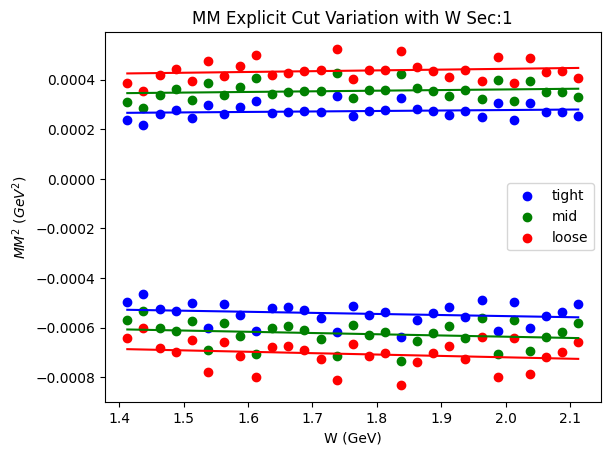

[ 2.82489886e-06 -5.96579784e-04]
[-5.09170638e-05  3.89933053e-04]
[ 8.19909838e-06 -6.95231073e-04]
[-5.62912558e-05  4.88584328e-04]
[ 1.35732500e-05 -7.93882278e-04]
[-6.16654477e-05  5.87235604e-04]


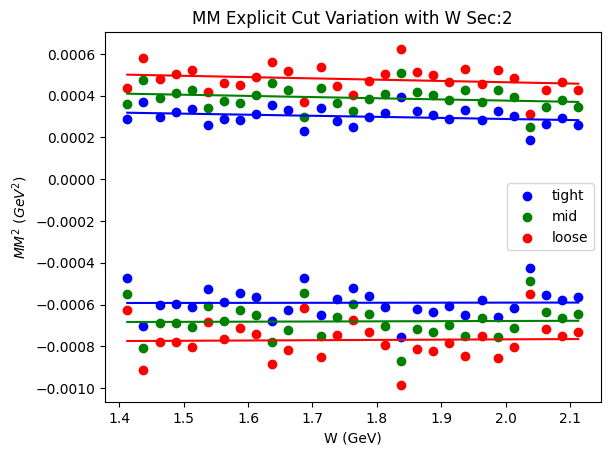

[-0.0002419  -0.00010871]
[1.23430431e-04 4.68345227e-05]
[-0.00027843 -0.00012426]
[1.59963031e-04 6.23887423e-05]
[-0.00031496 -0.0001283 ]
[1.96495638e-04 7.79429504e-05]


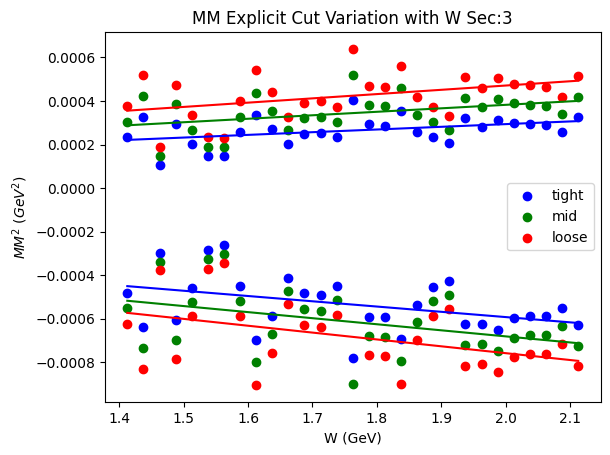

[-2.46240641e-05 -5.32139995e-04]
[-7.64393465e-06  3.05074554e-04]
[-2.63220602e-05 -6.15861479e-04]
[-5.94592088e-06  3.88796007e-04]
[-2.80201103e-05 -6.99582869e-04]
[-4.2479071e-06  4.7251746e-04]


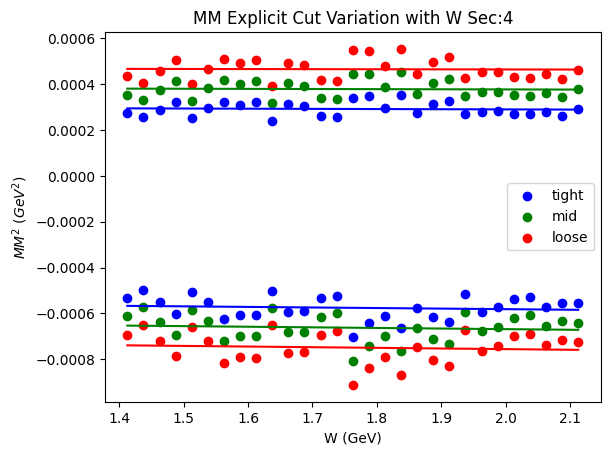

[ 2.16514988e-06 -6.03563810e-04]
[-1.99333688e-05  3.32615934e-04]
[ 4.37500362e-06 -6.97181787e-04]
[-2.21432256e-05  4.26233917e-04]
[ 6.58485736e-06 -7.90799764e-04]
[-2.43530752e-05  5.19851887e-04]


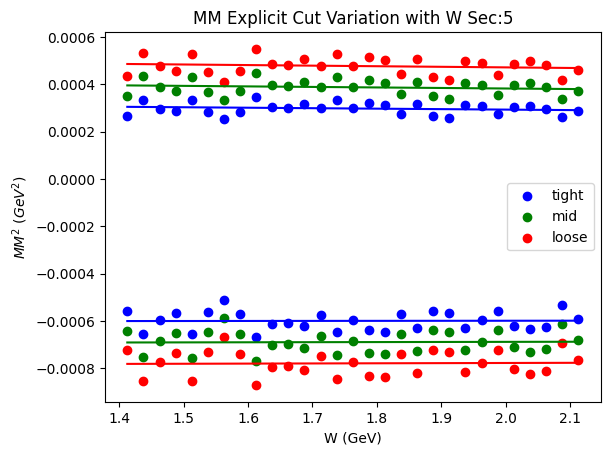

[-0.00016048 -0.00026884]
[6.7564434e-05 1.6100165e-04]
[-0.00018328 -0.00031182]
[9.03686521e-05 2.03985771e-04]
[-0.00020609 -0.00035481]
[0.00011317 0.00024697]


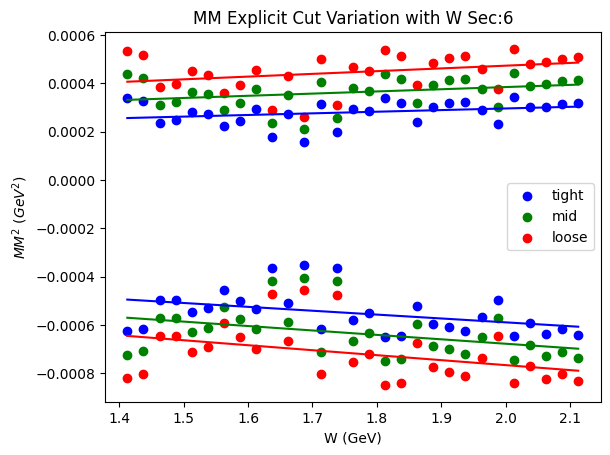

In [16]:
W_bins = [W_center(i) for i in range(_W_bins_)]

y_bou = [-0.001,0.001]

def Linear(x_, a_, b_):
    return a_*x_ + b_

#sec,side,tightness,parameters
var_cut_bounds = np.zeros((6,2,3,2))

color_order = ['b','g','r']
cut_names=['tight','mid','loose']

ini_par = [[ 3.25244146e-05, -5.87718393e-04],[-8.37597271e-05,  4.71230464e-04]]

for sec in range(6):
#     x = W_bins
    
    
#     y_tight_w1 = Bounds_on_Y([cut_bounds[sec][Wbin][0][0] for Wbin in range(_W_bins_)],y_bou[0],y_bou[1])
#     y_tight_w2 = Bounds_on_Y([cut_bounds[sec][Wbin][1][0] for Wbin in range(_W_bins_)],y_bou[0],y_bou[1])
#     y_mid_w1 = Bounds_on_Y([cut_bounds[sec][Wbin][0][1] for Wbin in range(_W_bins_)],y_bou[0],y_bou[1])
#     y_mid_w2 = Bounds_on_Y([cut_bounds[sec][Wbin][1][1] for Wbin in range(_W_bins_)],y_bou[0],y_bou[1])
#     y_loose_w1 = Bounds_on_Y([cut_bounds[sec][Wbin][0][2] for Wbin in range(_W_bins_)],y_bou[0],y_bou[1])
#     y_loose_w2 = Bounds_on_Y([cut_bounds[sec][Wbin][1][2] for Wbin in range(_W_bins_)],y_bou[0],y_bou[1])
#     x_tight_w1 = Bounds_on_X_From_Y(x,[cut_bounds[sec][Wbin][0][0] for Wbin in range(_W_bins_)],y_bou[0],y_bou[1])
#     x_tight_w2 = Bounds_on_X_From_Y(x,[cut_bounds[sec][Wbin][1][0] for Wbin in range(_W_bins_)],y_bou[0],y_bou[1])
#     x_mid_w1 = Bounds_on_X_From_Y(x,[cut_bounds[sec][Wbin][0][1] for Wbin in range(_W_bins_)],y_bou[0],y_bou[1])
#     x_mid_w2 = Bounds_on_X_From_Y(x,[cut_bounds[sec][Wbin][1][1] for Wbin in range(_W_bins_)],y_bou[0],y_bou[1])
#     x_loose_w1 = Bounds_on_X_From_Y(x,[cut_bounds[sec][Wbin][0][2] for Wbin in range(_W_bins_)],y_bou[0],y_bou[1])
#     x_loose_w2 = Bounds_on_X_From_Y(x,[cut_bounds[sec][Wbin][1][2] for Wbin in range(_W_bins_)],y_bou[0],y_bou[1])
                  
    
    
    #y_tight_w1_err = [cut_bounds_err[sec][Wbin][0][0] for Wbin in range(_W_bins_)]
    #y_tight_w2_err = [cut_bounds_err[sec][Wbin][1][0] for Wbin in range(_W_bins_)]
    #y_mid_w1_err = [cut_bounds_err[sec][Wbin][0][1] for Wbin in range(_W_bins_)]
    #y_mid_w2_err = [cut_bounds_err[sec][Wbin][1][1] for Wbin in range(_W_bins_)]
    #y_loose_w1_err = [cut_bounds_err[sec][Wbin][0][2] for Wbin in range(_W_bins_)]
    #y_loose_w2_err = [cut_bounds_err[sec][Wbin][1][2] for Wbin in range(_W_bins_)]
    for cut in range(3):
        for side in range(2):
            y = Remove_Zeros_Y(Bounds_on_Y([cut_bounds[sec][Wbin][side][cut] for Wbin in range(_W_bins_)],y_bou[0],y_bou[1]))
            x = Remove_Zeros_X(Bounds_on_X_From_Y(W_bins,[cut_bounds[sec][Wbin][side][cut] for Wbin in range(_W_bins_)],y_bou[0],y_bou[1]),Bounds_on_Y([cut_bounds[sec][Wbin][side][cut] for Wbin in range(_W_bins_)],y_bou[0],y_bou[1]))
            if side ==0:
                plt.scatter(x,y,color=color_order[cut],label=cut_names[cut])
            else:
                plt.scatter(x,y,color=color_order[cut])
            try:
                pars, pars_cov = op.curve_fit(Linear,x,y,maxfev=5000,p0=ini_par[side])
                cont_x = np.linspace(np.min(x),np.max(x),200)
                plt.plot(cont_x,Linear(cont_x,pars[0],pars[1]),color=color_order[cut])
                var_cut_bounds[sec][side][cut][0] = pars[0]
                var_cut_bounds[sec][side][cut][1] = pars[1]
                print(var_cut_bounds[sec][side][cut])
                
            except RuntimeError:
                print("Runtime Error 2.0\n\tJust skip it for now")
            except ValueError:
                print("Value Error 2.0\n\tJust skip it for now")
            
    
#     plt.scatter(W_bins,y_tight_w1,color='b',label="tight +-{}\u03C3".format(tight))
#     #plt.errorbar(W_bins,y_tight_w1,yerr=y_tight_w1_err,color='b',ls='none')
#     plt.scatter(W_bins,y_tight_w2,color='b',)
#     #plt.errorbar(W_bins,y_tight_w2,yerr=y_tight_w2_err,color='b',ls='none')
#     plt.scatter(W_bins,y_mid_w1,color='g',label="mid +-{}\u03C3".format(mid))
#     #plt.errorbar(W_bins,y_mid_w1,yerr=y_mid_w1_err,color='g',ls='none')
#     plt.scatter(W_bins,y_mid_w2,color='g')
#     #plt.errorbar(W_bins,y_mid_w2,yerr=y_mid_w2_err,color='g',ls='none')
#     plt.scatter(W_bins,y_loose_w1,color='r',label="loose +-{}\u03C3".format(loose))
#     #plt.errorbar(W_bins,y_loose_w1,yerr=y_loose_w1_err,color='r',ls='none')
#     plt.scatter(W_bins,y_loose_w2,color='r')
#     #plt.errorbar(W_bins,y_loose_w2,yerr=y_loose_w2_err,color='r',ls='none')
#     plt.hlines(cut_bounds[sec][_W_bins_][0][0],_W_min_,_W_max_,color='y')
#     plt.hlines(cut_bounds[sec][_W_bins_][1][0],_W_min_,_W_max_,color='y')
#     plt.hlines(cut_bounds[sec][_W_bins_][0][1],_W_min_,_W_max_,color='m')
#     plt.hlines(cut_bounds[sec][_W_bins_][1][1],_W_min_,_W_max_,color='m')
#     plt.hlines(cut_bounds[sec][_W_bins_][0][2],_W_min_,_W_max_,color='c')
#     plt.hlines(cut_bounds[sec][_W_bins_][1][2],_W_min_,_W_max_,color='c')
    plt.legend()
    plt.title("MM {} Cut Variation with W Sec:{}".format(Particle,sec+1))
    plt.xlabel("W (GeV)")
    plt.ylabel(r"$MM^2$ ($GeV^2$)")
    plt.show()
    
    
    
    

<function matplotlib.pyplot.show(close=None, block=None)>

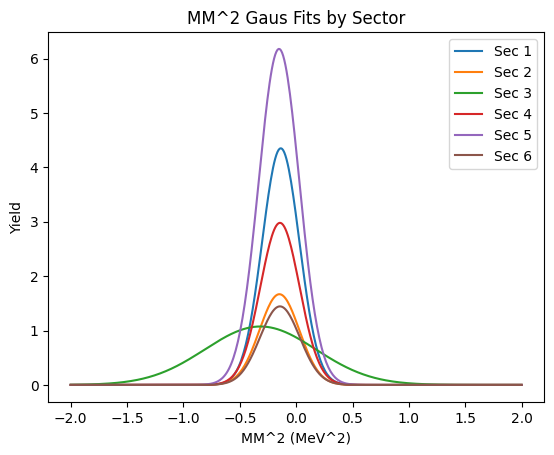

In [14]:
Wbin = _W_bins_
for sec in range(6):
    tmp_x2 = np.linspace(-0.002,0.002,400)
    tmp_x3 = 1000*tmp_x2
    plt.plot(tmp_x3,Gaus(tmp_x2,*gaus1_pars[sec][Wbin]),label="Sec {}".format(sec+1))
plt.legend()
plt.title("MM^2 Gaus Fits by Sector")
plt.ylabel("Yield")
plt.xlabel("MM^2 (MeV^2)")
plt.show

In [10]:
# print("MM "+Particle+" Cut Bounds [sec][low/high][tight/mid/loose]")
# for sec in range(6):
#     for side in range(2):
#         for t in range(3):
#             if t == 0:
#                 if side ==0:
#                     if sec==0:
#                         print("{\t{\t{",cut_bounds[sec][_W_bins_][side][t],end=",")
#                     else:
#                         print("\t{\t{",cut_bounds[sec][_W_bins_][side][t],end=",")
#                 else:
#                     print("{",cut_bounds[sec][_W_bins_][side][t],end=",")
#             elif t == 2:
#                 if side == 1:
#                     if sec == 5:
#                         print(cut_bounds[sec][_W_bins_][side][t],"}}}")
#                     else:
#                         print(cut_bounds[sec][_W_bins_][side][t],"}},")
#                 else: 
#                     print(cut_bounds[sec][_W_bins_][side][t],"},")
#             else: 
#                 print(cut_bounds[sec][_W_bins_][side][t],end=",")



In [15]:
print("MM^2 "+Particle+" Linear Cut Bounds [sec][low/high][tight/mid/loose][intercept,slope]")
for sec in range(6):
    for side in range(2):
        for t in range(3):
            for p in range(2):
                if p==0:
                    if t == 0:
                        if side ==0:
                            if sec==0:
                                print("{\t{\t{\t{",var_cut_bounds[sec][side][t][p],end=",")
                            else:
                                print("\t{\t{\t{",var_cut_bounds[sec][side][t][p],end=",")
                        else:
                            print("\t\t{\t{",var_cut_bounds[sec][side][t][p],end=",")
                    else:
                        print("{",var_cut_bounds[sec][side][t][p],end=",")
                elif p == 1:
                    if t == 2:
                        if side == 1:
                            if sec == 5:
                                print("",var_cut_bounds[sec][side][t][p],"}}}}")
                            else:
                                print("",var_cut_bounds[sec][side][t][p],"}}},")
                        else: 
                            print("",var_cut_bounds[sec][side][t][p],"}},")
                    else:
                        print("",var_cut_bounds[sec][side][t][p],end="},")
                else: 
                    print(var_cut_bounds[sec][side][t][p],end=",")

MM^2 Explicit Linear Cut Bounds [sec][low/high][tight/mid/loose][intercept,slope]
{	{	{	{ -4.340554049790445e-05, -0.0004664411128594822},{ -4.965812893021027e-05, -0.0005370302362833431},{ -5.591071736251605e-05, -0.0006076193597072041 }},
		{	{ 1.9120341212071672e-05, 0.0002394501277394307},{ 2.5372934083628093e-05, 0.0003100392434000997},{ 3.1625522968042206e-05, 0.00038062836619228785 }}},
	{	{	{ 2.8248988637105197e-06, -0.0005965797838341578},{ 8.1990983785337e-06, -0.0006952310730241759},{ 1.3573250039286698e-05, -0.0007938822784385784 }},
		{	{ -5.0917063820062943e-05, 0.00038993305266210614},{ -5.6291255753338585e-05, 0.000488584328485155},{ -6.166544770617388e-05, 0.0005872356041722638 }}},
	{	{	{ -0.00024189555526169418, -0.00010870771352566291},{ -0.0002784281561498062, -0.00012426193284186535},{ -0.00031496073685061956, -0.00012829890613320148 }},
		{	{ 0.00012343043068816314, 4.6834522675125666e-05},{ 0.0001599630311572594, 6.238874225090265e-05},{ 0.0001964956383494971, 7